In [201]:
import numpy as np
import matplotlib.pyplot as plt
import ultranest
import read_beam_FEKO as rf
import scipy.interpolate
import scipy.optimize

In [2]:
o = rf.read_beam_FEKO('nominal.out',0)

 Frequency in Hz:               FREQ =    2.50000E+07

 Frequency in Hz:               FREQ =    2.60000E+07

 Frequency in Hz:               FREQ =    2.70000E+07

 Frequency in Hz:               FREQ =    2.80000E+07

 Frequency in Hz:               FREQ =    2.90000E+07

 Frequency in Hz:               FREQ =    3.00000E+07

 Frequency in Hz:               FREQ =    3.10000E+07

 Frequency in Hz:               FREQ =    3.20000E+07

 Frequency in Hz:               FREQ =    3.30000E+07

 Frequency in Hz:               FREQ =    3.40000E+07

 Frequency in Hz:               FREQ =    3.50000E+07

 Frequency in Hz:               FREQ =    3.60000E+07

 Frequency in Hz:               FREQ =    3.70000E+07

 Frequency in Hz:               FREQ =    3.80000E+07

 Frequency in Hz:               FREQ =    3.90000E+07

 Frequency in Hz:               FREQ =    4.00000E+07

 Frequency in Hz:               FREQ =    4.10000E+07

 Frequency in Hz:               FREQ =    4.20000E+07

 Frequency

In [4]:
# Define theta as an array from [90 to 0]. phi is from [0 to 359], freq from [25 to 125 MHz]
theta = 90 - o[2]
phi = o[1]
freq = o[0]
gain = o[5]
xx, yy = np.meshgrid(theta, phi)
theta = xx
phi = yy
#xx is for theta, and yy is for phi

In [16]:
#The fundamental TDH functions
#Acos,Asin taken theta in degree
def Acos(R, theta, miu, nu):
    part1 = np.cos(miu*theta*np.pi/180)*(R/(sigma/1.43))**miu
    part2 = P(miu,nu,R**2/(sigma/1.43)**2)
    part3 = np.exp(-R**2/(4*(sigma/1.43)**2))
    return part1*part2*part3

def Asin(R, theta, miu, nu):
    part1 = np.sin(miu*theta*np.pi/180)*(R/(sigma/1.43))**miu
    part2 = P(miu,nu,R**2/(sigma/1.43)**2)
    part3 = np.exp(-R**2/(4*(sigma/1.43)**2))
    return part1*part2*part3

def P(miu,nu,u):
    terms = []
    p = 0
    while p <= nu:
        up = np.math.factorial(miu + nu)*np.math.factorial(nu)
        down = np.math.factorial(miu + p)*np.math.factorial(p)*np.math.factorial(nu-p)
        term = (-2)**(nu-p)* up/down * u**p
        terms.append(term)
        p += 1
    terms = np.array(terms)
    return np.sum(terms,axis = 0)

In [17]:
#Normalization
def normalize(array):
    q = 0
    theta = 0
    while theta <= 90:
        for i in range(360):
            q += (array[theta*360 + i])**2 * (np.pi/180)**2 * np.sin(theta*np.pi/180)
        theta += 1
    return array/q

def TDH(rank):
    """return matrix A = [f1, f2, f3, ...] for rank 0 to rank TDH functions"""
    zz00c = Acos(theta, phi, 0, 0)
    zz00c2d = zz00c.flatten()
    array = normalize(zz00c2d)
    r = 1
    while r <= rank:
        m = 0
        while m <= r:
            if (r - m)%2 == 0:
                n = (r - m)/2
                if m == 0:
                    cosine = Acos(theta,phi,m,n)
                    cosine2d = cosine.flatten()
                    ncos = normalize(cosine2d)
                    array = np.vstack((array, ncos))
                    m += 2
                else:
                    cosine = Acos(theta,phi,m,n)
                    cosine2d = cosine.flatten()
                    ncos = normalize(cosine2d)
                    sine = Asin(theta,phi,m,n)
                    sine2d = sine.flatten()
                    nsin = normalize(sine2d)
                    array = np.vstack((array, ncos))
                    array = np.vstack((array, nsin))
                    m += 2
            else:
                m += 1
        r += 1
    matrix = np.matrix(array).T
    return matrix

def model(rank, coe):
    A = TDH(rank)
    a = np.matrix(coe).T
    return np.matmul(A,a)

def simulation(coe, sigma):
    rank = 0
    count = 1
    length = len(coe) - 1
    while length > count:
        rank += 1
        count += rank + 1
    mo = model(rank,coe)
    noise = np.random.default_rng().normal(0.0, sigma*np.max(mo),360*91)
    noi = np.matrix(noise).T
    data = mo + noi
    return data

def solve(A, data):
    AT = A.T
    ATA = np.matmul(AT,A)
    ATAinverse = np.linalg.inv(ATA)
    half = np.matmul(ATAinverse,AT)
    x = np.matmul(half,data)
    return x

def residual(A,data):
    x = solve(A, data)
    AT = A.T
    fittingmodel = np.matmul(A, x)
    r = data - fittingmodel
    return r

def residual2D(A,data):
    r = residual(A,data)
    r2D = r.reshape(360,91)
    return r2D

def covariance(A,data):
    AT = A.T
    ATA = np.matmul(AT,A)
    ATAinverse = np.linalg.inv(ATA)
    r = residual(A,data)
    rT = r.T
    rTr = np.matmul(rT,r)
    s = rTr/((len(data))-len(AT)) 
    '''Originally: s = rTr/((len(data))-10). I think the 10 is weird.'''
    s2 = s.item(0)
    covariance = s2*ATAinverse
    return covariance

In [161]:
# 2D Gaussian data fitting using UltraNest
#Which one
def Gaussian2D(A, sigx, sigy):
    return A * np.exp(-(np.sin(theta*np.pi/180)*np.cos(phi*np.pi/180))**2/2/sigx**2 - (np.sin(theta*np.pi/180)*np.sin(phi*np.pi/180))**2/2/sigy**2)

def Gaussian2D(A, sigx, sigy):
    return A * np.exp(-(theta*np.pi/180*np.cos(phi*np.pi/180))**2/2/sigx**2 - (theta*np.pi/180*np.sin(phi*np.pi/180))**2/2/sigy**2) 

# Define model to simulate data
def model1(paras):
    A, sigx, sigy = paras
    return Gaussian2D(A,sigx,sigy).T

sigma = np.std(gain[0])
param_names = ['A', 'sigx', 'sigy']
def my_prior_transform(cube):
    params = cube.copy()

    # transform location parameter: uniform prior
    lo = 0
    hi = 10
    params[0] = cube[0] * (hi - lo) + lo

    lo = 0
    hi = 2
    params[1] = cube[1] * (hi - lo) + lo

    lo = 0
    hi = 2
    params[1] = cube[1] * (hi - lo) + lo
    
    return params
def my_likelihood(params):
    mo = model1(params)
    diff = gain[0] - mo
    return -0.5 * np.sum((diff/sigma)**2)

In [162]:
sampler = ultranest.ReactiveNestedSampler(param_names, my_likelihood, my_prior_transform)
result = sampler.run(min_num_live_points=200)
sampler.print_results()

[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .79 [-185.8433..-185.8433]*| it/evals=4455/8918 eff=51.1012% N=200 0  0  0 0 0 0 0 
[ultranest] Likelihood function evaluations: 8919
[ultranest]   logZ = -203.5 +- 0.1775
[ultranest] Effective samples strategy satisfied (ESS = 934.9, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.13 to 0.55, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.18 tail:0.01 total:0.18 required:<0.50
[ultranest] done iterating.

logZ = -203.500 +- 0.315
  single instance: logZ = -203.500 +- 0.284
  bootstrapped   : logZ = -203.515 +- 0.314
  tail           : logZ = +- 0.010
insert order U test : converged: True correlation: inf iterations

    A                   : 0.5271│ ▁▁▁▁▁▁▁▁▁▁▂▂▃▄▄▄▅▇▇▇▆▆▅▆▆▃▄▂▂▁▁▁▁▁▁▁▁ │0.5424    0.5353 +- 0.0020
    sigx                : 0.6426│ ▁  ▁▁▁▁▁▁▂▃▄▅▅▆▆▆▇▇▇▅▄▃▃▂▁▁▁▁▁▁ ▁   ▁ │0.6821  

In [158]:
sigma = np.sqrt(np.average(result['samples'].T[2])*np.average(result['samples'].T[1])) *180/np.pi

In [40]:
sigma

39.05448052525138

In [56]:
sigrange = np.linspace(0.8*sigma, 2.5*sigma,100)

In [49]:
pctotal = []
coetotal = []
TDHtotal = []
for sigma in sigrange:
    A = TDH(7)
    data = np.matrix(gain[0].T.flatten())
    coe = solve(A,data.T)
    finalresi = residual2D(A,data.T)
    meansquare = np.sum(np.multiply(finalresi,finalresi))/(360*91)
    rms = np.sqrt(meansquare)
    pctotal.append(rms/np.max(gain[0])*100)
    TDHtotal.append(A)

In [46]:
pc25825 = pctotal

<IPython.core.display.Javascript object>


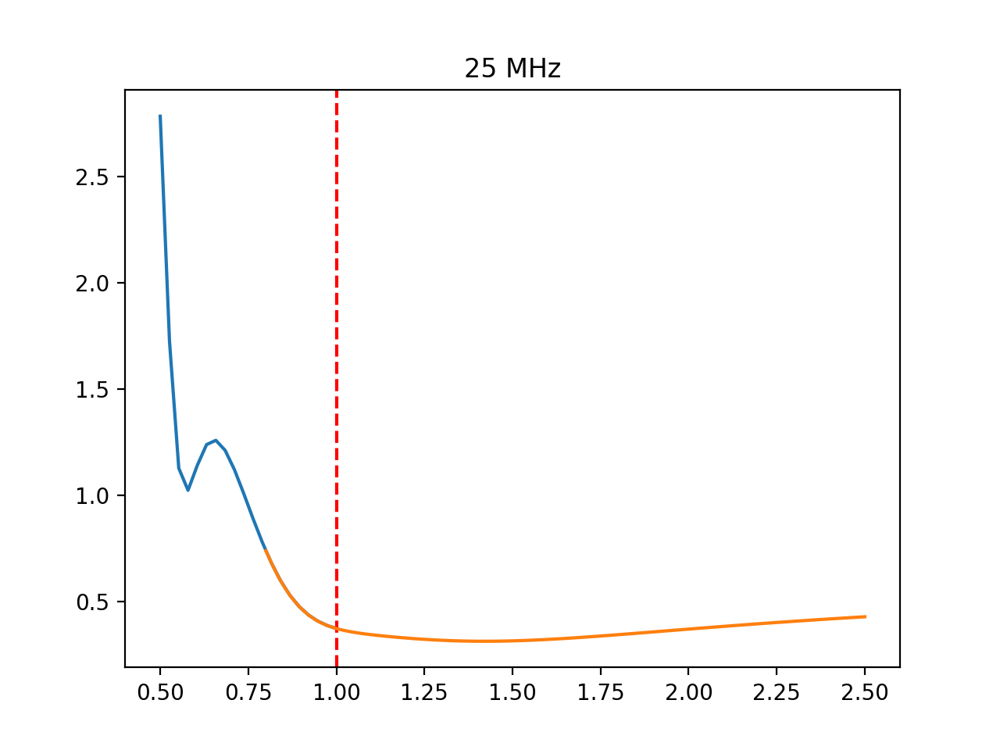

Text(0.5, 1.0, '25 MHz')

In [66]:
plt.plot(np.linspace(0.5,1,20),pctotal)
plt.axvline(x = 1, color='r', linestyle='--', label = "0.1")
plt.title("25 MHz")

<IPython.core.display.Javascript object>


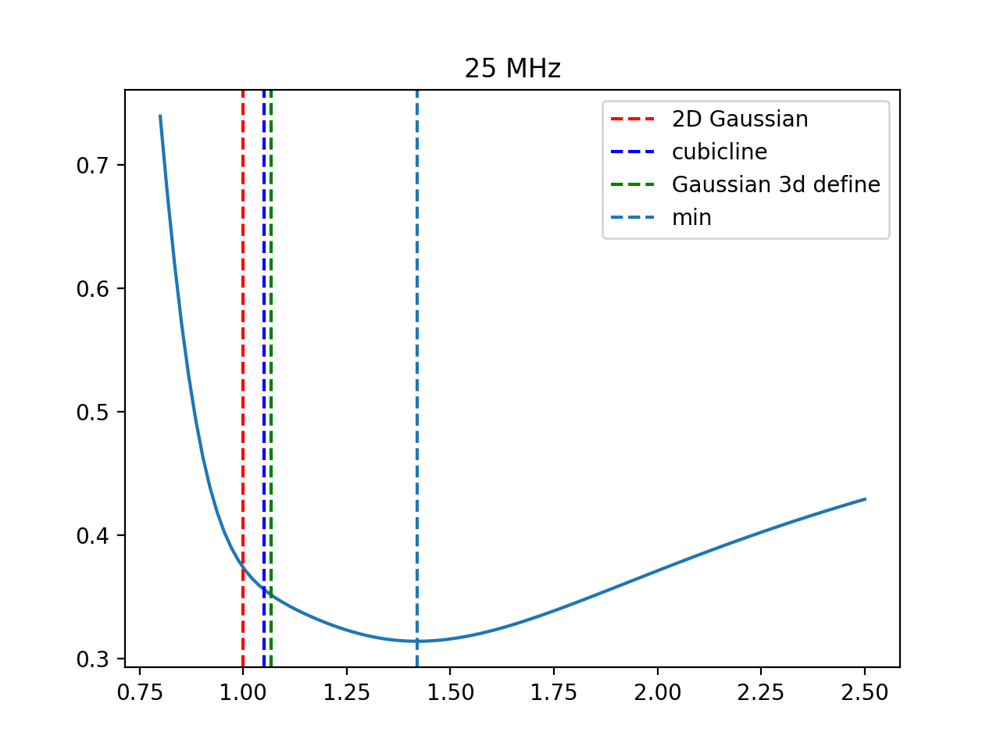

Text(0.5, 1.0, '25 MHz')

In [181]:
plt.figure()
plt.plot(np.linspace(0.8,2.5,100),pc25825)
plt.axvline(x = 1, color='r', linestyle='--', label = '2D Gaussian')
plt.axvline(x = 1.0511562383952386, color='b', linestyle='--', label = 'cubicline')
plt.axvline(x = 1.067, color = 'g', linestyle='--', label = 'Gaussian 3d define')
plt.axvline(x = 1.42, linestyle='--', label = 'min')
plt.legend()
plt.title("25 MHz")

In [159]:
np.sqrt(0.5300*0.5577)*180/np.pi/sigma

1.067203472947603

In [65]:
pc25825[12]-pc25825[36]

0.057126223949390875

In [53]:
pc25825.index(min(pc25825))

36

In [107]:
sigrange[36]/sigma

1.4181818181818182

In [74]:
def index_nearest(array, value):
    """
    return index of array *nearest* to value

    >>> ix = index_nearest(array, value)

    Arguments
    ---------
    array  (ndarray-like):  array to find index in
    value  (float): value to find index of

    Returns
    -------
    integer for index in array nearest value

    """
    return np.abs(array-value).argmin()
first = gain[0].T[0]
last = gain[0].T[90]
x = np.flip(theta.flatten()[:91])
interpo1 = scipy.interpolate.CubicSpline(x,np.flip(first))
interpo2 = scipy.interpolate.CubicSpline(x,np.flip(last))
xnew = np.linspace(0,90,90000)
inter1 = np.flip(interpo1(xnew))
inter2 = np.flip(interpo2(xnew))
sigy = index_nearest(inter1,np.max(gain[0])/2)
sigx = index_nearest(inter2,np.max(gain[0])/2)

<IPython.core.display.Javascript object>


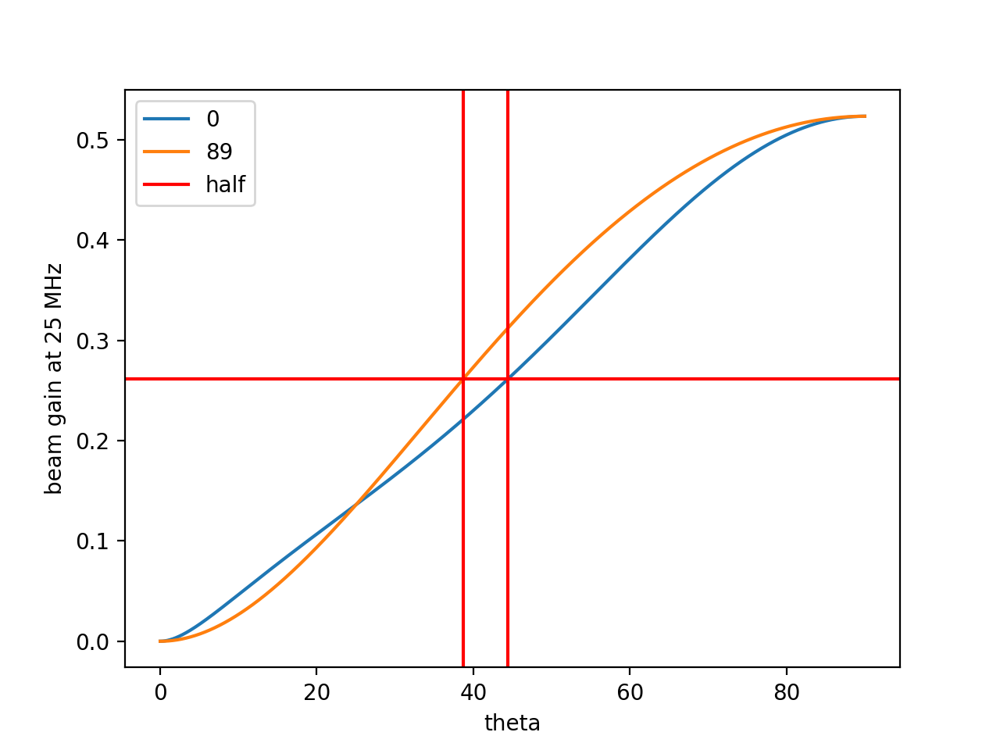

In [100]:
plt.figure()
plt.plot(xnew,inter1,label = "0")
plt.plot(xnew,inter2,label = "89")
plt.axhline(y = np.max(gain[0]/2), color='r', linestyle='-', label = "half")
plt.axvline(x = 44.44, color='r', linestyle='-')
plt.axvline(x = 38.72, color='r', linestyle='-')
plt.xlabel("theta")
plt.ylabel("beam gain at 25 MHz")
plt.legend()

In [99]:
sigx/90000*90

38.719

In [101]:
FWHM25 = np.sqrt(2*(90-44.44)*2*(90-38.72))

In [103]:
FWHM25/2/np.sqrt(2*np.log(2))/sigma

1.0511562383952386

# 125MHz

In [110]:
# 2D Gaussian data fitting using UltraNest
#Which one
def Gaussian2D(A, sigx, sigy):
    return A * np.exp(-(np.sin(theta*np.pi/180)*np.cos(phi*np.pi/180))**2/2/sigx**2 - (np.sin(theta*np.pi/180)*np.sin(phi*np.pi/180))**2/2/sigy**2)

def Gaussian2D(A, sigx, sigy):
    return A * np.exp(-(theta*np.pi/180*np.cos(phi*np.pi/180))**2/2/sigx**2 - (theta*np.pi/180*np.sin(phi*np.pi/180))**2/2/sigy**2) 

# Define model to simulate data
def model1(paras):
    A, sigx, sigy = paras
    return Gaussian2D(A,sigx,sigy).T

sigma = np.std(gain[100])
param_names = ['A', 'sigx', 'sigy']
def my_prior_transform(cube):
    params = cube.copy()

    # transform location parameter: uniform prior
    lo = 0
    hi = 10
    params[0] = cube[0] * (hi - lo) + lo

    lo = 0
    hi = 2
    params[1] = cube[1] * (hi - lo) + lo

    lo = 0
    hi = 2
    params[1] = cube[1] * (hi - lo) + lo
    
    return params
def my_likelihood(params):
    mo = model1(params)
    diff = mo - gain[100]
    return -0.5 * np.sum((diff/sigma)**2)

In [111]:
sampler = ultranest.ReactiveNestedSampler(param_names, my_likelihood, my_prior_transform)
result = sampler.run(min_num_live_points=200)
sampler.print_results()

[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .29 [-177.3459..-177.3457]*| it/evals=3980/7987 eff=51.1108% N=200 0 0   
[ultranest] Likelihood function evaluations: 7995
[ultranest]   logZ = -192.6 +- 0.1939
[ultranest] Effective samples strategy satisfied (ESS = 986.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.

logZ = -192.650 +- 0.336
  single instance: logZ = -192.650 +- 0.262
  bootstrapped   : logZ = -192.640 +- 0.335
  tail           : logZ = +- 0.010
insert order U test : converged: True correlation: inf iterations

    A                   : 5.062 │ ▁▁▁▁▁▁▁▂▂▂▃▄▅▆▆▇▇▇▇▆▅▅▄▃▂▂▂▁▁▁▁▁▁▁▁ ▁ │5.247     5.146 +- 0.024
    sigx                : 0.3065│ ▁▁▁▁▁▁▁▂▃▃▄▅▅▆▅▇▇▆▇▆▆▆▆▄▅▃▂▂▁▁▁▁▁▁▁▁▁ │0.3236    0.3147 +- 0.0024
    sigy               

In [128]:
sigma = np.sqrt(np.average(result['samples'].T[2])*np.average(result['samples'].T[1])) *180/np.pi

In [113]:
sigrange = np.linspace(0.5*sigma, 2.5*sigma,100)

In [120]:
pctotal = []
coetotal = []
TDHtotal = []
for sigma in sigrange:
    A = TDH(7)
    data = np.matrix(gain[100].T.flatten())
    coe = solve(A,data.T)
    finalresi = residual2D(A,data.T)
    meansquare = np.sum(np.multiply(finalresi,finalresi))/(360*91)
    rms = np.sqrt(meansquare)
    pctotal.append(rms/np.max(gain[100])*100)
    TDHtotal.append(A)

<IPython.core.display.Javascript object>


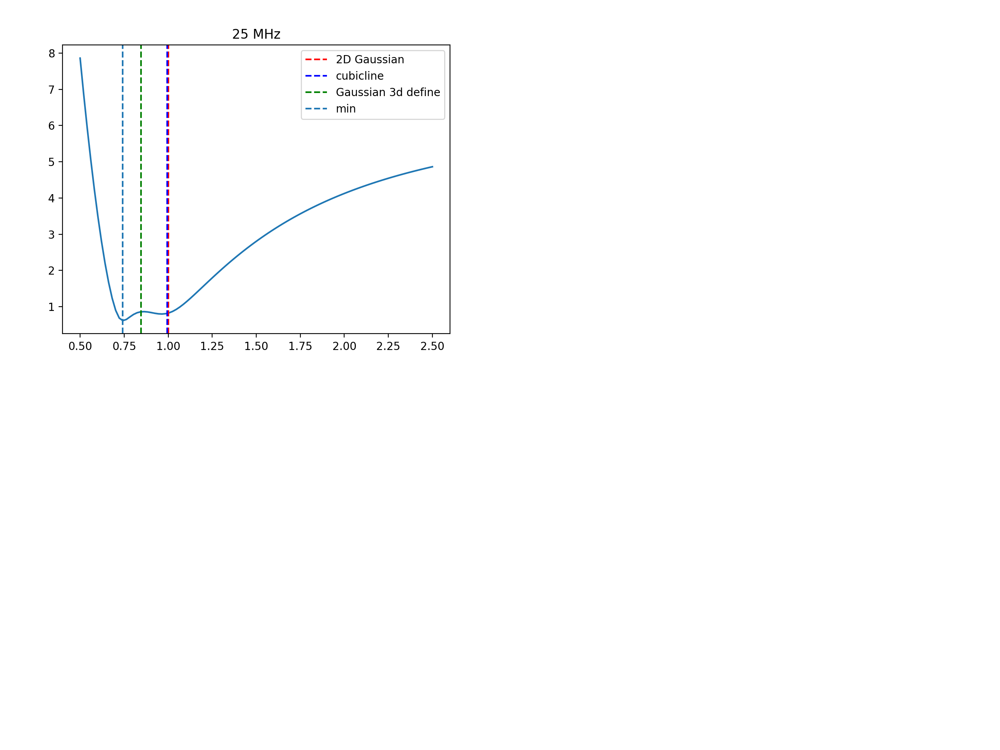

Text(0.5, 1.0, '25 MHz')

In [157]:
plt.figure()
plt.plot(np.linspace(0.5,2.5,100),pctotal)
plt.axvline(x = 1, color='r', linestyle='--', label = '2D Gaussian')
plt.axvline(x = 0.994, color='b', linestyle='--', label = 'cubicline')
plt.axvline(x = 0.845, color = 'g', linestyle='--', label = 'Gaussian 3d define')
plt.axvline(x = 0.7424, linestyle='--', label = 'min')
plt.legend()
plt.title("25 MHz")

In [155]:
np.sqrt(0.2920*0.6342)*180/np.pi/sigma

0.8447214403624251

In [136]:
pctotal.index(min(pctotal))

12

In [137]:
pctotal[12]

0.6145233777427708

In [138]:
sigrange[12]/sigma

0.7424242424242424

In [140]:
first = gain[100].T[0]
last = gain[100].T[90]
x = np.flip(theta.flatten()[:91])
interpo1 = scipy.interpolate.CubicSpline(x,np.flip(first))
interpo2 = scipy.interpolate.CubicSpline(x,np.flip(last))
xnew = np.linspace(0,90,90000)
inter1 = np.flip(interpo1(xnew))
inter2 = np.flip(interpo2(xnew))
sigy = index_nearest(inter1,np.max(gain[100])/2)
sigx = index_nearest(inter2,np.max(gain[100])/2)

<IPython.core.display.Javascript object>


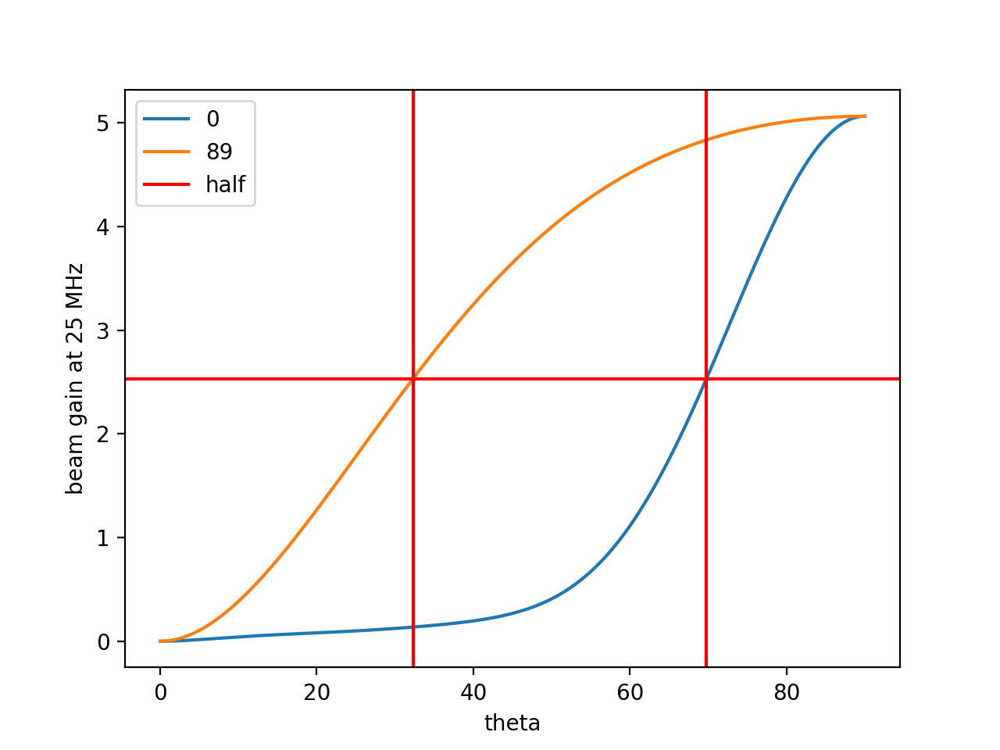

In [145]:
plt.figure()
plt.plot(xnew,inter1,label = "0")
plt.plot(xnew,inter2,label = "89")
plt.axhline(y = np.max(gain[100]/2), color='r', linestyle='-', label = "half")
plt.axvline(x = 69.77, color='r', linestyle='-')
plt.axvline(x = 32.287, color='r', linestyle='-')
plt.xlabel("theta")
plt.ylabel("beam gain at 25 MHz")
plt.legend()

In [147]:
FWHM125 = np.sqrt(2*(90 - sigx/90000*90)*2*(90-sigy/90000*90))

In [149]:
FWHM125/2/np.sqrt(2*np.log(2))/sigma

0.994195766766996

# Calculate Gaussian sigma for all freqs

In [164]:
#Find all the ratios
totalsigxg = []
totalsigyg = []
totalsigfwhm = []
for i in range(len(gain)):
    sigma = np.std(gain[i])
    param_names = ['A', 'sigx', 'sigy']
    def my_prior_transform(cube):
        params = cube.copy()

        # transform location parameter: uniform prior
        lo = 0
        hi = 10
        params[0] = cube[0] * (hi - lo) + lo

        lo = 0
        hi = 2
        params[1] = cube[1] * (hi - lo) + lo

        lo = 0
        hi = 2
        params[1] = cube[1] * (hi - lo) + lo

        return params
    def my_likelihood(params):
        mo = model1(params)
        diff = gain[i] - mo
        return -0.5 * np.sum((diff/sigma)**2)
    sampler = ultranest.ReactiveNestedSampler(param_names, my_likelihood, my_prior_transform)
    result = sampler.run(min_num_live_points=200)
    totalsigxg.append(np.average(result['samples'].T[1]))
    totalsigyg.append(np.average(result['samples'].T[2]))
    first = gain[i].T[0]
    last = gain[i].T[90]
    x = np.flip(theta.flatten()[:91])
    interpo1 = scipy.interpolate.CubicSpline(x,np.flip(first))
    interpo2 = scipy.interpolate.CubicSpline(x,np.flip(last))
    xnew = np.linspace(0,90,90000)
    inter1 = np.flip(interpo1(xnew))
    inter2 = np.flip(interpo2(xnew))
    sigy = index_nearest(inter1,np.max(gain[i])/2)
    sigx = index_nearest(inter2,np.max(gain[i])/2)
    FWHM = np.sqrt(2*(90 - sigx/90000*90)*2*(90-sigy/90000*90))
    totalsigfwhm.append(FWHM/2/np.sqrt(2*np.log(2)))

[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .78 [-185.8482..-185.8482]*| it/evals=4460/9212 eff=49.4896% N=200    0   0 0   0  
[ultranest] Likelihood function evaluations: 9218
[ultranest]   logZ = -203.5 +- 0.2142
[ultranest] Effective samples strategy satisfied (ESS = 937.6, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.21, need <0.5)
[ultranest]   logZ error budget: single: 0.29 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .24 [-184.2915..-184.2914]*| it/evals=4410/8793 eff=51.3208% N=200 0  0   0 0   0  
[ultranest] Likelihood function evaluations: 8805
[ultranest]   logZ = -201.8 +- 0.2044
[ultranest] Effective samples strategy satisfied (ESS = 958.5, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .82 [-182.8706..-182.8704]*| it/evals=4300/8546 eff=51.5217% N=200 0  0   0 0 0 0  
[ultranest] Likelihood function evaluations: 8566
[ultranest]   logZ = -199.8 +- 0.1631
[ultranest] Effective samples strategy satisfied (ESS = 913.1, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.16, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.16 tail:0.01 total:0.16 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .51 [-181.5648..-181.5648]*| it/evals=4440/8759 eff=51.8752% N=200    0   0 0 0 0 
[ultranest] Likelihood function evaluations: 8764
[ultranest]   logZ = -199.2 +- 0.2065
[ultranest] Effective samples strategy satisfied (ESS = 973.1, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.21, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .29 [-180.3580..-180.3579]*| it/evals=4340/8578 eff=51.8023% N=200    0     0   0 
[ultranest] Likelihood function evaluations: 8594
[ultranest]   logZ = -197.4 +- 0.1896
[ultranest] Effective samples strategy satisfied (ESS = 929.9, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .16 [-179.2289..-179.2284]*| it/evals=4460/8616 eff=52.9943% N=200 0  0  0 0 0 0  
[ultranest] Likelihood function evaluations: 8623
[ultranest]   logZ = -196.8 +- 0.2126
[ultranest] Effective samples strategy satisfied (ESS = 927.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.44+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.21, need <0.5)
[ultranest]   logZ error budget: single: 0.29 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .10 [-178.1630..-178.1628]*| it/evals=4300/8668 eff=50.7794% N=200 0  0  00 0 0 0 
[ultranest] Likelihood function evaluations: 8668
[ultranest]   logZ = -195.1 +- 0.2137
[ultranest] Effective samples strategy satisfied (ESS = 919.5, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.21, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .12 [-177.1832..-177.1827]*| it/evals=4260/8576 eff=50.8596% N=200    0   00 00 
[ultranest] Likelihood function evaluations: 8592
[ultranest]   logZ = -193.9 +- 0.1811
[ultranest] Effective samples strategy satisfied (ESS = 950.6, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.18, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.18 tail:0.01 total:0.18 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .21 [-176.2661..-176.2658]*| it/evals=4440/9137 eff=49.6811% N=200  0 0   0  0 0 
[ultranest] Likelihood function evaluations: 9137
[ultranest]   logZ = -193.8 +- 0.2019
[ultranest] Effective samples strategy satisfied (ESS = 982.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .35 [-175.4041..-175.4040]*| it/evals=4360/8340 eff=53.5627% N=200    0  0   00 
[ultranest] Likelihood function evaluations: 8355
[ultranest]   logZ = -192.6 +- 0.1857
[ultranest] Effective samples strategy satisfied (ESS = 971.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.12 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .55 [-174.6108..-174.6107]*| it/evals=4260/8620 eff=50.5938% N=200  0 0  00 0  
[ultranest] Likelihood function evaluations: 8642
[ultranest]   logZ = -191.3 +- 0.192
[ultranest] Effective samples strategy satisfied (ESS = 977.6, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.13 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .80 [-173.8553..-173.8547]*| it/evals=4260/8351 eff=52.2635% N=200    0   0 0  
[ultranest] Likelihood function evaluations: 8368
[ultranest]   logZ = -190.6 +- 0.1745
[ultranest] Effective samples strategy satisfied (ESS = 956.6, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.12 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.17, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.17 tail:0.01 total:0.17 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .10 [-173.1666..-173.1663]*| it/evals=4185/8329 eff=51.4823% N=200 0  0   0 0  
[ultranest] Likelihood function evaluations: 8329
[ultranest]   logZ = -189.5 +- 0.1967
[ultranest] Effective samples strategy satisfied (ESS = 919.1, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.16 to 0.59, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .44 [-172.4974..-172.4971]*| it/evals=4220/8481 eff=50.9600% N=200 0  0   0 0  
[ultranest] Likelihood function evaluations: 8481
[ultranest]   logZ = -188.9 +- 0.2027
[ultranest] Effective samples strategy satisfied (ESS = 935.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .82 [-171.8765..-171.8755]*| it/evals=4380/8480 eff=52.8986% N=200 0  0   0 0  
[ultranest] Likelihood function evaluations: 8498
[ultranest]   logZ = -189.2 +- 0.1743
[ultranest] Effective samples strategy satisfied (ESS = 939.2, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.17, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.17 tail:0.01 total:0.17 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .25 [-171.3070..-171.3069]*| it/evals=4140/8311 eff=51.0418% N=200    0  0 0  
[ultranest] Likelihood function evaluations: 8333
[ultranest]   logZ = -187.5 +- 0.1994
[ultranest] Effective samples strategy satisfied (ESS = 891.9, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.07 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .70 [-170.7583..-170.7582]*| it/evals=4220/8381 eff=51.5829% N=200    0    0  
[ultranest] Likelihood function evaluations: 8397
[ultranest]   logZ = -187.3 +- 0.2829
[ultranest] Effective samples strategy satisfied (ESS = 895.6, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.07 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.23 to 0.67, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.28 tail:0.01 total:0.28 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .19 [-170.2469..-170.2468]*| it/evals=4300/8564 eff=51.4108% N=200    0   0 0  
[ultranest] Likelihood function evaluations: 8571
[ultranest]   logZ = -187.1 +- 0.2087
[ultranest] Effective samples strategy satisfied (ESS = 956.5, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.48+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.21, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .71 [-169.7724..-169.7723]*| it/evals=4360/8795 eff=50.7272% N=200 0  0   0 0  
[ultranest] Likelihood function evaluations: 8801
[ultranest]   logZ = -187 +- 0.1967
[ultranest] Effective samples strategy satisfied (ESS = 1029.6, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.16 to 0.55, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .25 [-169.3022..-169.3021]*| it/evals=4300/8546 eff=51.5217% N=200    0   0 0  
[ultranest] Likelihood function evaluations: 8562
[ultranest]   logZ = -186.3 +- 0.184
[ultranest] Effective samples strategy satisfied (ESS = 967.5, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.12 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.18, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.18 tail:0.01 total:0.18 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .83 [-168.8861..-168.8860]*| it/evals=4200/8399 eff=51.2258% N=200    0  0 0  
[ultranest] Likelihood function evaluations: 8416
[ultranest]   logZ = -185.3 +- 0.1991
[ultranest] Effective samples strategy satisfied (ESS = 941.6, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.15 to 0.54, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .42 [-168.4743..-168.4741]*| it/evals=4200/8499 eff=50.6085% N=200 0  0   0 0  
[ultranest] Likelihood function evaluations: 8502
[ultranest]   logZ = -184.9 +- 0.191
[ultranest] Effective samples strategy satisfied (ESS = 923.3, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .04 [-168.1078..-168.1078]*| it/evals=4200/8534 eff=50.3960% N=200 0  0  00 0  
[ultranest] Likelihood function evaluations: 8542
[ultranest]   logZ = -184.5 +- 0.2575
[ultranest] Effective samples strategy satisfied (ESS = 950.6, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.19 to 0.87, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.26 tail:0.01 total:0.26 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .69 [-167.7379..-167.7378]*| it/evals=4300/8138 eff=54.1698% N=200 0  0  0 0 0 
[ultranest] Likelihood function evaluations: 8174
[ultranest]   logZ = -184.7 +- 0.2339
[ultranest] Effective samples strategy satisfied (ESS = 945.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.18 to 0.57, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.23 tail:0.01 total:0.23 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .35 [-167.4146..-167.4145]*| it/evals=4140/8107 eff=52.3587% N=200 0  0  0 0  
[ultranest] Likelihood function evaluations: 8135
[ultranest]   logZ = -183.6 +- 0.19
[ultranest] Effective samples strategy satisfied (ESS = 924.2, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.12 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.14 to 0.51, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .03 [-167.0771..-167.0770]*| it/evals=4120/8094 eff=52.1915% N=200 0  00 0 0  
[ultranest] Likelihood function evaluations: 8120
[ultranest]   logZ = -183.2 +- 0.1783
[ultranest] Effective samples strategy satisfied (ESS = 941.1, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.18, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.18 tail:0.01 total:0.18 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .72 [-166.7742..-166.7737]*| it/evals=4240/8304 eff=52.3198% N=200 0  0   00 
[ultranest] Likelihood function evaluations: 8336
[ultranest]   logZ = -183.4 +- 0.2372
[ultranest] Effective samples strategy satisfied (ESS = 935.7, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.21 to 0.54, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.24 tail:0.01 total:0.24 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .43 [-166.4961..-166.4961]*| it/evals=4160/8438 eff=50.4977% N=200 0  0  0 0 0 
[ultranest] Likelihood function evaluations: 8459
[ultranest]   logZ = -182.7 +- 0.2368
[ultranest] Effective samples strategy satisfied (ESS = 979.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.19 to 0.60, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.24 tail:0.01 total:0.24 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .16 [-166.2139..-166.2137]*| it/evals=4160/8410 eff=50.6699% N=200    0  0 0 
[ultranest] Likelihood function evaluations: 8428
[ultranest]   logZ = -182.4 +- 0.24
[ultranest] Effective samples strategy satisfied (ESS = 981.2, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.12 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.19 to 0.52, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.24 tail:0.01 total:0.24 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .90 [-165.9520..-165.9514]*| it/evals=4100/8131 eff=51.6959% N=200  0 0  200 
[ultranest] Likelihood function evaluations: 8152
[ultranest]   logZ = -181.8 +- 0.1471
[ultranest] Effective samples strategy satisfied (ESS = 935.5, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.13 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.15, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.15 tail:0.01 total:0.15 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .65 [-165.7050..-165.7048]*| it/evals=4120/8061 eff=52.4106% N=200 0  0  200 
[ultranest] Likelihood function evaluations: 8070
[ultranest]   logZ = -181.7 +- 0.1954
[ultranest] Effective samples strategy satisfied (ESS = 925.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .41 [-165.4526..-165.4521]*| it/evals=4200/8301 eff=51.8455% N=200    0  200 
[ultranest] Likelihood function evaluations: 8304
[ultranest]   logZ = -181.8 +- 0.2044
[ultranest] Effective samples strategy satisfied (ESS = 932.3, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.12 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .18 [-165.2349..-165.2348]*| it/evals=4120/8210 eff=51.4357% N=200 0  0  0 0 
[ultranest] Likelihood function evaluations: 8229
[ultranest]   logZ = -181.2 +- 0.2281
[ultranest] Effective samples strategy satisfied (ESS = 938.7, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.23, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.23 tail:0.01 total:0.23 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .97 [-165.0358..-165.0356]*| it/evals=4060/7901 eff=52.7204% N=200 0  0  0 0 
[ultranest] Likelihood function evaluations: 7905
[ultranest]   logZ = -180.7 +- 0.1564
[ultranest] Effective samples strategy satisfied (ESS = 951.1, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.16, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.16 tail:0.01 total:0.16 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .75 [-164.8085..-164.8081]*| it/evals=4050/7934 eff=52.3662% N=200    0 200 
[ultranest] Likelihood function evaluations: 7940
[ultranest]   logZ = -180.5 +- 0.2254
[ultranest] Effective samples strategy satisfied (ESS = 904.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.16 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.16 to 0.54, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.23 tail:0.01 total:0.23 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .55 [-164.6245..-164.6241]*| it/evals=4120/8199 eff=51.5064% N=200    0  =200 
[ultranest] Likelihood function evaluations: 8211
[ultranest]   logZ = -180.7 +- 0.3036
[ultranest] Effective samples strategy satisfied (ESS = 950.7, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.24 to 0.69, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.30 tail:0.01 total:0.30 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .36 [-164.4080..-164.4078]*| it/evals=4140/8240 eff=51.4925% N=200    0  0 0 
[ultranest] Likelihood function evaluations: 8251
[ultranest]   logZ = -180.5 +- 0.1501
[ultranest] Effective samples strategy satisfied (ESS = 893.6, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.12 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.15, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.15 tail:0.01 total:0.15 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .17 [-164.2279..-164.2275]*| it/evals=4100/8309 eff=50.5611% N=200 0  0  0 0 
[ultranest] Likelihood function evaluations: 8322
[ultranest]   logZ = -180.1 +- 0.1912
[ultranest] Effective samples strategy satisfied (ESS = 904.3, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .99 [-164.0371..-164.0367]*| it/evals=4120/8273 eff=51.0343% N=200    0   0 
[ultranest] Likelihood function evaluations: 8285
[ultranest]   logZ = -180 +- 0.2052
[ultranest] Effective samples strategy satisfied (ESS = 956.3, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.48+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.21, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .81 [-163.8740..-163.8739]*| it/evals=4140/7997 eff=53.0973% N=200 0  0  0 
[ultranest] Likelihood function evaluations: 8007
[ultranest]   logZ = -180 +- 0.2093
[ultranest] Effective samples strategy satisfied (ESS = 954.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.18 to 0.56, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .64 [-163.6964..-163.6963]*| it/evals=4060/8375 eff=49.6636% N=200 0  0  0 
[ultranest] Likelihood function evaluations: 8402
[ultranest]   logZ = -179.5 +- 0.1958
[ultranest] Effective samples strategy satisfied (ESS = 947.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.15 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.16 to 0.55, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .47 [-163.5283..-163.5276]*| it/evals=4005/7960 eff=51.6108% N=200 0       
[ultranest] Likelihood function evaluations: 7968
[ultranest]   logZ = -178.9 +- 0.1874
[ultranest] Effective samples strategy satisfied (ESS = 946.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .31 [-163.3726..-163.3726]*| it/evals=4040/8087 eff=51.2235% N=200 0      
[ultranest] Likelihood function evaluations: 8105
[ultranest]   logZ = -179 +- 0.1984
[ultranest] Effective samples strategy satisfied (ESS = 900.1, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .15 [-163.2043..-163.2039]*| it/evals=3980/8013 eff=50.9407% N=200 0       
[ultranest] Likelihood function evaluations: 8057
[ultranest]   logZ = -178.6 +- 0.2336
[ultranest] Effective samples strategy satisfied (ESS = 928.3, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.19 to 0.63, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.23 tail:0.01 total:0.23 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .99 [-163.0618..-163.0614]*| it/evals=4100/8057 eff=52.1828% N=200         
[ultranest] Likelihood function evaluations: 8080
[ultranest]   logZ = -179 +- 0.185
[ultranest] Effective samples strategy satisfied (ESS = 947.3, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.14 to 0.61, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.18 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .84 [-162.8941..-162.8941]*| it/evals=4005/7868 eff=52.2300% N=200 0      
[ultranest] Likelihood function evaluations: 7873
[ultranest]   logZ = -178.4 +- 0.1844
[ultranest] Effective samples strategy satisfied (ESS = 915.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.18, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.18 tail:0.01 total:0.18 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .69 [-162.7337..-162.7336]*| it/evals=4040/8316 eff=49.7782% N=200 0  0   
[ultranest] Likelihood function evaluations: 8321
[ultranest]   logZ = -178.4 +- 0.2005
[ultranest] Effective samples strategy satisfied (ESS = 914.1, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .54 [-162.6019..-162.6015]*| it/evals=4140/8228 eff=51.5695% N=200 00 0   
[ultranest] Likelihood function evaluations: 8249
[ultranest]   logZ = -178.8 +- 0.2008
[ultranest] Effective samples strategy satisfied (ESS = 934.1, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .39 [-162.4594..-162.4591]*| it/evals=4040/8185 eff=50.5949% N=200 0  0   
[ultranest] Likelihood function evaluations: 8191
[ultranest]   logZ = -178 +- 0.2028
[ultranest] Effective samples strategy satisfied (ESS = 914.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.07 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .25 [-162.3075..-162.3068]*| it/evals=4005/8010 eff=51.2804% N=200    0    
[ultranest] Likelihood function evaluations: 8018
[ultranest]   logZ = -177.7 +- 0.1821
[ultranest] Effective samples strategy satisfied (ESS = 960.2, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.13 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.18, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.18 tail:0.01 total:0.18 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .11 [-162.1586..-162.1586]*| it/evals=4040/8049 eff=51.4715% N=200    0   
[ultranest] Likelihood function evaluations: 8058
[ultranest]   logZ = -177.8 +- 0.1758
[ultranest] Effective samples strategy satisfied (ESS = 944.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.14 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.18, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.18 tail:0.01 total:0.18 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .97 [-162.0318..-162.0317]*| it/evals=4120/8137 eff=51.9088% N=200 0  0    
[ultranest] Likelihood function evaluations: 8152
[ultranest]   logZ = -178.1 +- 0.1475
[ultranest] Effective samples strategy satisfied (ESS = 931.3, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.06 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.15, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.15 tail:0.01 total:0.15 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .83 [-161.8983..-161.8979]*| it/evals=4100/8269 eff=50.8117% N=200 0  0  0 
[ultranest] Likelihood function evaluations: 8284
[ultranest]   logZ = -177.9 +- 0.1782
[ultranest] Effective samples strategy satisfied (ESS = 913.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.48+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.18, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.18 tail:0.01 total:0.18 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .70 [-161.7551..-161.7551]*| it/evals=4080/8131 eff=51.4437% N=200 0  0    
[ultranest] Likelihood function evaluations: 8155
[ultranest]   logZ = -177.5 +- 0.1912
[ultranest] Effective samples strategy satisfied (ESS = 964.3, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.07 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .57 [-161.6287..-161.6287]*| it/evals=4120/8102 eff=52.1387% N=200    0   
[ultranest] Likelihood function evaluations: 8130
[ultranest]   logZ = -177.6 +- 0.1893
[ultranest] Effective samples strategy satisfied (ESS = 953.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.12 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .44 [-161.4910..-161.4909]*| it/evals=4080/8311 eff=50.3021% N=200    0    
[ultranest] Likelihood function evaluations: 8345
[ultranest]   logZ = -177.4 +- 0.1585
[ultranest] Effective samples strategy satisfied (ESS = 937.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.13 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.16, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.16 tail:0.01 total:0.16 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .31 [-161.3653..-161.3653]*| it/evals=3880/7796 eff=51.0795% N=200 0  0    
[ultranest] Likelihood function evaluations: 7808
[ultranest]   logZ = -176.2 +- 0.2151
[ultranest] Effective samples strategy satisfied (ESS = 911.1, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.22, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.22 tail:0.01 total:0.22 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .19 [-161.2624..-161.2620]*| it/evals=4080/8144 eff=51.3595% N=200 0  0    
[ultranest] Likelihood function evaluations: 8170
[ultranest]   logZ = -177.1 +- 0.2176
[ultranest] Effective samples strategy satisfied (ESS = 953.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.18 to 0.53, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.22 tail:0.01 total:0.22 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .08 [-161.1295..-161.1294]*| it/evals=4060/8058 eff=51.6671% N=200 0  0  0 
[ultranest] Likelihood function evaluations: 8060
[ultranest]   logZ = -176.9 +- 0.1817
[ultranest] Effective samples strategy satisfied (ESS = 954.2, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.18, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.18 tail:0.01 total:0.18 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .96 [-161.0166..-161.0165]*| it/evals=4020/8102 eff=50.8732% N=200 0  0   
[ultranest] Likelihood function evaluations: 8105
[ultranest]   logZ = -176.5 +- 0.2165
[ultranest] Effective samples strategy satisfied (ESS = 963.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.17 to 0.65, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.22 tail:0.01 total:0.22 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .85 [-160.9089..-160.9088]*| it/evals=3940/8081 eff=49.9937% N=200    0    
[ultranest] Likelihood function evaluations: 8118
[ultranest]   logZ = -176.1 +- 0.1787
[ultranest] Effective samples strategy satisfied (ESS = 936.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.18, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.18 tail:0.01 total:0.18 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .74 [-160.7992..-160.7991]*| it/evals=3960/7726 eff=52.6176% N=200 0     0 
[ultranest] Likelihood function evaluations: 7739
[ultranest]   logZ = -176.1 +- 0.1861
[ultranest] Effective samples strategy satisfied (ESS = 939.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.15 to 0.65, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .64 [-160.7069..-160.7067]*| it/evals=3960/7712 eff=52.7157% N=200 0      
[ultranest] Likelihood function evaluations: 7736
[ultranest]   logZ = -176 +- 0.1712
[ultranest] Effective samples strategy satisfied (ESS = 952.9, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.17, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.17 tail:0.01 total:0.17 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .55 [-160.6098..-160.6096]*| it/evals=4020/7919 eff=52.0793% N=200        
[ultranest] Likelihood function evaluations: 7937
[ultranest]   logZ = -176.1 +- 0.2149
[ultranest] Effective samples strategy satisfied (ESS = 933.9, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.16 to 0.65, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.21 tail:0.01 total:0.22 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .46 [-160.5140..-160.5128]*| it/evals=4020/8062 eff=51.1320% N=200 00     
[ultranest] Likelihood function evaluations: 8077
[ultranest]   logZ = -176.1 +- 0.2113
[ultranest] Effective samples strategy satisfied (ESS = 944.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.21, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .38 [-160.4554..-160.4553]*| it/evals=3980/8082 eff=50.4948% N=200 0       
[ultranest] Likelihood function evaluations: 8118
[ultranest]   logZ = -175.8 +- 0.1644
[ultranest] Effective samples strategy satisfied (ESS = 937.7, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.16, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.16 tail:0.01 total:0.16 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .31 [-160.3545..-160.3542]*| it/evals=4040/7958 eff=52.0753% N=200        
[ultranest] Likelihood function evaluations: 7966
[ultranest]   logZ = -176 +- 0.1684
[ultranest] Effective samples strategy satisfied (ESS = 950.2, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.12 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.17, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.17 tail:0.01 total:0.17 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .24 [-160.3028..-160.3026]*| it/evals=3980/8111 eff=50.3097% N=200 0  00  
[ultranest] Likelihood function evaluations: 8126
[ultranest]   logZ = -175.6 +- 0.2175
[ultranest] Effective samples strategy satisfied (ESS = 988.6, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.22, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.22 tail:0.01 total:0.22 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .18 [-160.2375..-160.2375]*| it/evals=3920/7701 eff=52.2597% N=200 0     
[ultranest] Likelihood function evaluations: 7720
[ultranest]   logZ = -175.3 +- 0.1657
[ultranest] Effective samples strategy satisfied (ESS = 933.9, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.07 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.17, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.17 tail:0.01 total:0.17 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .13 [-160.1934..-160.1934]*| it/evals=3980/7702 eff=53.0525% N=200 0      
[ultranest] Likelihood function evaluations: 7717
[ultranest]   logZ = -175.5 +- 0.225
[ultranest] Effective samples strategy satisfied (ESS = 940.3, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.18 to 0.71, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.23 tail:0.01 total:0.23 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .09 [-160.1610..-160.1607]*| it/evals=4005/8227 eff=49.8941% N=200 0     
[ultranest] Likelihood function evaluations: 8252
[ultranest]   logZ = -175.6 +- 0.2488
[ultranest] Effective samples strategy satisfied (ESS = 916.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.20 to 0.59, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.25 tail:0.01 total:0.25 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .07 [-160.1219..-160.1215]*| it/evals=4005/8004 eff=51.3198% N=200        
[ultranest] Likelihood function evaluations: 8011
[ultranest]   logZ = -175.5 +- 0.194
[ultranest] Effective samples strategy satisfied (ESS = 927.6, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.17 to 0.53, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .05 [-160.1136..-160.1135]*| it/evals=3960/8049 eff=50.4523% N=200 0 0    
[ultranest] Likelihood function evaluations: 8062
[ultranest]   logZ = -175.4 +- 0.2162
[ultranest] Effective samples strategy satisfied (ESS = 948.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.22, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.22 tail:0.01 total:0.22 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .05 [-160.1108..-160.1105]*| it/evals=3980/7985 eff=51.1240% N=200 0      
[ultranest] Likelihood function evaluations: 8019
[ultranest]   logZ = -175.5 +- 0.1919
[ultranest] Effective samples strategy satisfied (ESS = 917.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.15 to 0.56, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .05 [-160.1142..-160.1141]*| it/evals=3880/7774 eff=51.2279% N=200 00     
[ultranest] Likelihood function evaluations: 7805
[ultranest]   logZ = -175 +- 0.1806
[ultranest] Effective samples strategy satisfied (ESS = 904.6, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.07 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.18, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.18 tail:0.01 total:0.18 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .07 [-160.1337..-160.1334]*| it/evals=3880/7722 eff=51.5820% N=200  0     
[ultranest] Likelihood function evaluations: 7725
[ultranest]   logZ = -174.9 +- 0.1844
[ultranest] Effective samples strategy satisfied (ESS = 920.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.18, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.18 tail:0.01 total:0.18 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .10 [-160.1703..-160.1701]*| it/evals=4005/7913 eff=51.9253% N=200 0     
[ultranest] Likelihood function evaluations: 7938
[ultranest]   logZ = -175.6 +- 0.2139
[ultranest] Effective samples strategy satisfied (ESS = 968.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.21, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .15 [-160.2089..-160.2083]*| it/evals=3940/7897 eff=51.1888% N=200 0 0  0 
[ultranest] Likelihood function evaluations: 7921
[ultranest]   logZ = -175.3 +- 0.1783
[ultranest] Effective samples strategy satisfied (ESS = 969.7, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.18, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.18 tail:0.01 total:0.18 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .21 [-160.2662..-160.2659]*| it/evals=3940/8228 eff=49.0782% N=200 00     
[ultranest] Likelihood function evaluations: 8251
[ultranest]   logZ = -175.4 +- 0.1613
[ultranest] Effective samples strategy satisfied (ESS = 925.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.16, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.16 tail:0.01 total:0.16 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .30 [-160.3586..-160.3582]*| it/evals=3880/7709 eff=51.6713% N=200 0    0  
[ultranest] Likelihood function evaluations: 7735
[ultranest]   logZ = -175.2 +- 0.1522
[ultranest] Effective samples strategy satisfied (ESS = 921.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.07 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.15, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.15 tail:0.01 total:0.15 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .39 [-160.4620..-160.4614]*| it/evals=3960/8135 eff=49.9055% N=200 0  0   
[ultranest] Likelihood function evaluations: 8142
[ultranest]   logZ = -175.6 +- 0.2057
[ultranest] Effective samples strategy satisfied (ESS = 896.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.15 to 0.52, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .51 [-160.5620..-160.5618]*| it/evals=4020/7970 eff=51.7375% N=200    0   
[ultranest] Likelihood function evaluations: 7970
[ultranest]   logZ = -176 +- 0.2404
[ultranest] Effective samples strategy satisfied (ESS = 946.9, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.24, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.24 tail:0.01 total:0.24 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .64 [-160.6947..-160.6947]*| it/evals=3940/7879 eff=51.3088% N=200 0  0  
[ultranest] Likelihood function evaluations: 7891
[ultranest]   logZ = -175.8 +- 0.2345
[ultranest] Effective samples strategy satisfied (ESS = 990.3, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.20 to 0.52, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.23 tail:0.01 total:0.23 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .80 [-160.8566..-160.8560]*| it/evals=3960/8172 eff=49.6739% N=200 0  0  
[ultranest] Likelihood function evaluations: 8201
[ultranest]   logZ = -176.1 +- 0.212
[ultranest] Effective samples strategy satisfied (ESS = 952.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.21, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .98 [-161.0345..-161.0343]*| it/evals=3940/7904 eff=51.1423% N=200 00     
[ultranest] Likelihood function evaluations: 7924
[ultranest]   logZ = -176.1 +- 0.1884
[ultranest] Effective samples strategy satisfied (ESS = 920.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .19 [-161.2517..-161.2513]*| it/evals=3940/7977 eff=50.6622% N=200 0     
[ultranest] Likelihood function evaluations: 8016
[ultranest]   logZ = -176.4 +- 0.1708
[ultranest] Effective samples strategy satisfied (ESS = 930.7, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.15 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.17, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.17 tail:0.01 total:0.17 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .43 [-161.4825..-161.4825]*| it/evals=4040/8073 eff=51.3146% N=200   0    
[ultranest] Likelihood function evaluations: 8077
[ultranest]   logZ = -177.1 +- 0.1879
[ultranest] Effective samples strategy satisfied (ESS = 920.6, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .71 [-161.7752..-161.7748]*| it/evals=3940/7876 eff=51.3288% N=200 0     
[ultranest] Likelihood function evaluations: 7886
[ultranest]   logZ = -176.9 +- 0.1919
[ultranest] Effective samples strategy satisfied (ESS = 927.1, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.48+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.15 to 0.51, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .04 [-162.1006..-162.1006]*| it/evals=4005/8061 eff=50.9477% N=200 0     
[ultranest] Likelihood function evaluations: 8074
[ultranest]   logZ = -177.5 +- 0.274
[ultranest] Effective samples strategy satisfied (ESS = 930.6, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.23 to 0.55, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.27 tail:0.01 total:0.27 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .43 [-162.4812..-162.4807]*| it/evals=3860/7444 eff=53.2855% N=200 0 0   
[ultranest] Likelihood function evaluations: 7453
[ultranest]   logZ = -177.2 +- 0.205
[ultranest] Effective samples strategy satisfied (ESS = 939.3, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.15 to 0.51, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.21 tail:0.01 total:0.21 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .88 [-162.9482..-162.9479]*| it/evals=3915/7780 eff=51.6491% N=200 0    0 
[ultranest] Likelihood function evaluations: 7780
[ultranest]   logZ = -177.9 +- 0.1881
[ultranest] Effective samples strategy satisfied (ESS = 934.6, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.12 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .42 [-163.4695..-163.4695]*| it/evals=4020/8355 eff=49.2949% N=200    0   
[ultranest] Likelihood function evaluations: 8376
[ultranest]   logZ = -178.9 +- 0.1981
[ultranest] Effective samples strategy satisfied (ESS = 981.7, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.11 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.16 to 0.64, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .06 [-164.1258..-164.1258]*| it/evals=3940/7841 eff=51.5639% N=200 0 0    
[ultranest] Likelihood function evaluations: 7873
[ultranest]   logZ = -179.2 +- 0.1949
[ultranest] Effective samples strategy satisfied (ESS = 932.2, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.20, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.19 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .82 [-164.8830..-164.8830]*| it/evals=3920/7667 eff=52.4977% N=200 0 0   
[ultranest] Likelihood function evaluations: 7685
[ultranest]   logZ = -179.9 +- 0.1562
[ultranest] Effective samples strategy satisfied (ESS = 914.6, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.16, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.16 tail:0.01 total:0.16 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .74 [-165.7921..-165.7921]*| it/evals=3900/7897 eff=50.6691% N=200     0  
[ultranest] Likelihood function evaluations: 7902
[ultranest]   logZ = -180.7 +- 0.185
[ultranest] Effective samples strategy satisfied (ESS = 933.1, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .85 [-166.9090..-166.9089]*| it/evals=3940/7880 eff=51.3021% N=200 0      
[ultranest] Likelihood function evaluations: 7913
[ultranest]   logZ = -182 +- 0.1891
[ultranest] Effective samples strategy satisfied (ESS = 969.7, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.15 to 0.56, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .20 [-168.2557..-168.2554]*| it/evals=3960/8188 eff=49.5744% N=200    0   
[ultranest] Likelihood function evaluations: 8215
[ultranest]   logZ = -183.5 +- 0.1946
[ultranest] Effective samples strategy satisfied (ESS = 927.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.10 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .84 [-169.8889..-169.8886]*| it/evals=3915/7824 eff=51.3510% N=200 0 0   
[ultranest] Likelihood function evaluations: 7826
[ultranest]   logZ = -184.8 +- 0.1746
[ultranest] Effective samples strategy satisfied (ESS = 929.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.07 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.17, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.17 tail:0.01 total:0.17 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .84 [-171.8931..-171.8930]*| it/evals=4050/8280 eff=50.1238% N=200 0  0   
[ultranest] Likelihood function evaluations: 8290
[ultranest]   logZ = -187.5 +- 0.1946
[ultranest] Effective samples strategy satisfied (ESS = 899.5, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.27 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .29 [-174.3372..-174.3371]*| it/evals=4020/8040 eff=51.2755% N=200 0      
[ultranest] Likelihood function evaluations: 8042
[ultranest]   logZ = -189.8 +- 0.1988
[ultranest] Effective samples strategy satisfied (ESS = 993.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.13 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.14 to 0.51, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.20 tail:0.01 total:0.20 required:<0.50
[ultranest] done iterating.
[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .29 [-177.3368..-177.3366]*| it/evals=3960/7816 eff=51.9958% N=200 0     
[ultranest] Likelihood function evaluations: 7818
[ultranest]   logZ = -192.5 +- 0.2323
[ultranest] Effective samples strategy satisfied (ESS = 928.1, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy wants 198 minimum live points (dlogz from 0.18 to 0.60, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.23 tail:0.01 total:0.23 required:<0.50
[ultranest] done iterating.


In [174]:
np.savetxt('totalsig.csv', np.array([totalsigxg,totalsigyg,totalsigfwhm]), delimiter=',')

In [177]:
sigg = np.sqrt(np.array(totalsigxg)*np.array(totalsigyg))*180/np.pi

In [196]:
totalsigfwhm

[41.04870609953563,
 40.86089415266816,
 40.67764082952087,
 40.49774311833844,
 40.32103276446511,
 40.147521167250076,
 39.97734297541974,
 39.81015927479721,
 39.645618006119726,
 39.48373180707032,
 39.32422193980854,
 39.167936910186405,
 39.01325102741509,
 38.86061722234675,
 38.71133792493079,
 38.563767590465666,
 38.41797427067997,
 38.27524719745289,
 38.13342597136602,
 37.99428564890806,
 37.85615643040249,
 37.720660729701095,
 37.58662434649232,
 37.45409241516689,
 37.32345900851312,
 37.19459261583884,
 37.06648315206636,
 36.940550203338454,
 36.81578843337215,
 36.69204792280133,
 36.56969389814669,
 36.44840902372596,
 36.32821881084102,
 36.21002186022147,
 36.091892308813236,
 35.97471668731141,
 35.858722972680845,
 35.74404927642857,
 35.629171808014945,
 35.516190624782226,
 35.403364390585416,
 35.291029369173756,
 35.179193588006015,
 35.06842600389076,
 34.95817861989167,
 34.847575326886755,
 34.73839227043071,
 34.62886805000214,
 34.52021053107801,
 34.41

<IPython.core.display.Javascript object>


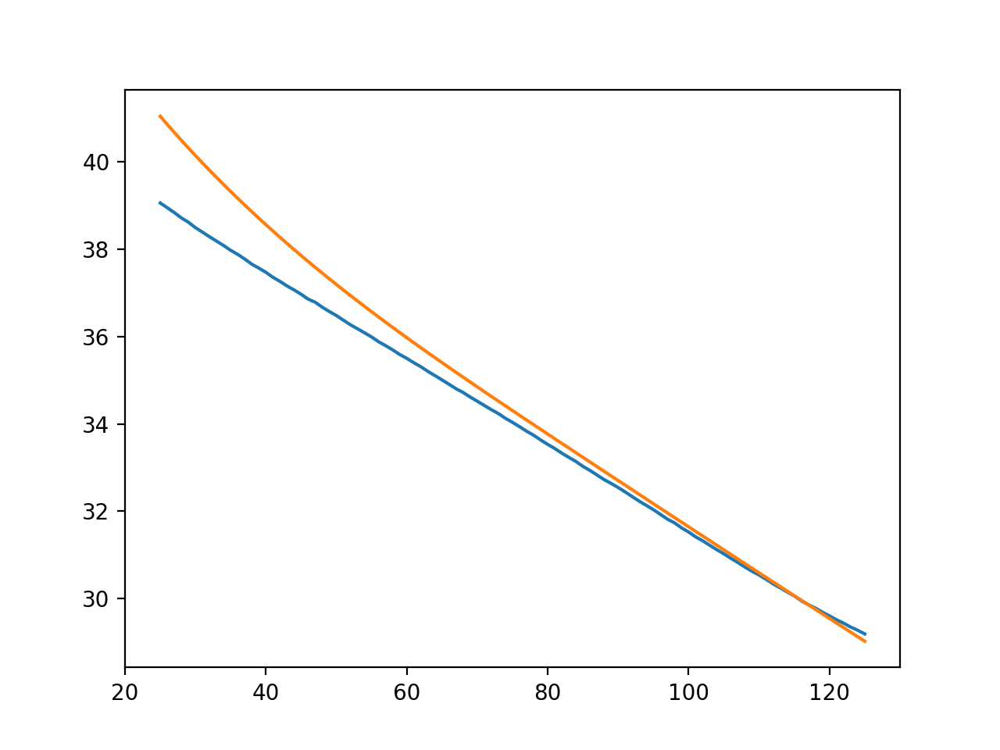

In [184]:
plt.figure()
plt.plot(np.array(range(25,126)),sigg)
plt.plot(np.array(range(25,126)),totalsigfwhm)

In [205]:
totalsigrange = []
for i in sigg:
    totalsigrange.append(np.linspace(0.5*i, 2.5*i,100))

In [187]:
pcall = []
for i in range(len(totalsigrange)):
    sigrange = totalsigrange[i]
    pctotal = []
    for sigma in sigrange:
        A = TDH(7)
        data = np.matrix(gain[i].T.flatten())
        coe = solve(A,data.T)
        finalresi = residual2D(A,data.T)
        meansquare = np.sum(np.multiply(finalresi,finalresi))/(360*91)
        rms = np.sqrt(meansquare)
        pctotal.append(rms/np.max(gain[i])*100)
    pcall.append(pctotal)

In [191]:
np.savetxt('pcerrortotal.csv', np.array(pcall), delimiter=',')

<IPython.core.display.Javascript object>


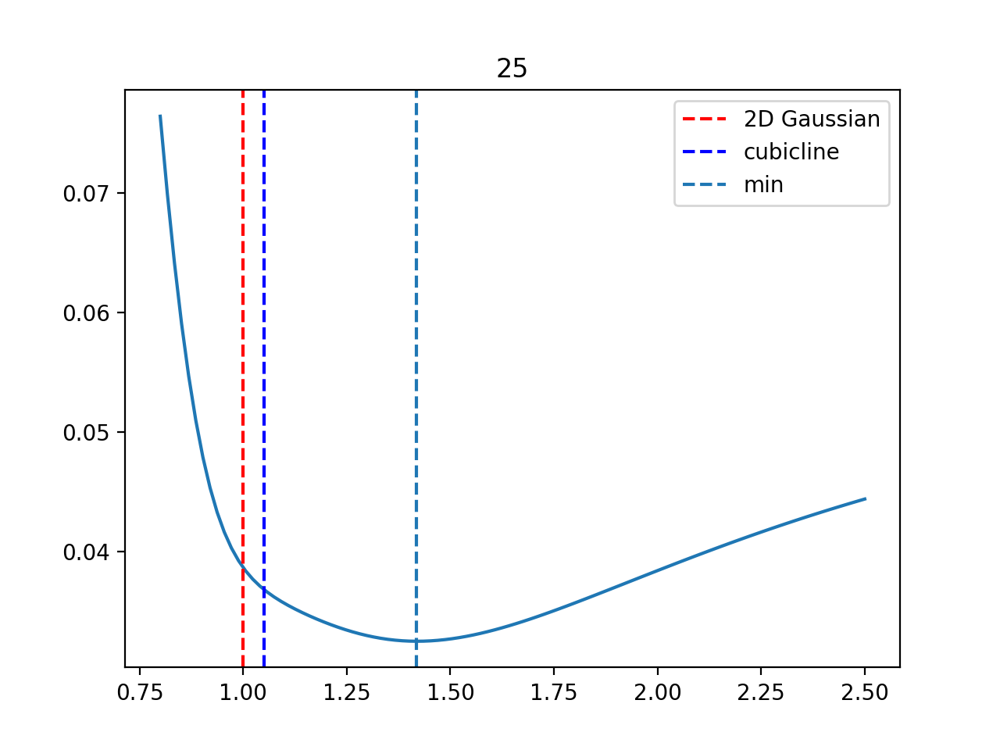

<IPython.core.display.Javascript object>


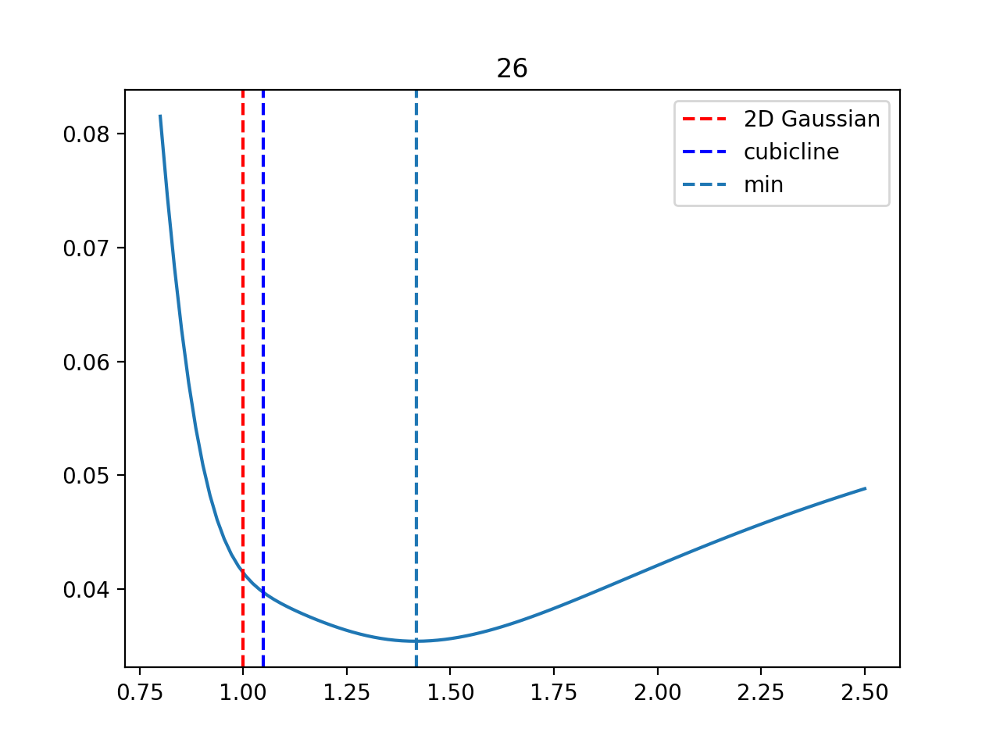

<IPython.core.display.Javascript object>


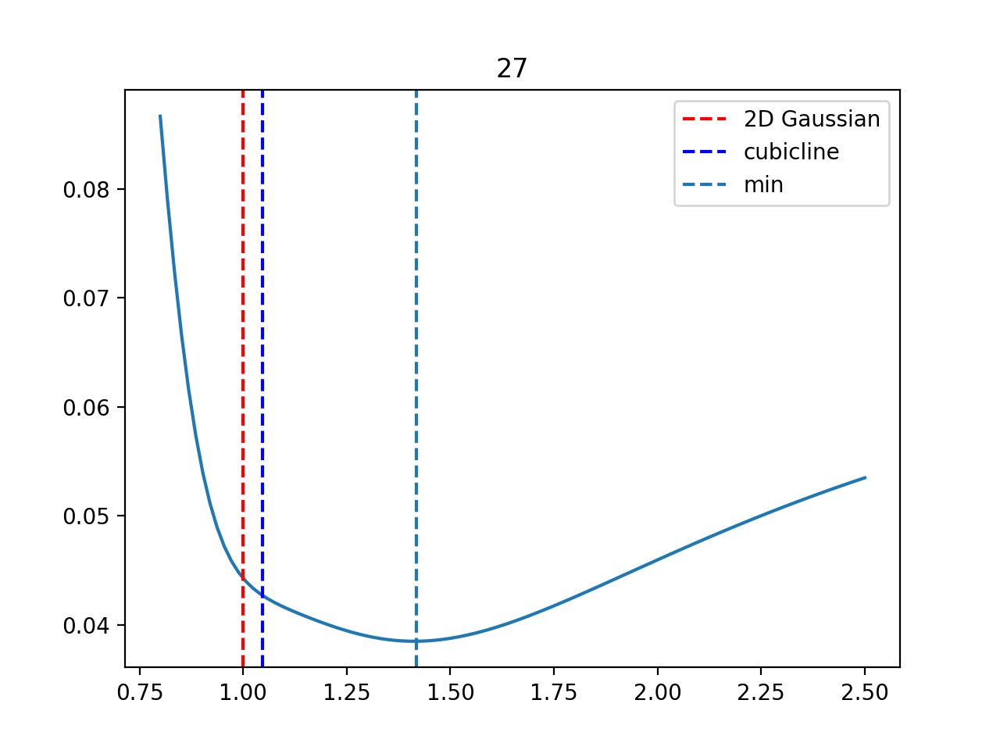

<IPython.core.display.Javascript object>


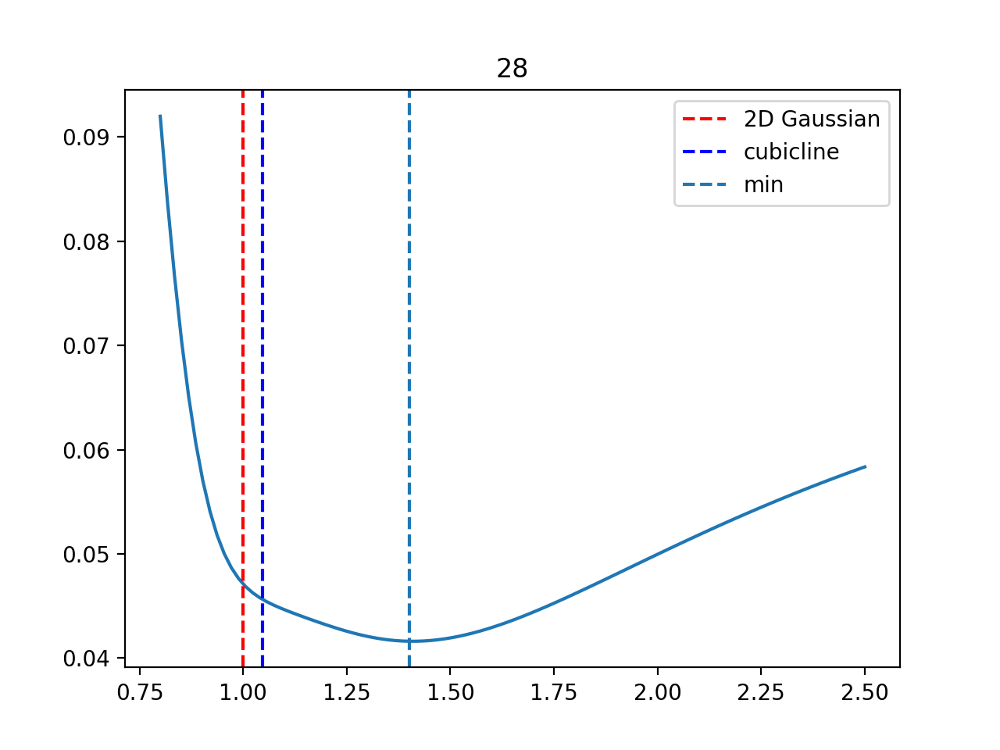

<IPython.core.display.Javascript object>


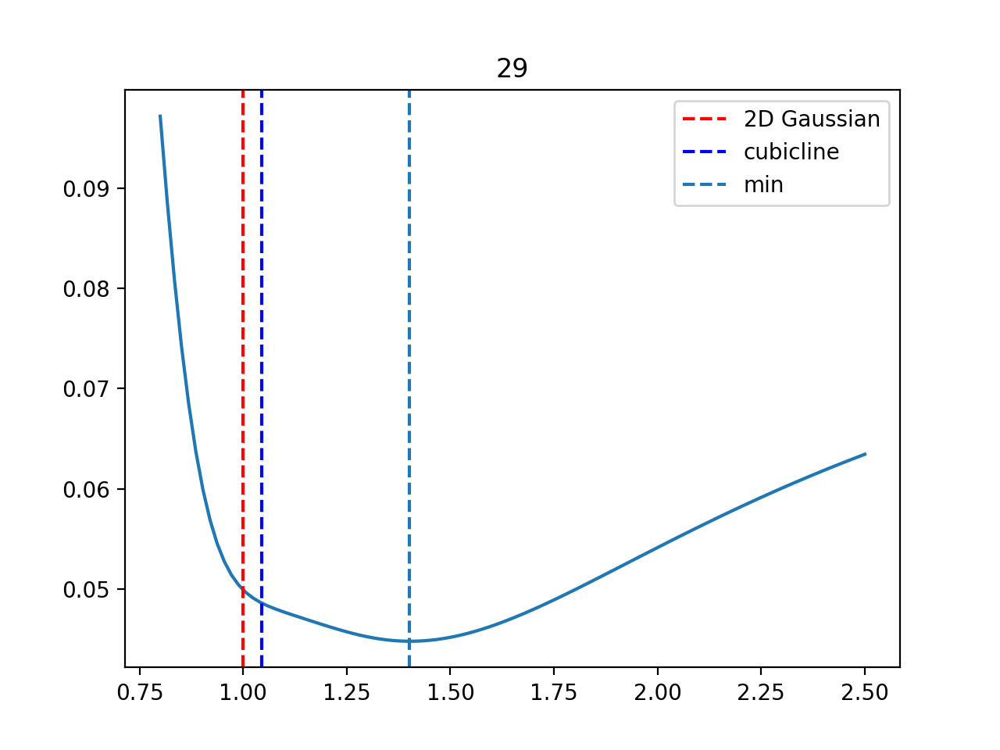

<IPython.core.display.Javascript object>


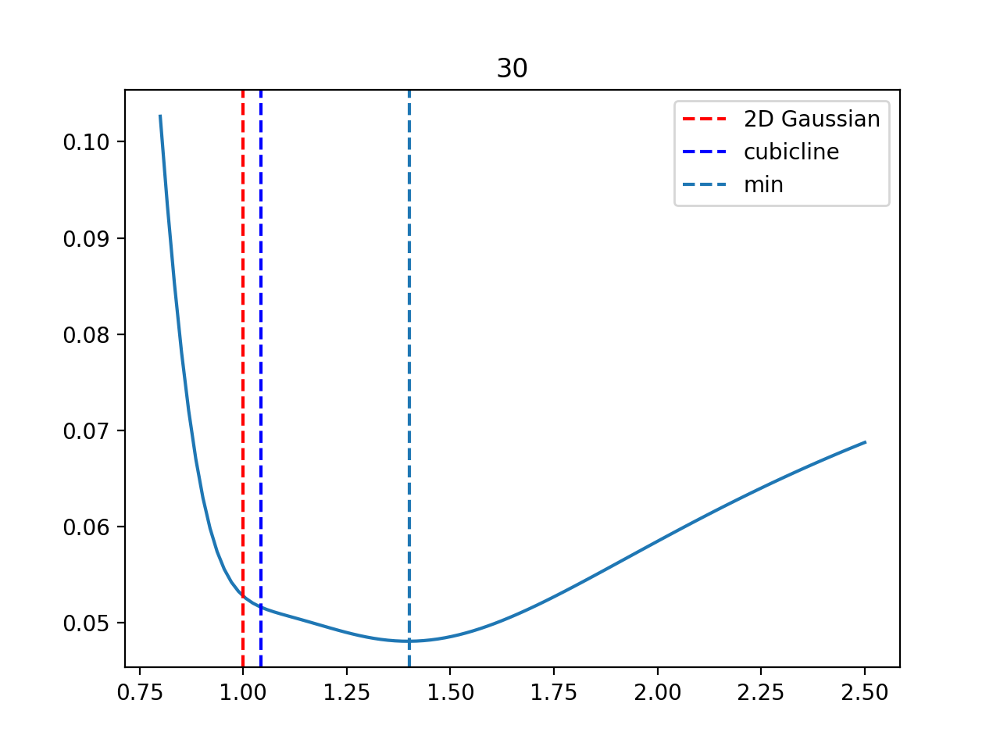

<IPython.core.display.Javascript object>


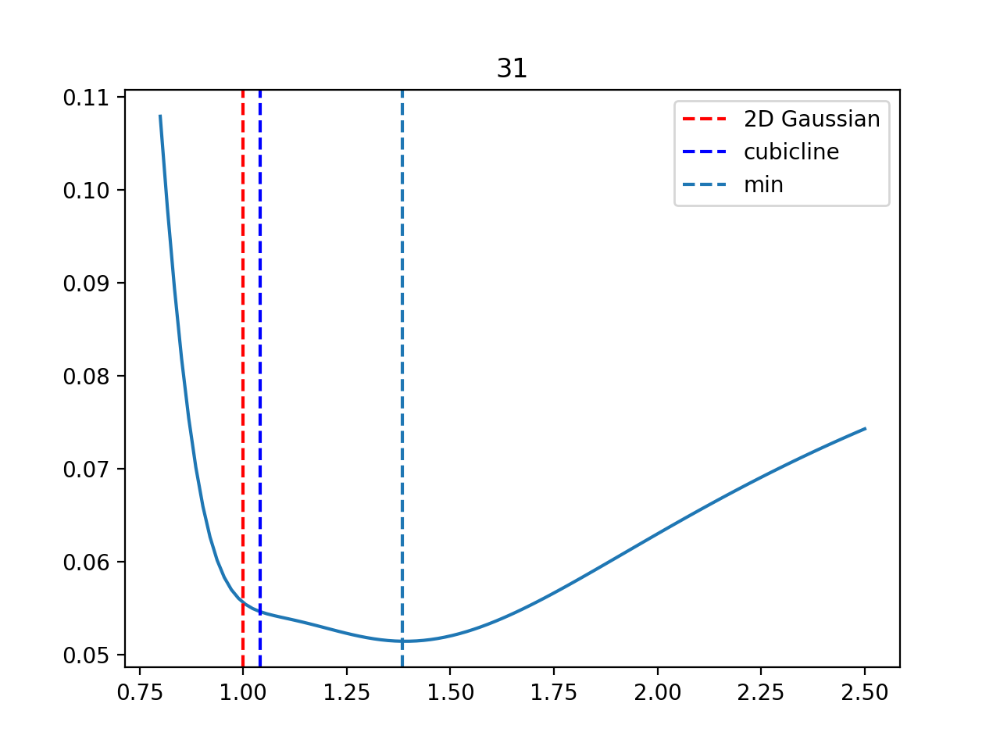

<IPython.core.display.Javascript object>


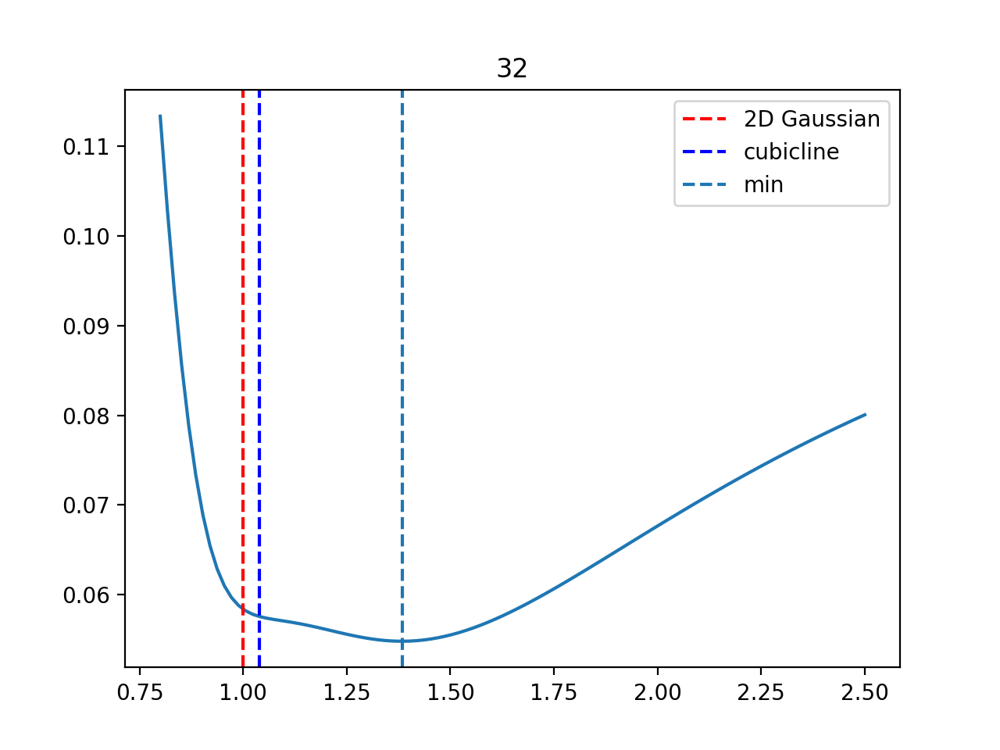

<IPython.core.display.Javascript object>


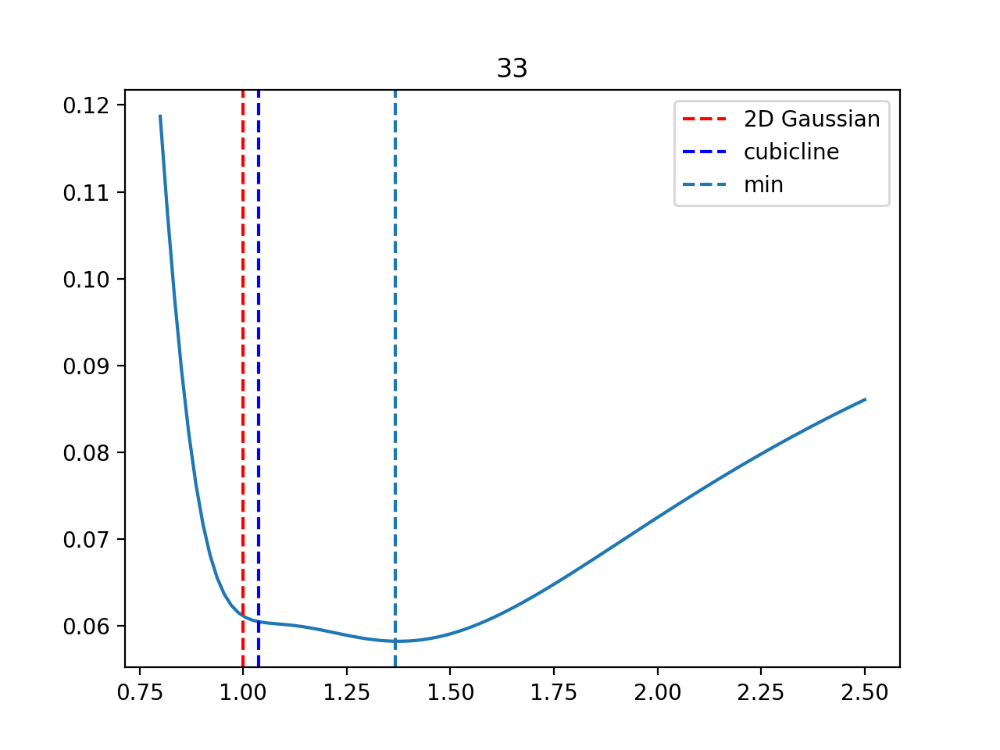

<IPython.core.display.Javascript object>


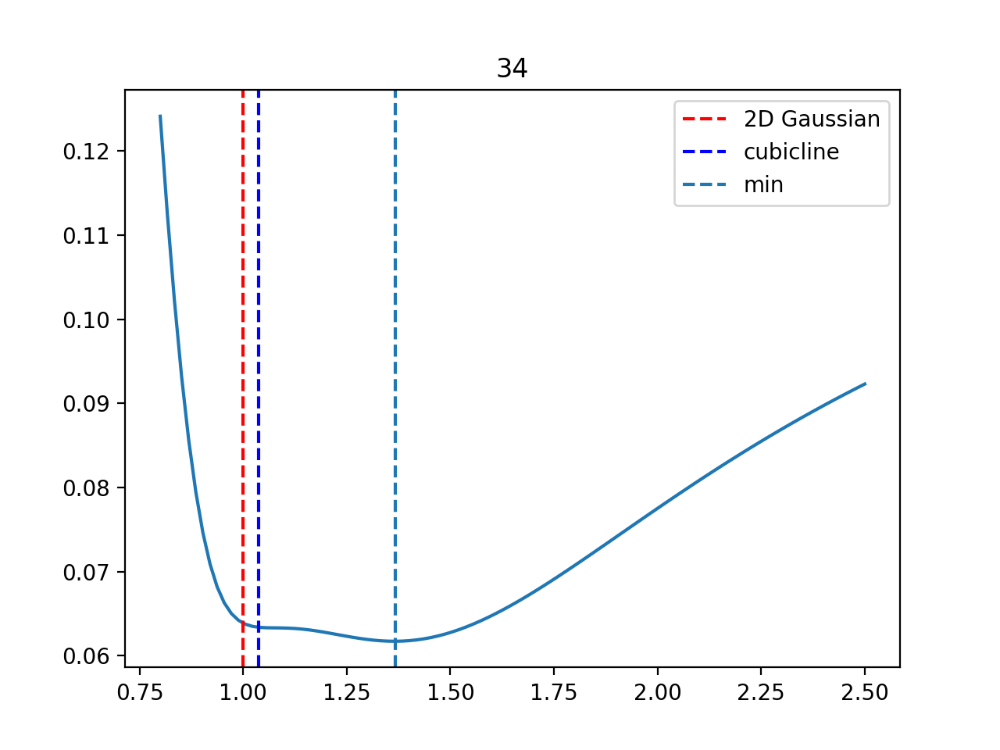

<IPython.core.display.Javascript object>


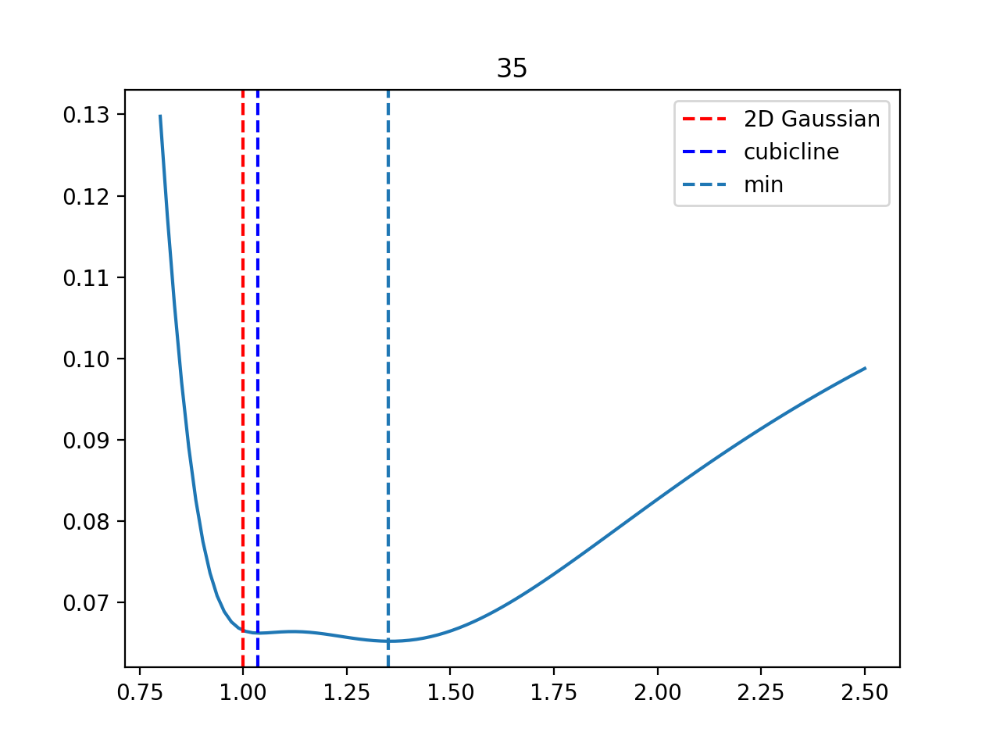

<IPython.core.display.Javascript object>


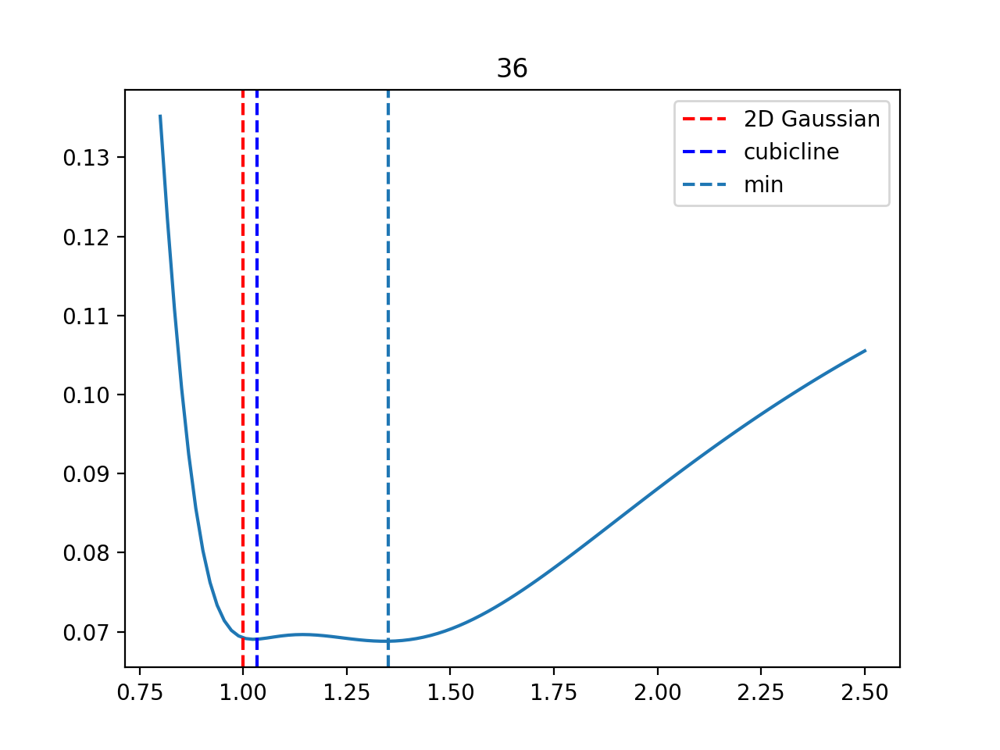

<IPython.core.display.Javascript object>


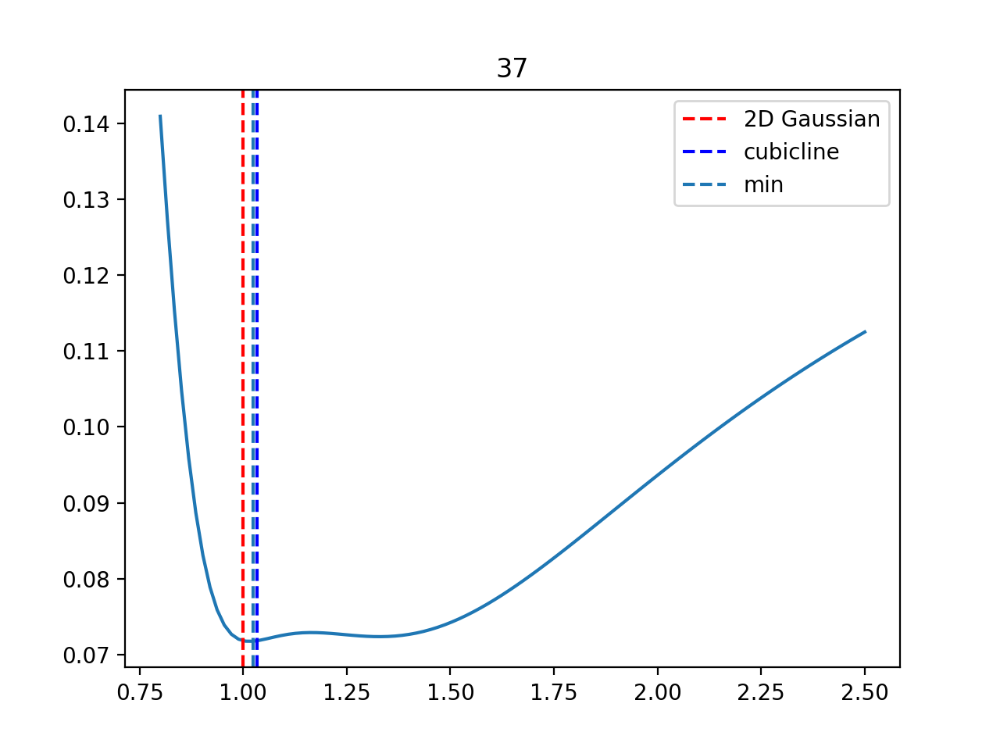

<IPython.core.display.Javascript object>

<ipython-input-202-5558e1c1f7cd>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


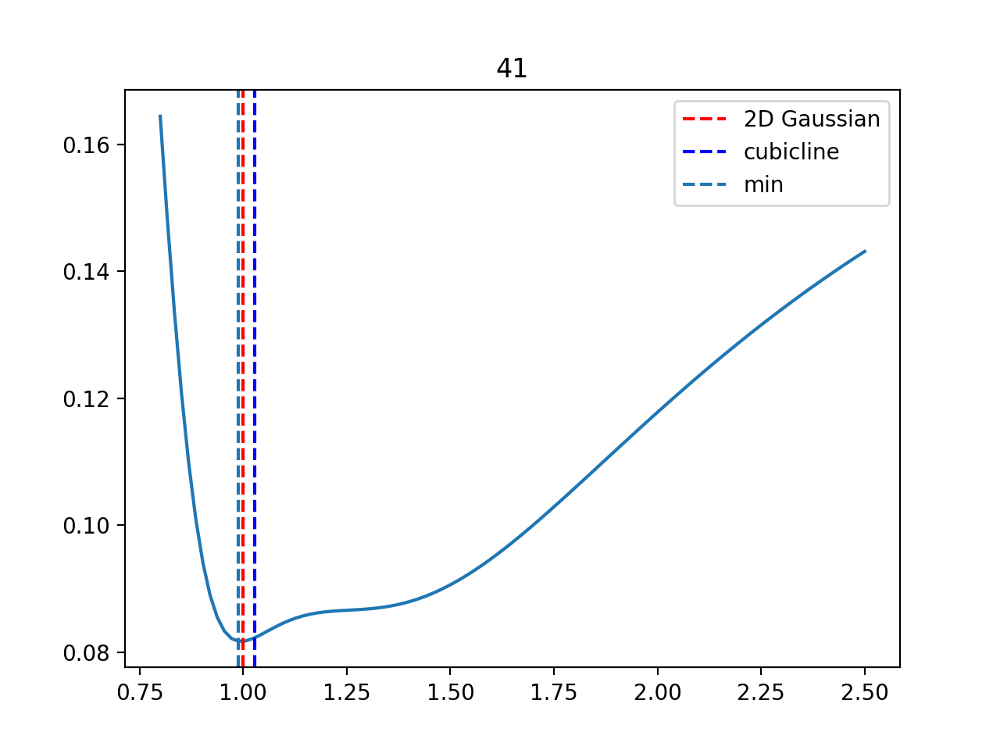

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


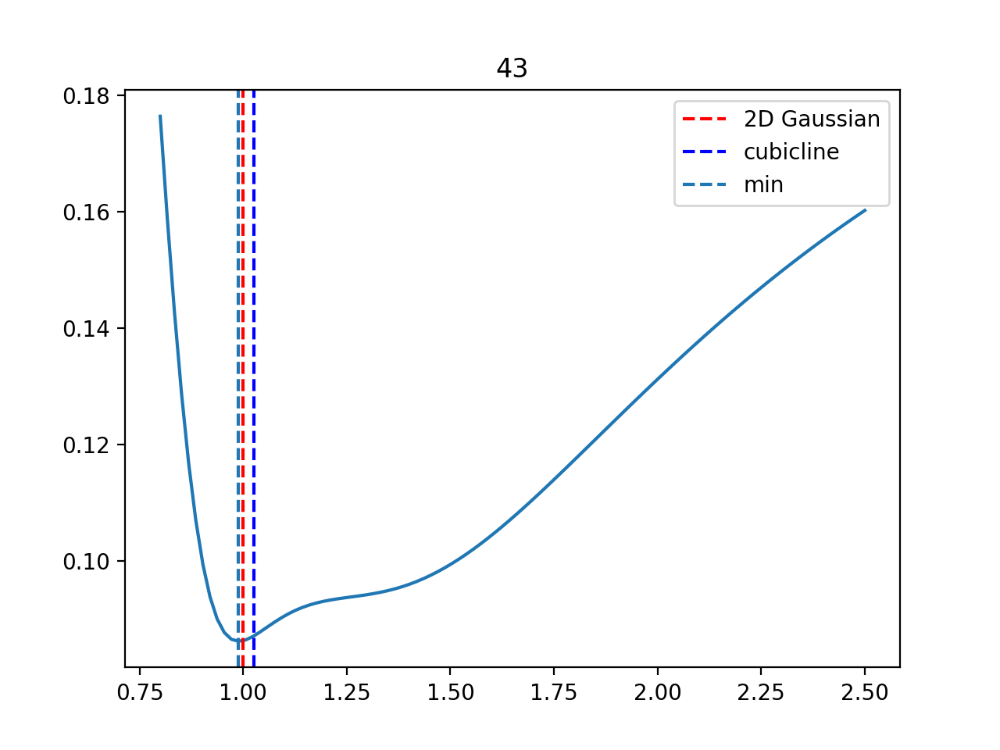

<IPython.core.display.Javascript object>


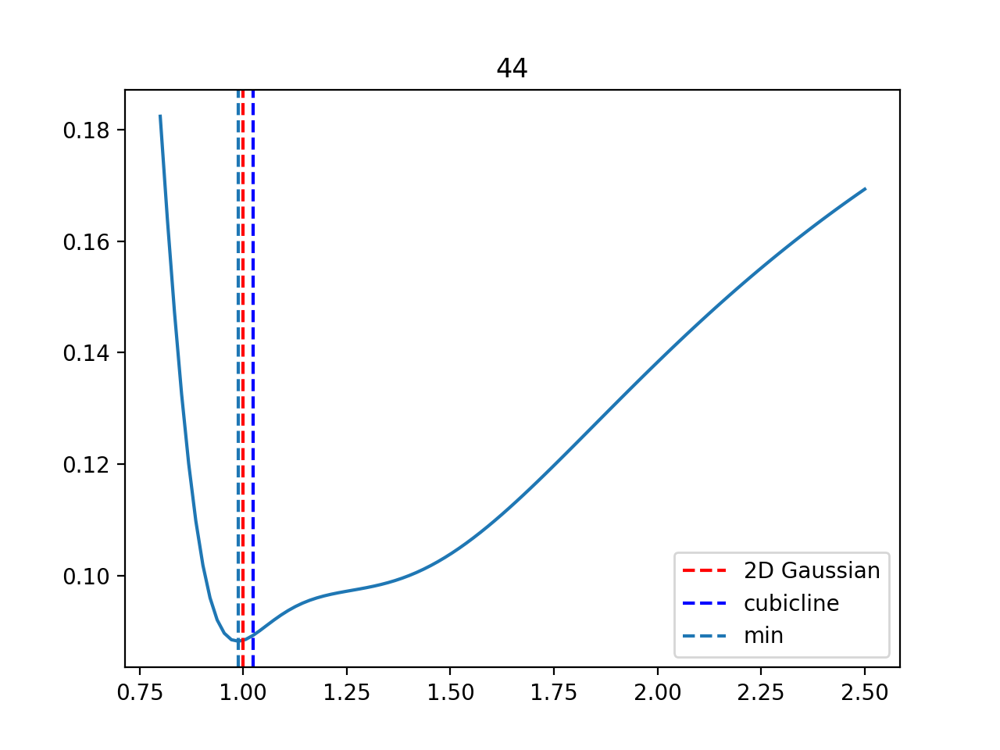

<IPython.core.display.Javascript object>


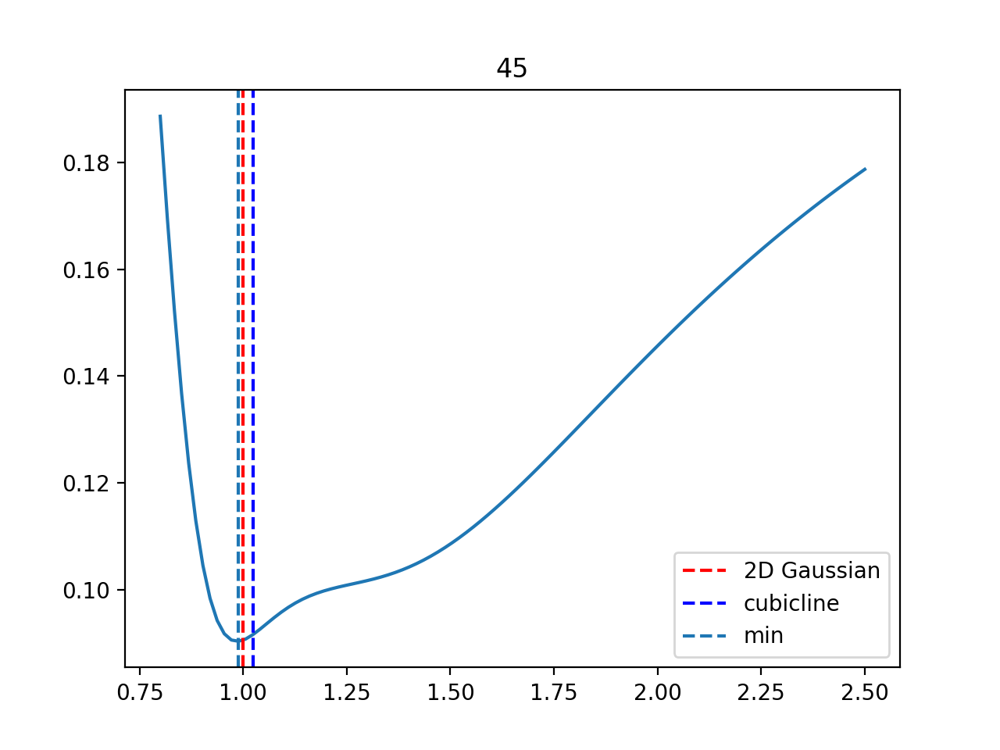

<IPython.core.display.Javascript object>


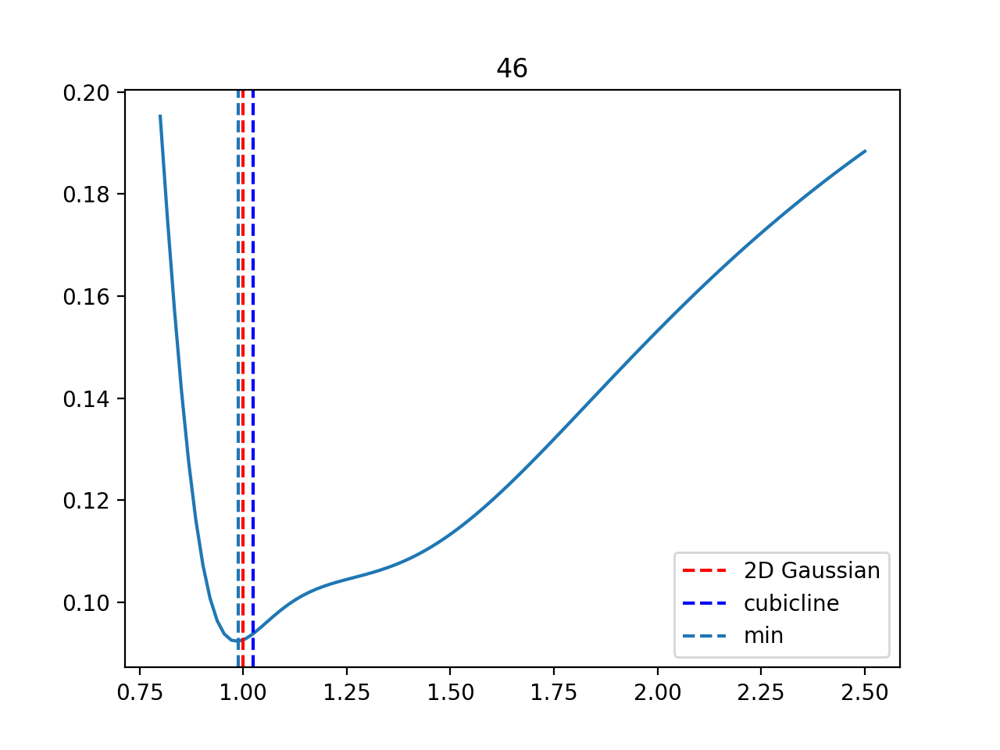

<IPython.core.display.Javascript object>


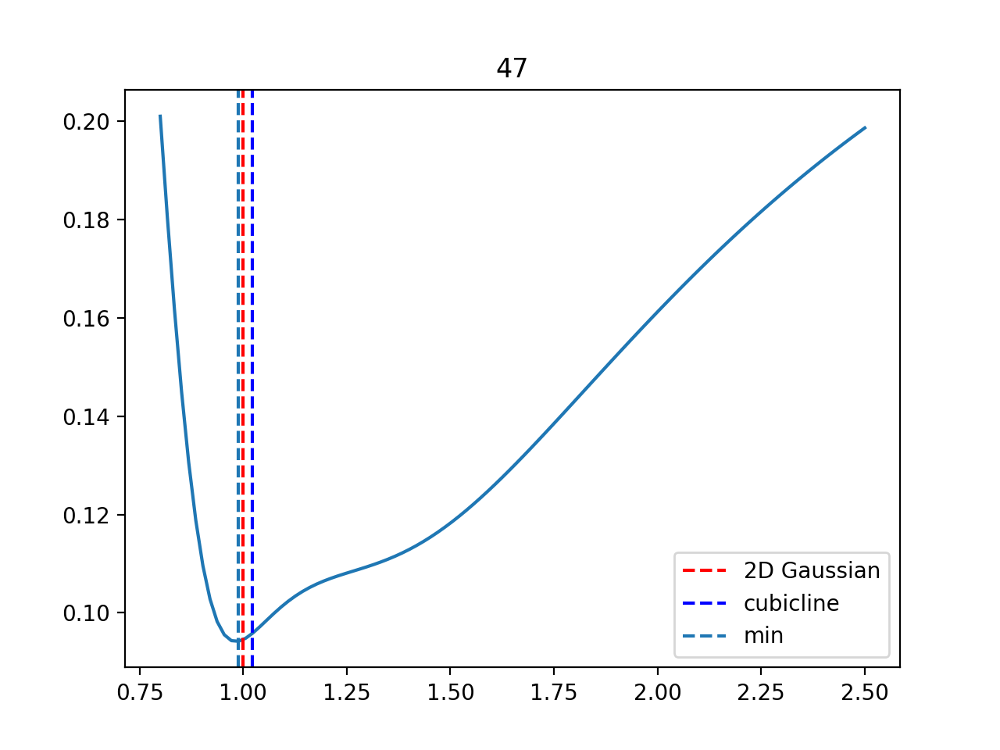

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


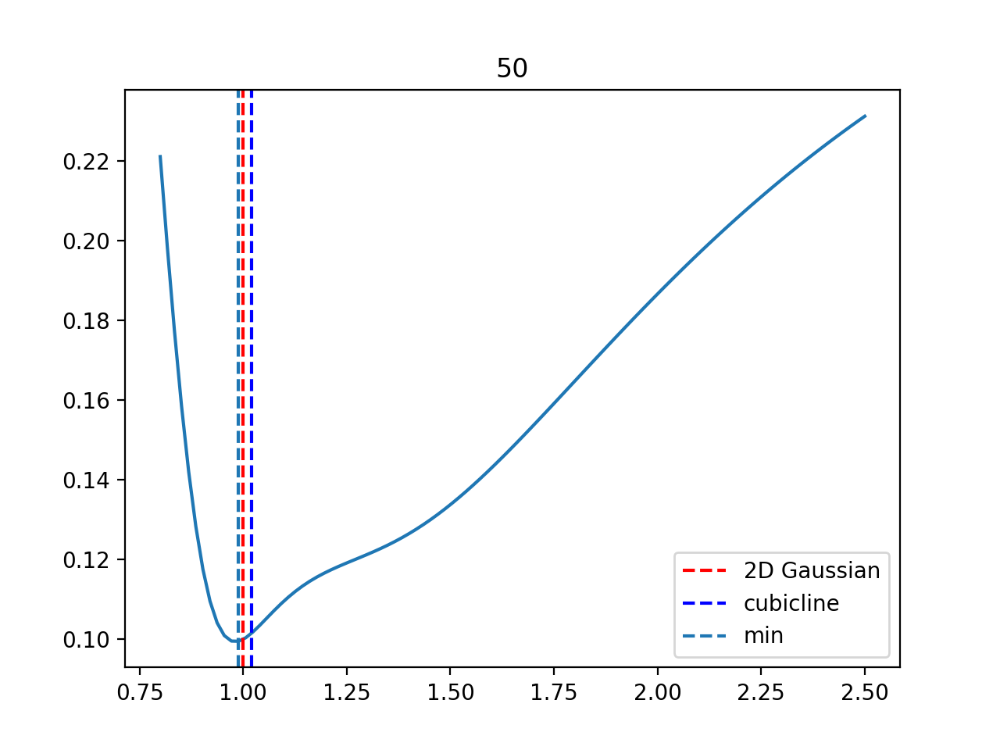

<IPython.core.display.Javascript object>


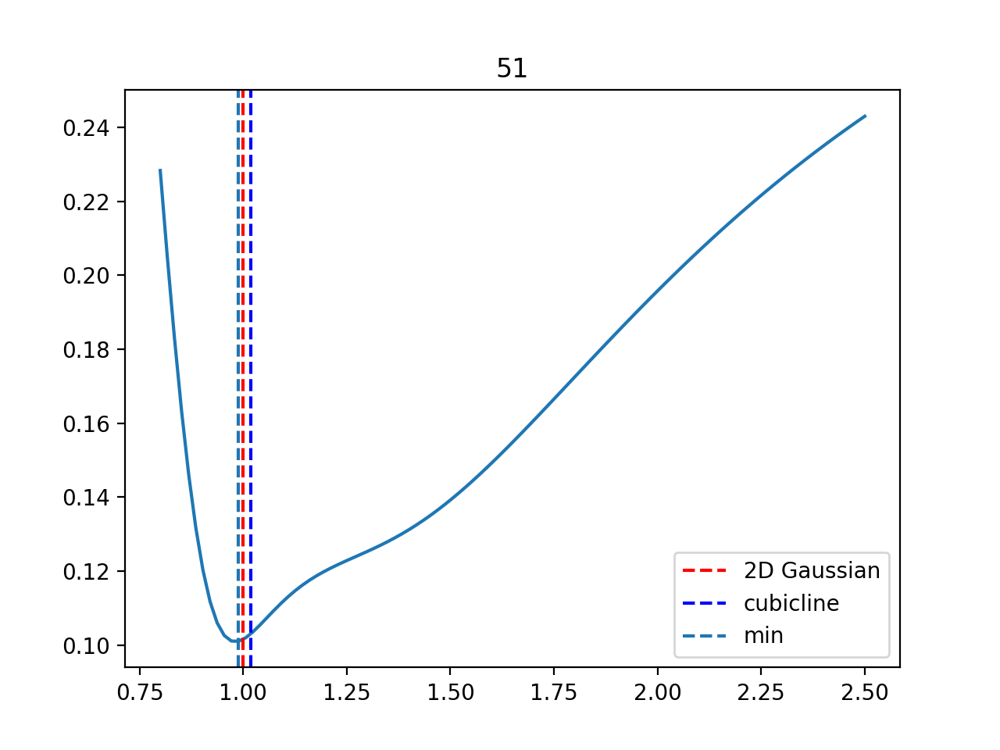

<IPython.core.display.Javascript object>


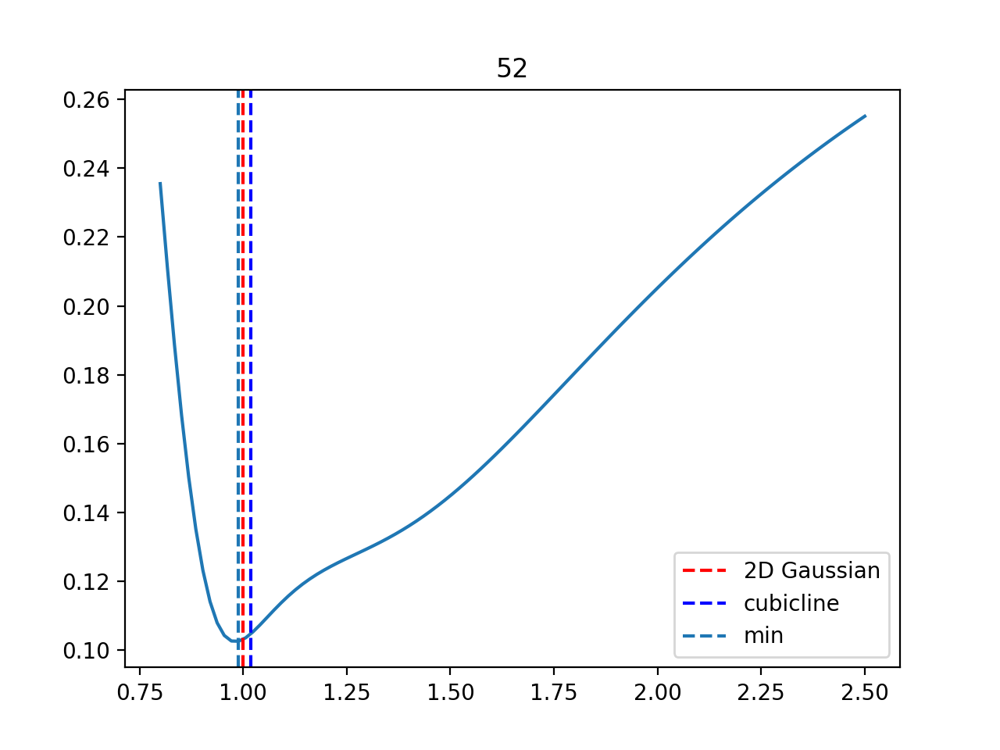

<IPython.core.display.Javascript object>


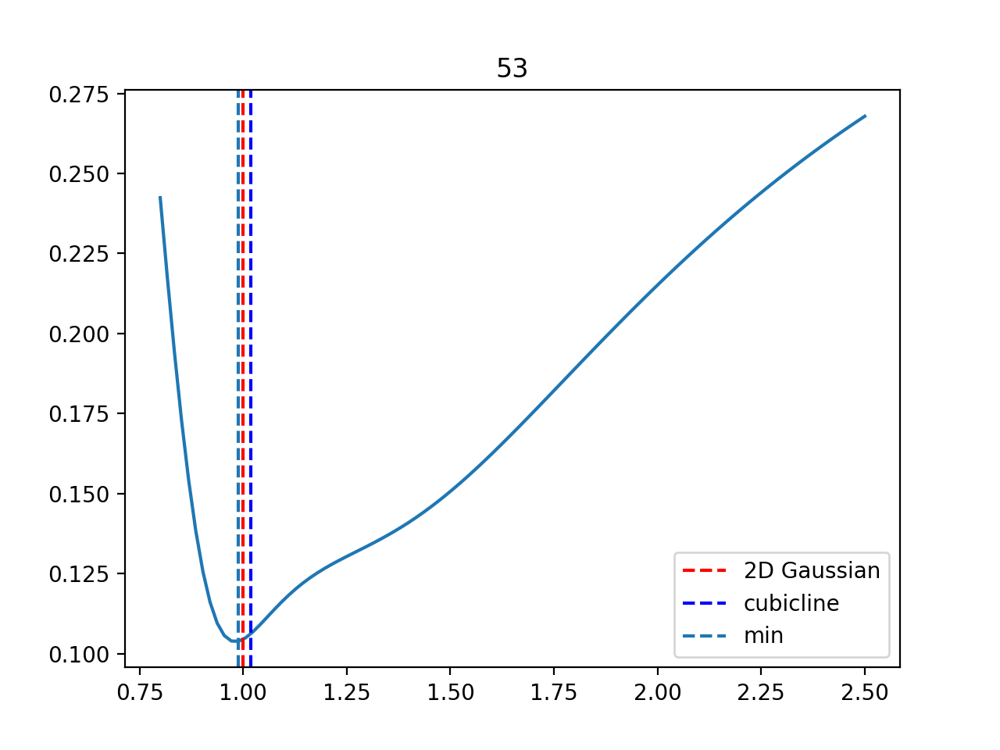

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


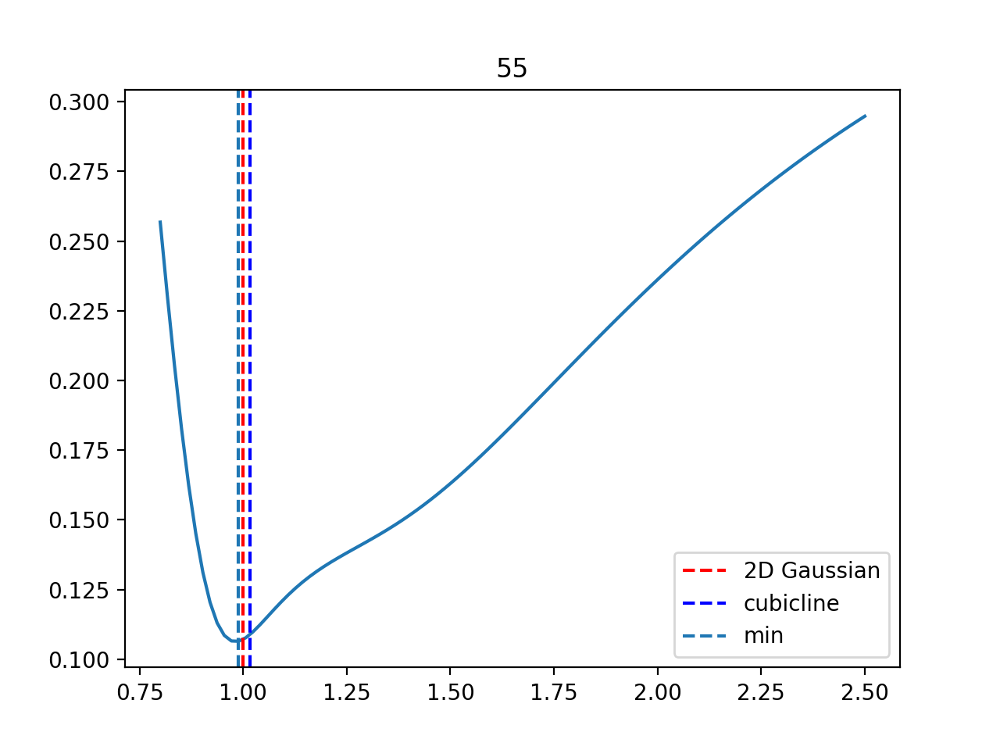

<IPython.core.display.Javascript object>


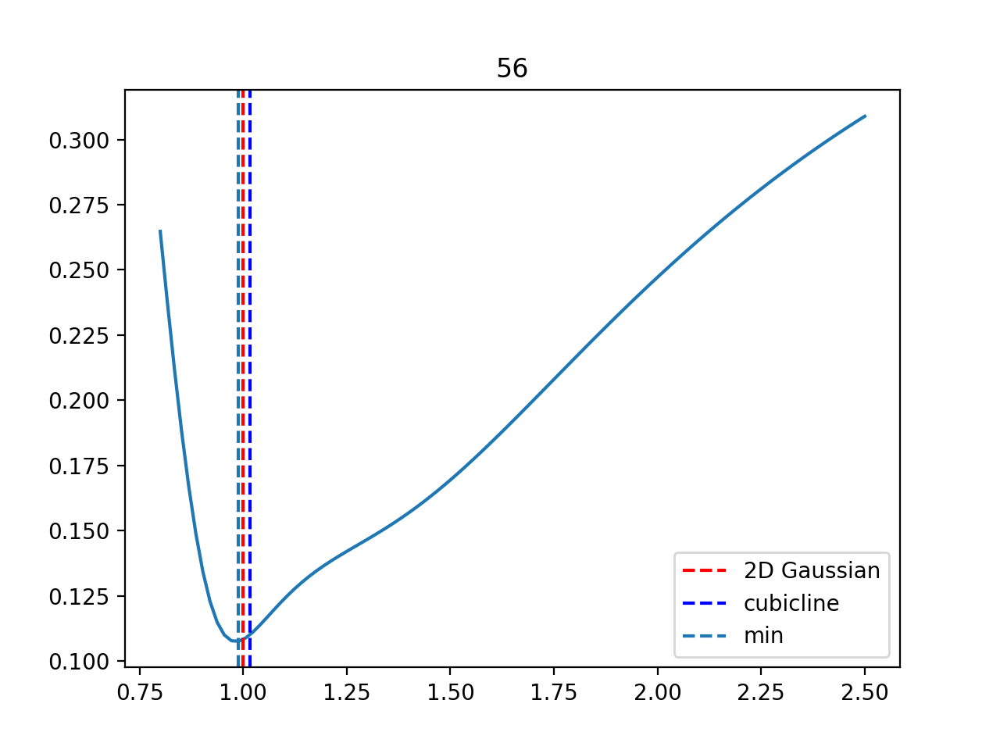

<IPython.core.display.Javascript object>


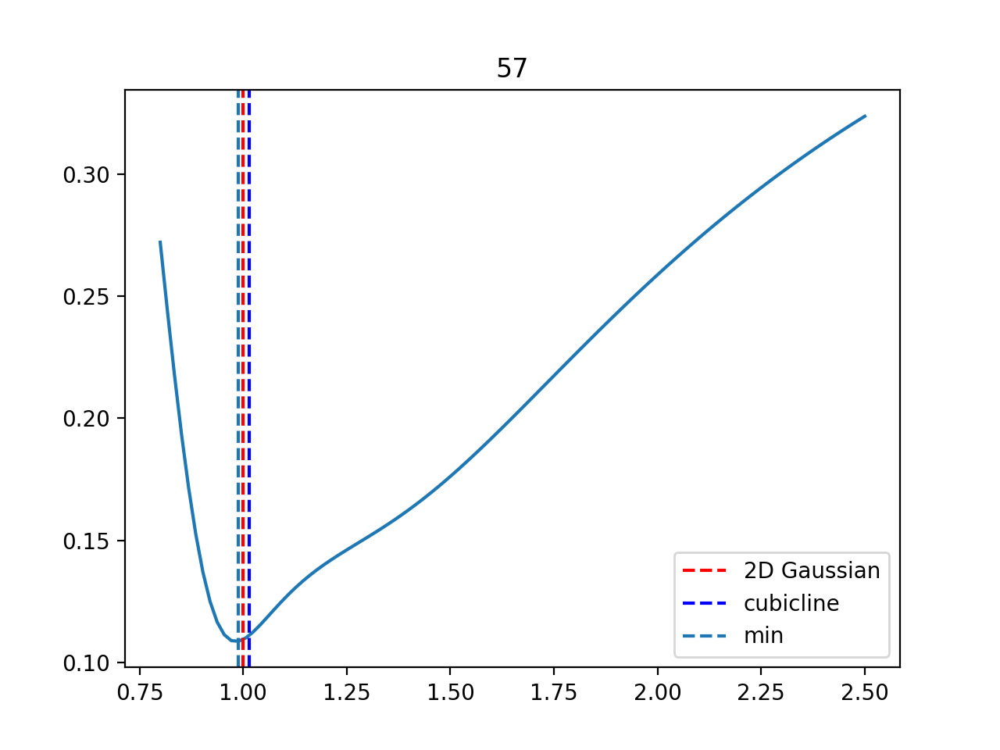

<IPython.core.display.Javascript object>


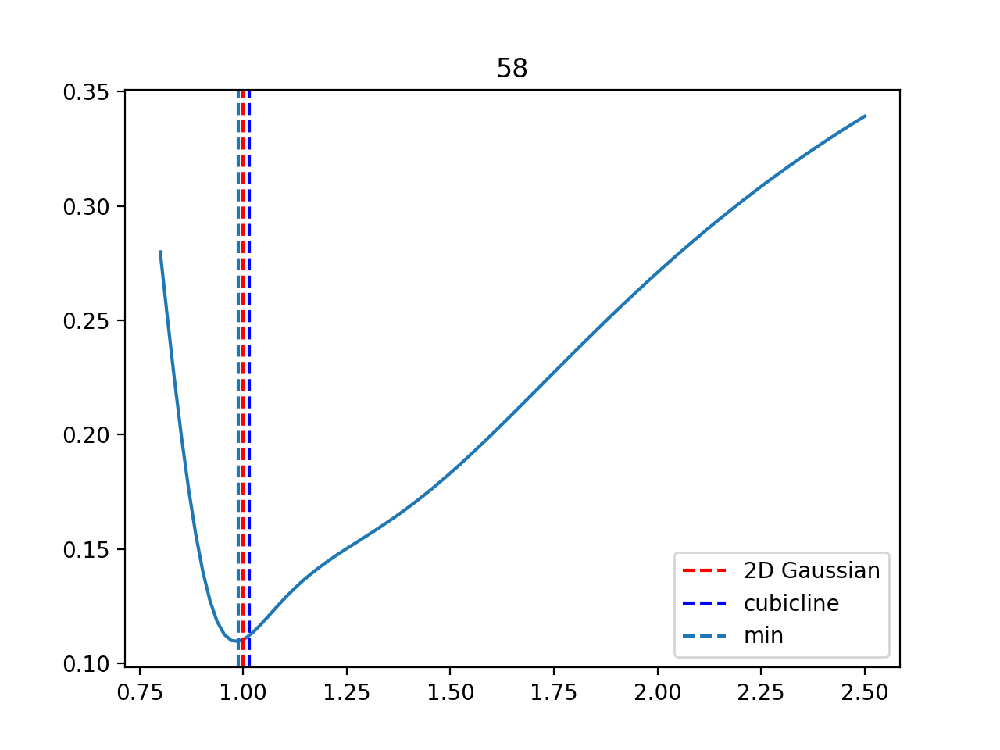

<IPython.core.display.Javascript object>


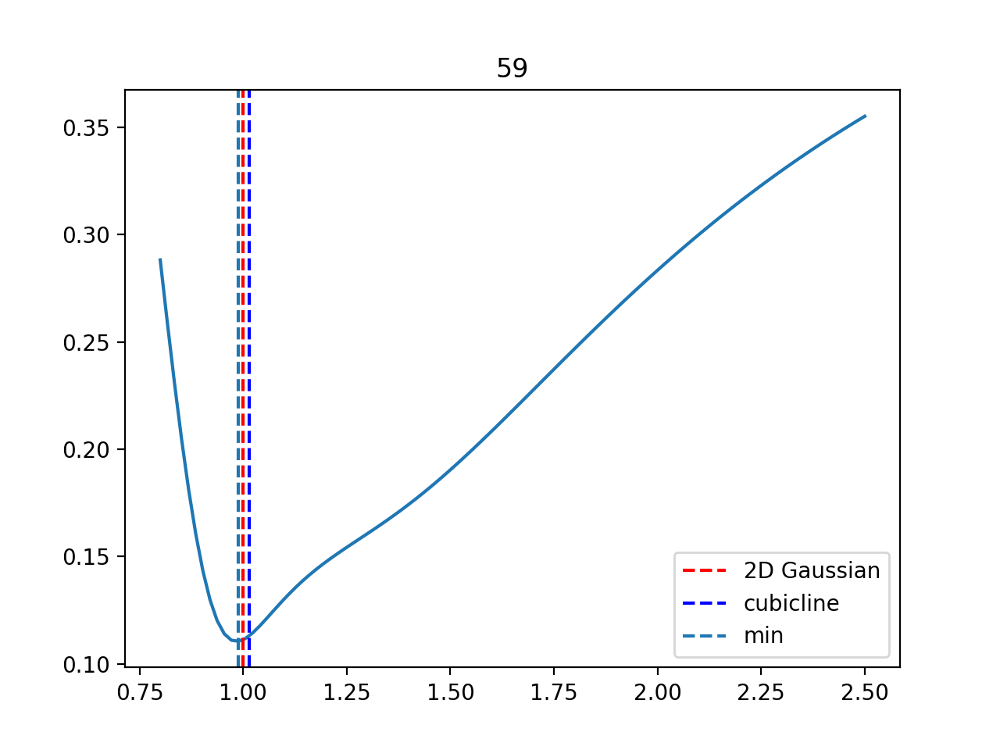

<IPython.core.display.Javascript object>


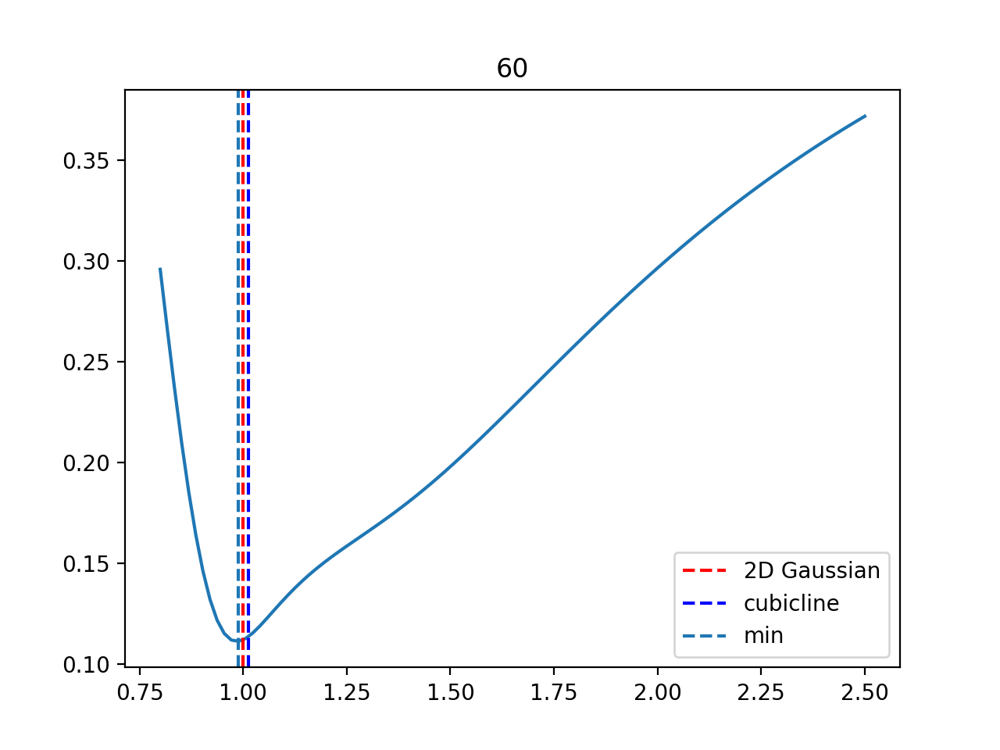

<IPython.core.display.Javascript object>


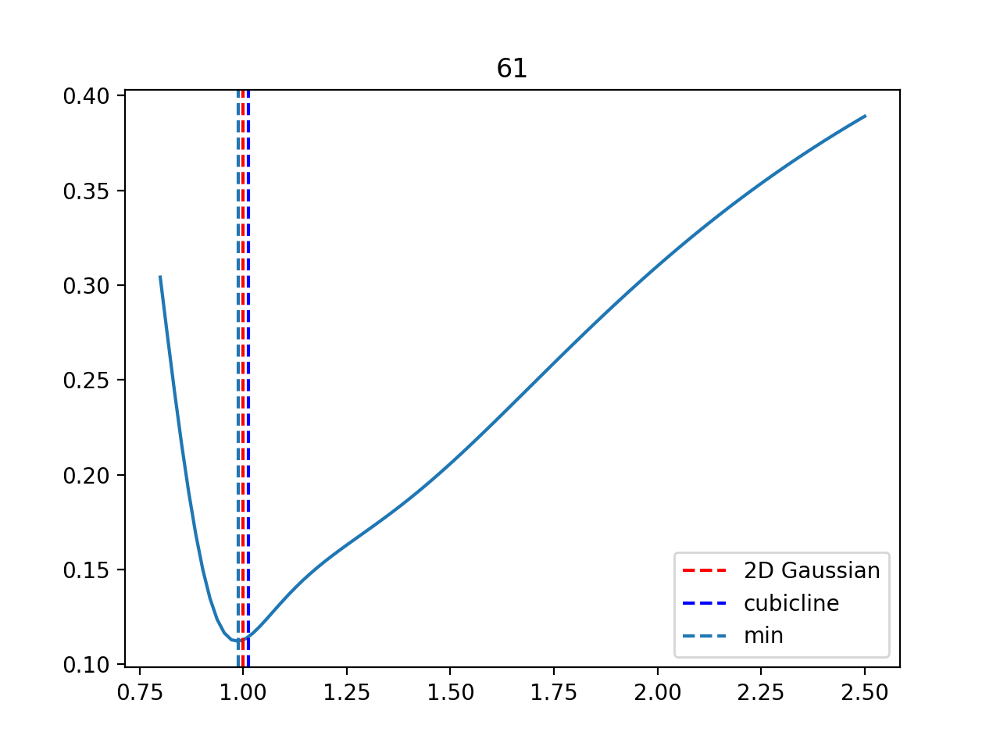

<IPython.core.display.Javascript object>


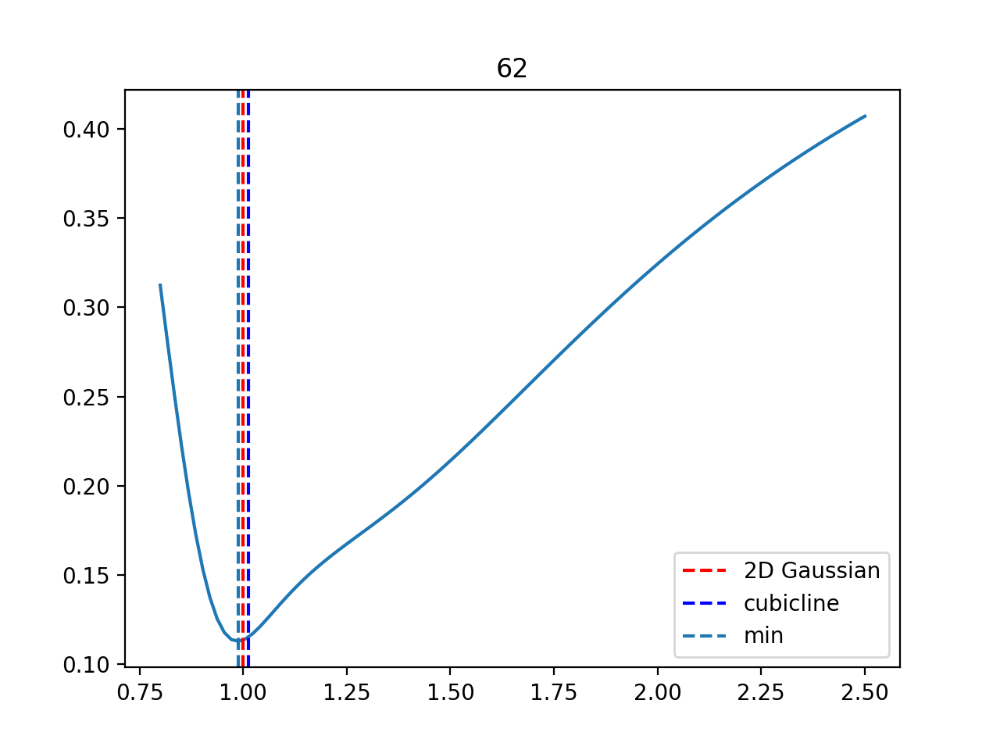

<IPython.core.display.Javascript object>


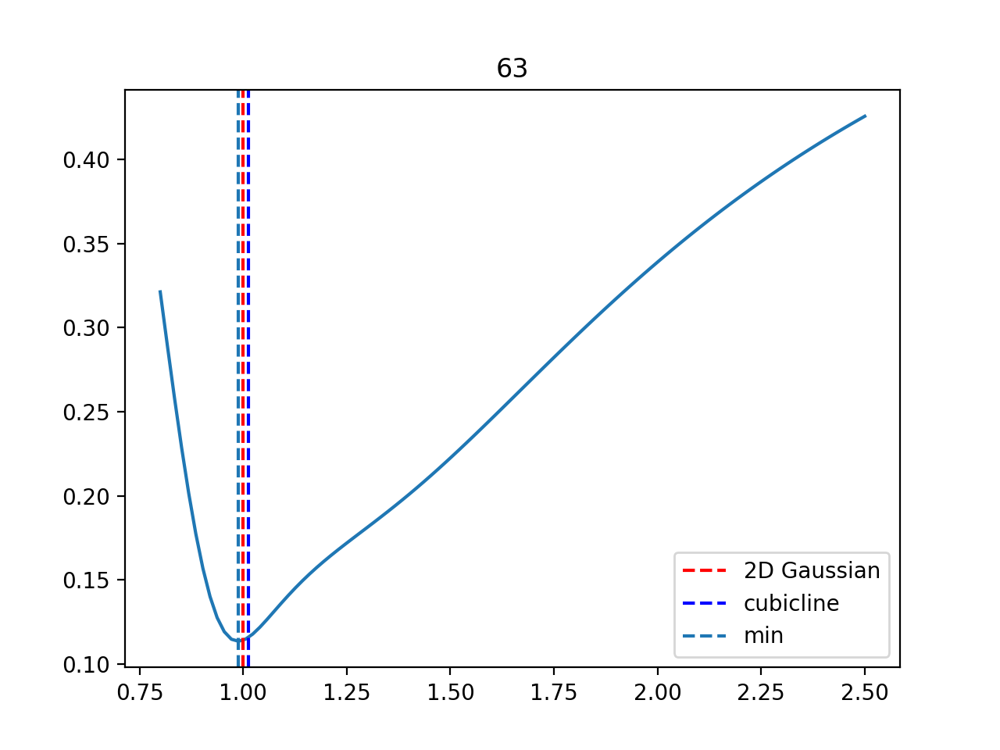

<IPython.core.display.Javascript object>


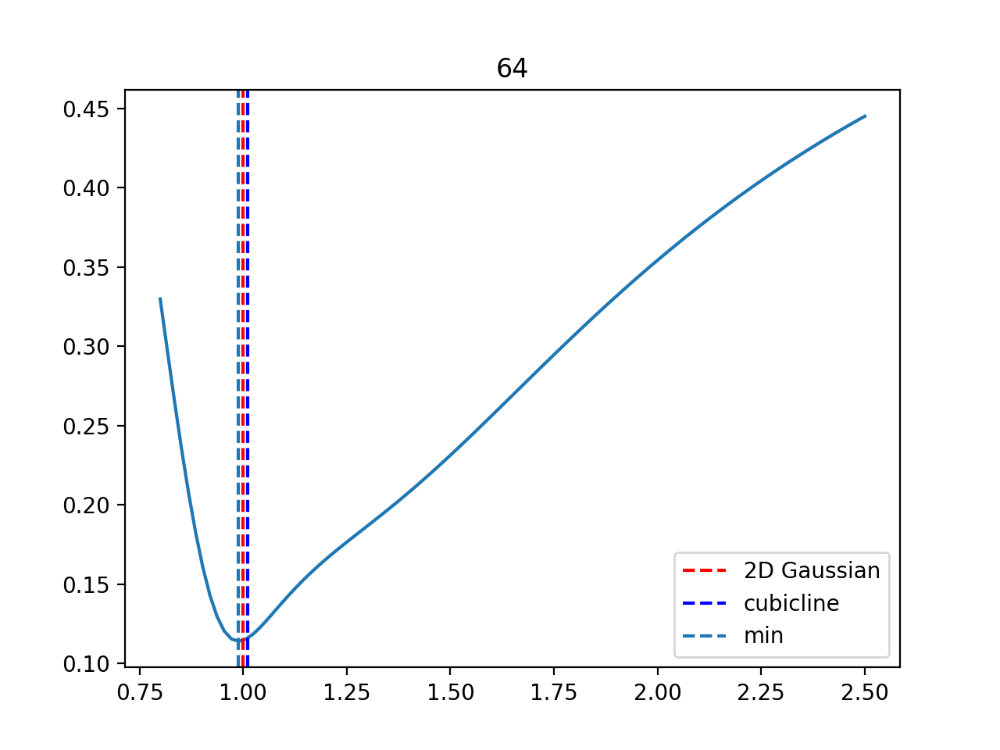

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


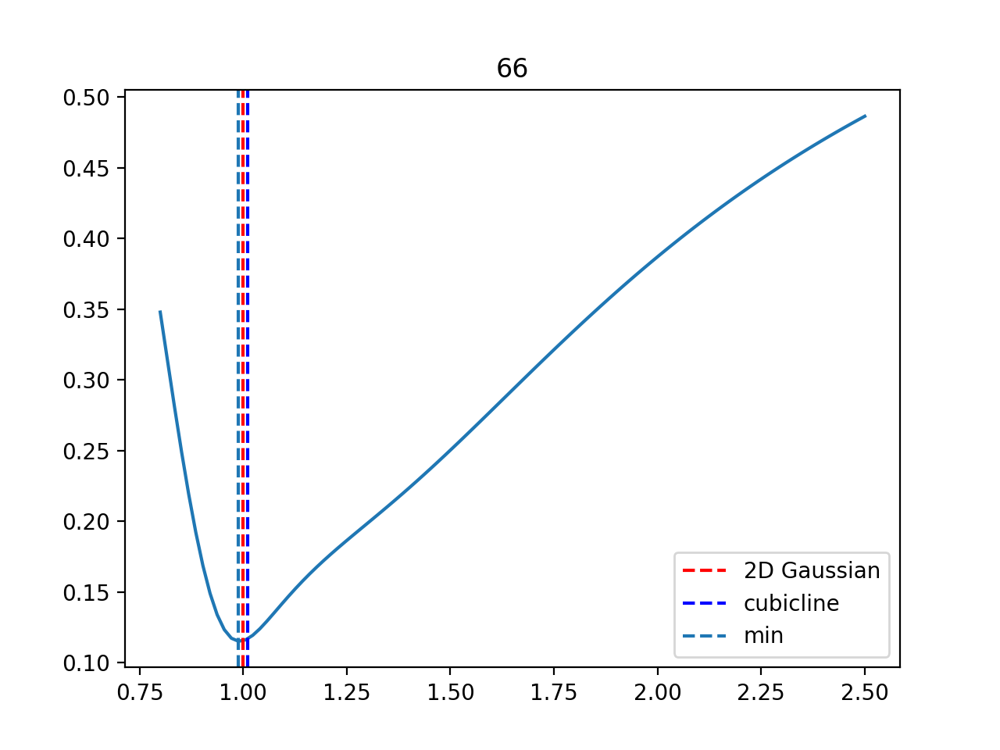

<IPython.core.display.Javascript object>


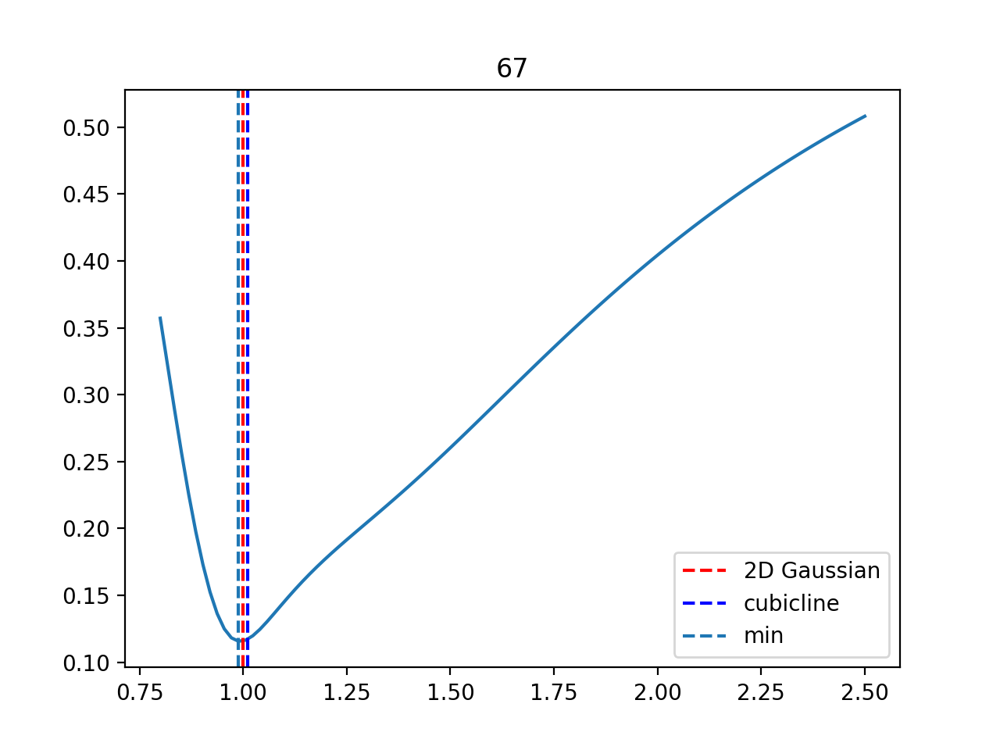

<IPython.core.display.Javascript object>


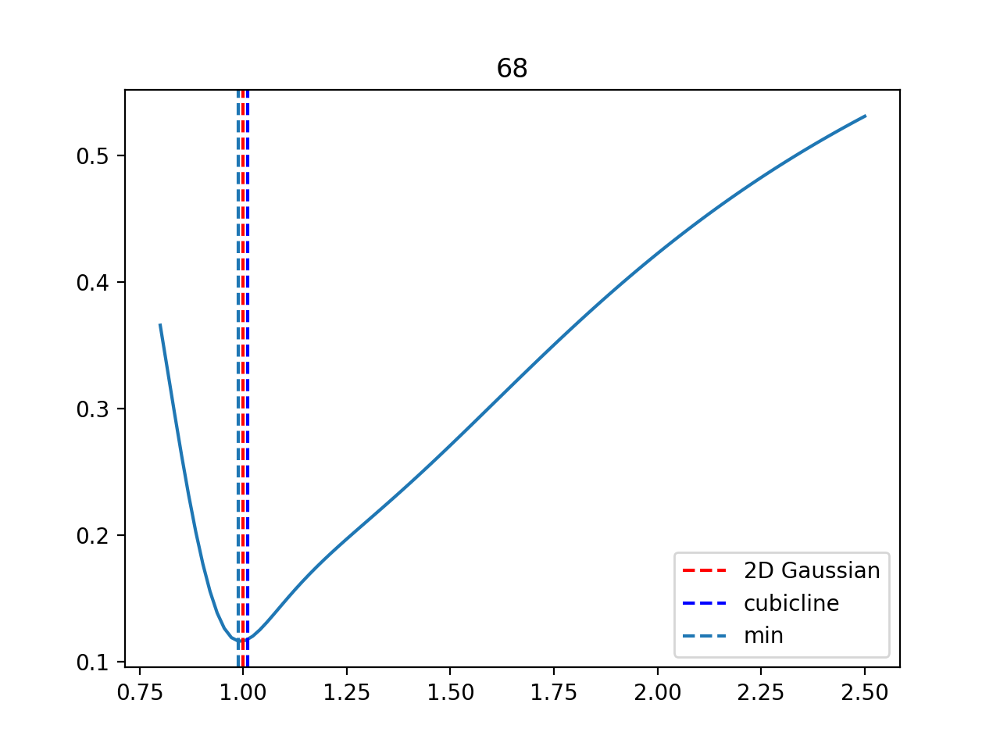

<IPython.core.display.Javascript object>


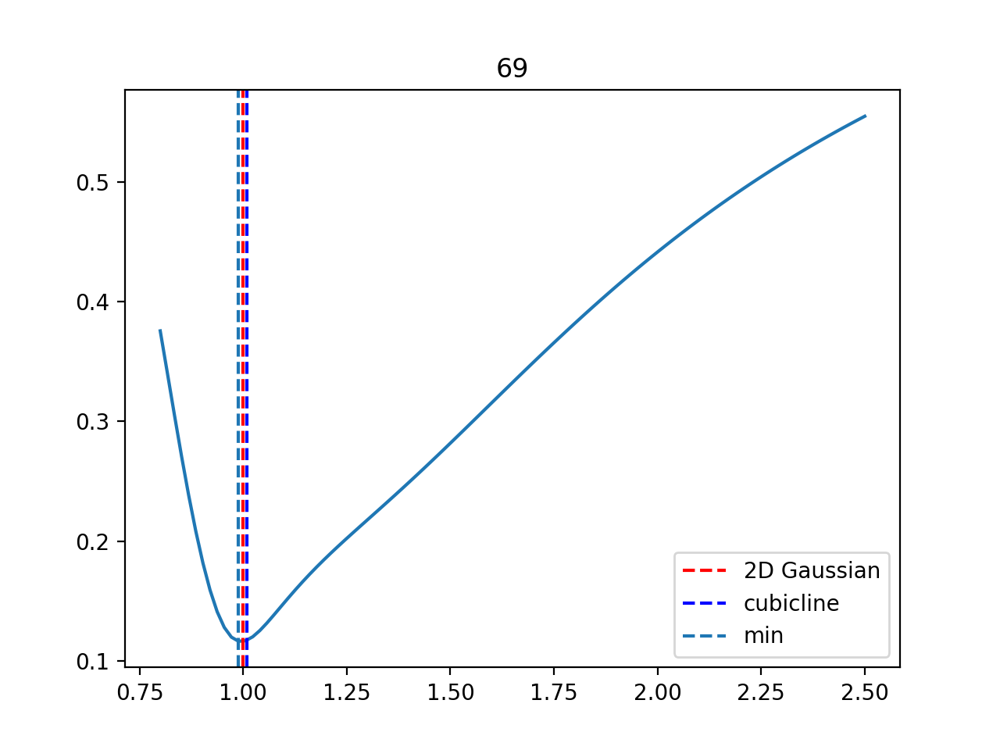

<IPython.core.display.Javascript object>


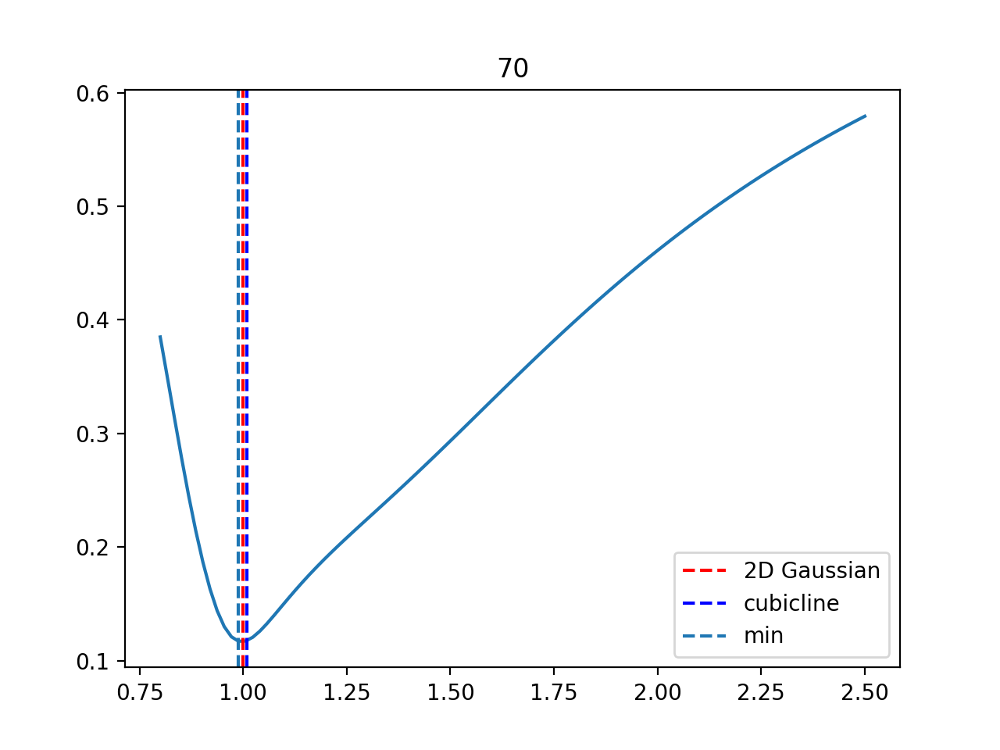

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


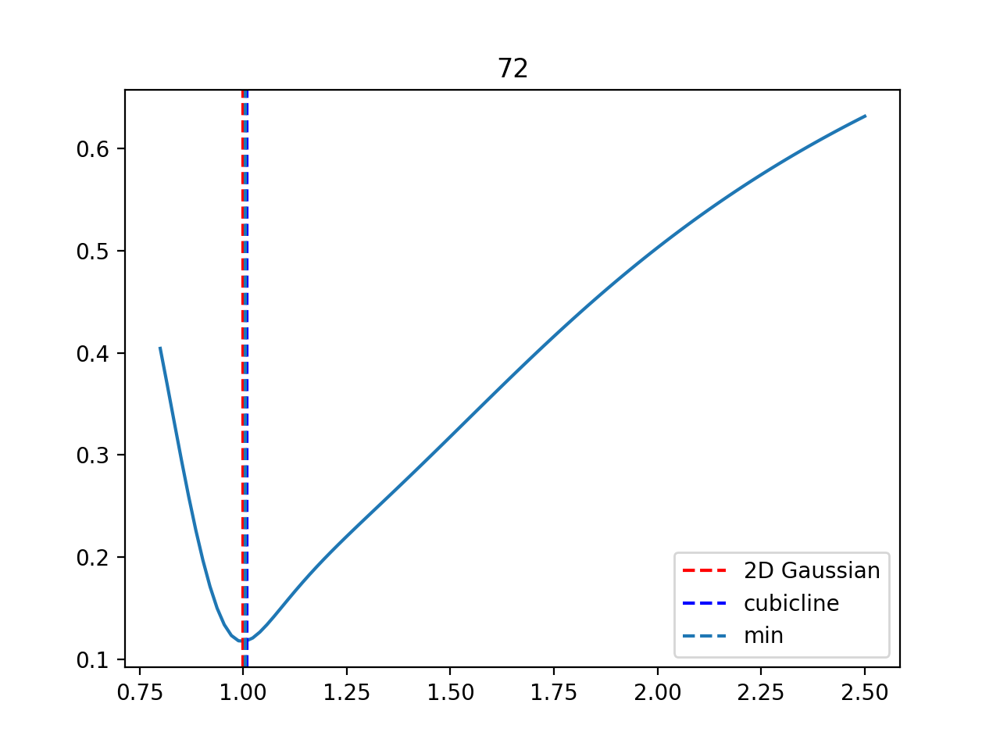

<IPython.core.display.Javascript object>


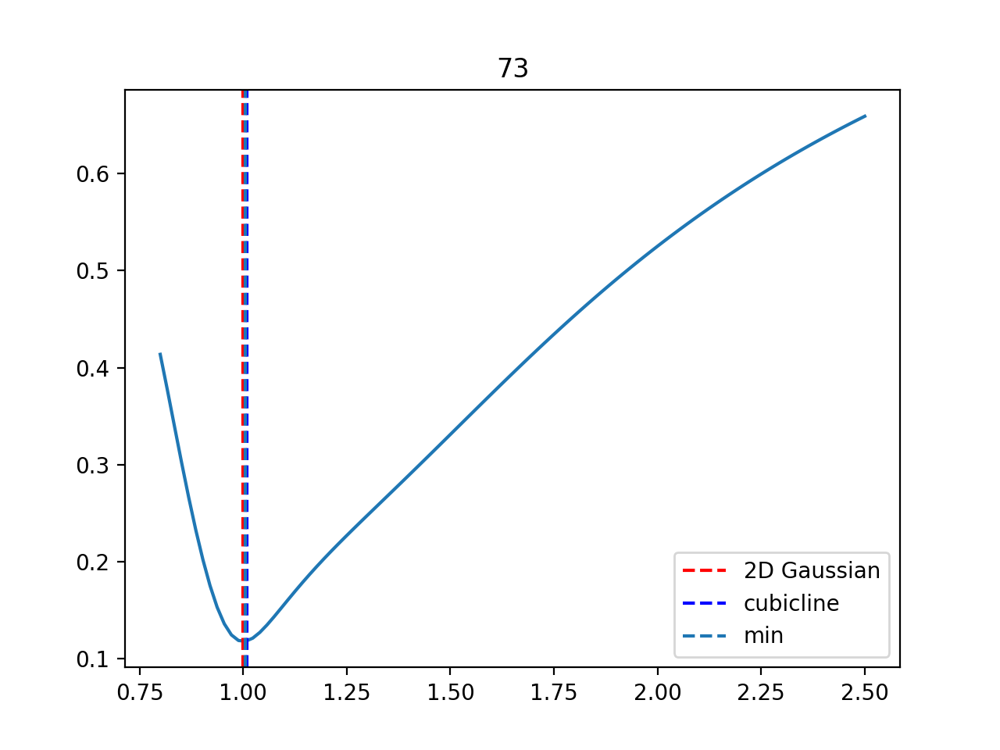

<IPython.core.display.Javascript object>


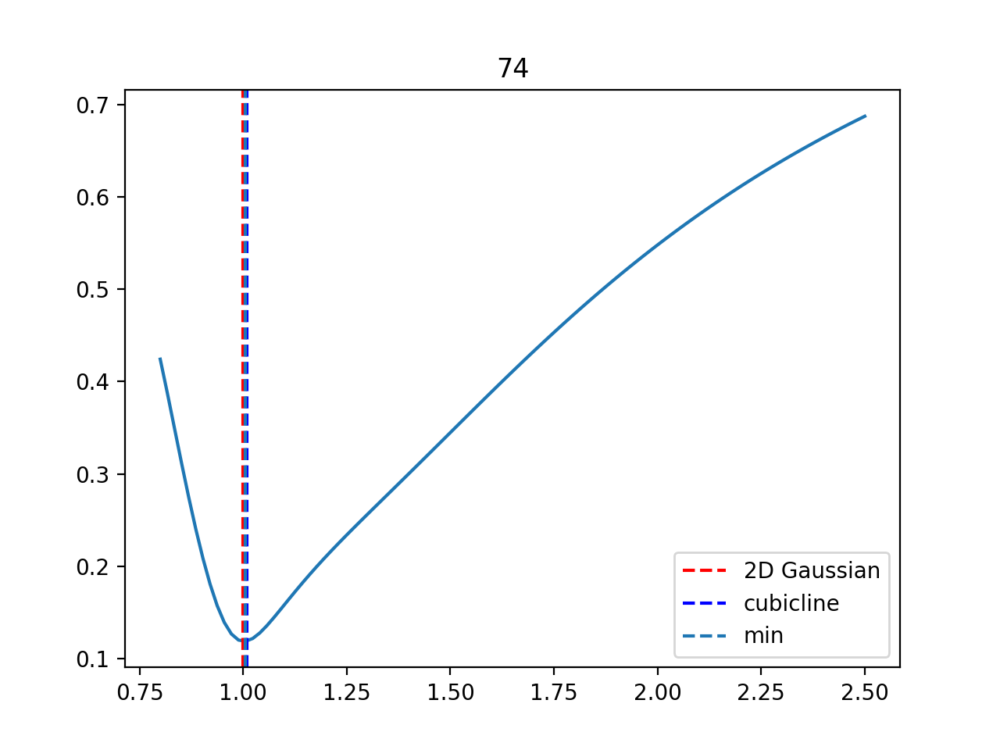

<IPython.core.display.Javascript object>


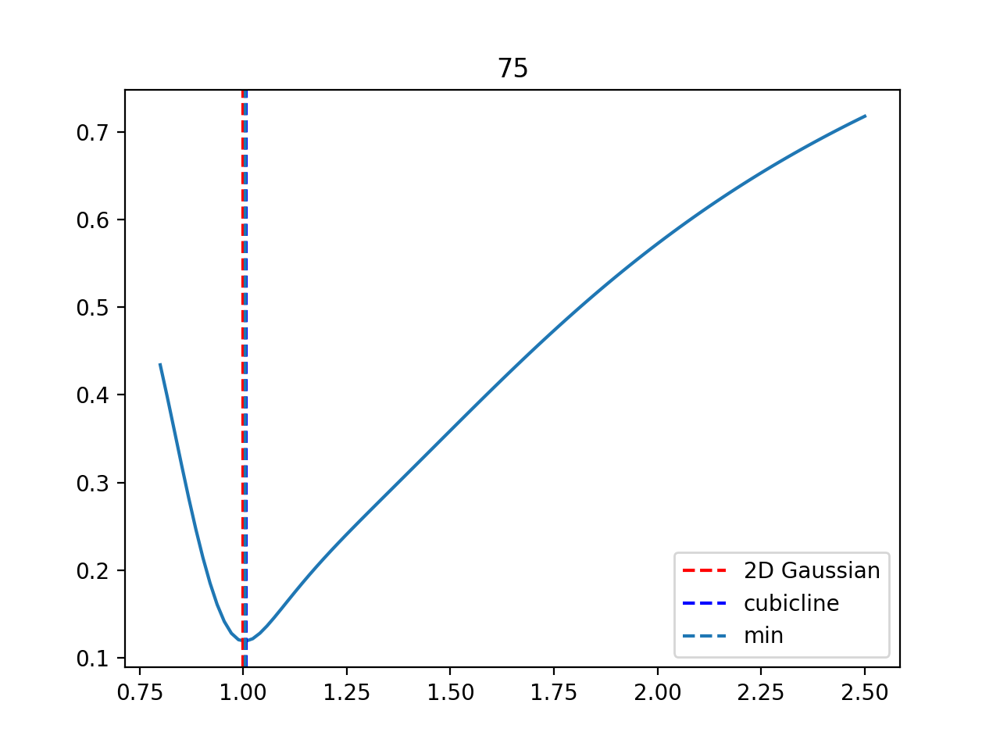

<IPython.core.display.Javascript object>


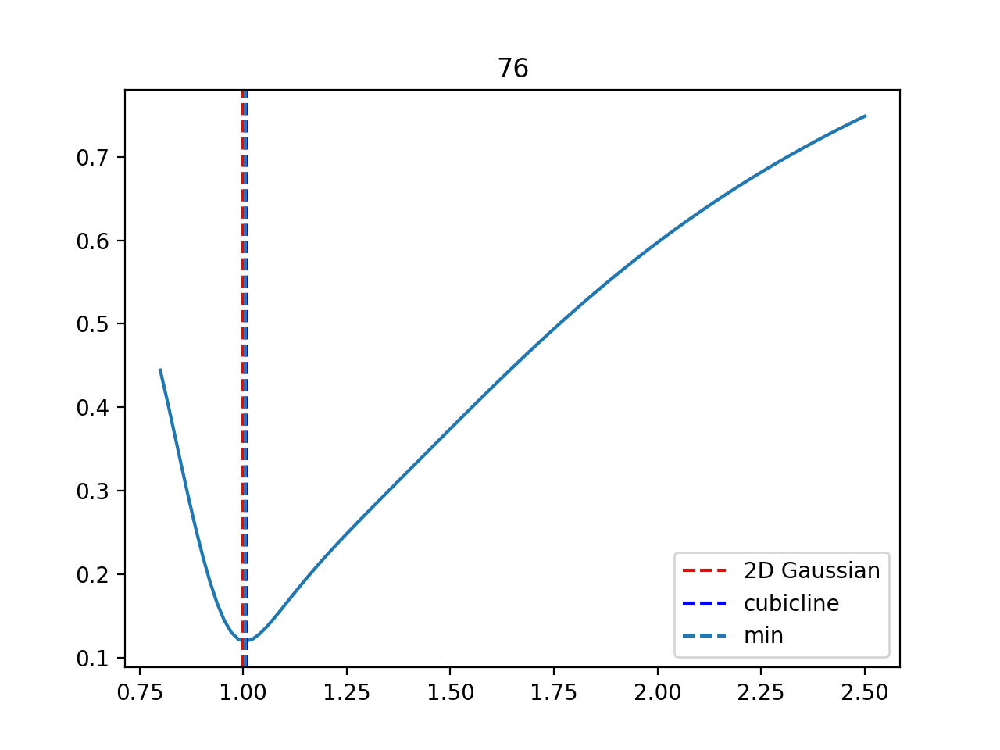

<IPython.core.display.Javascript object>


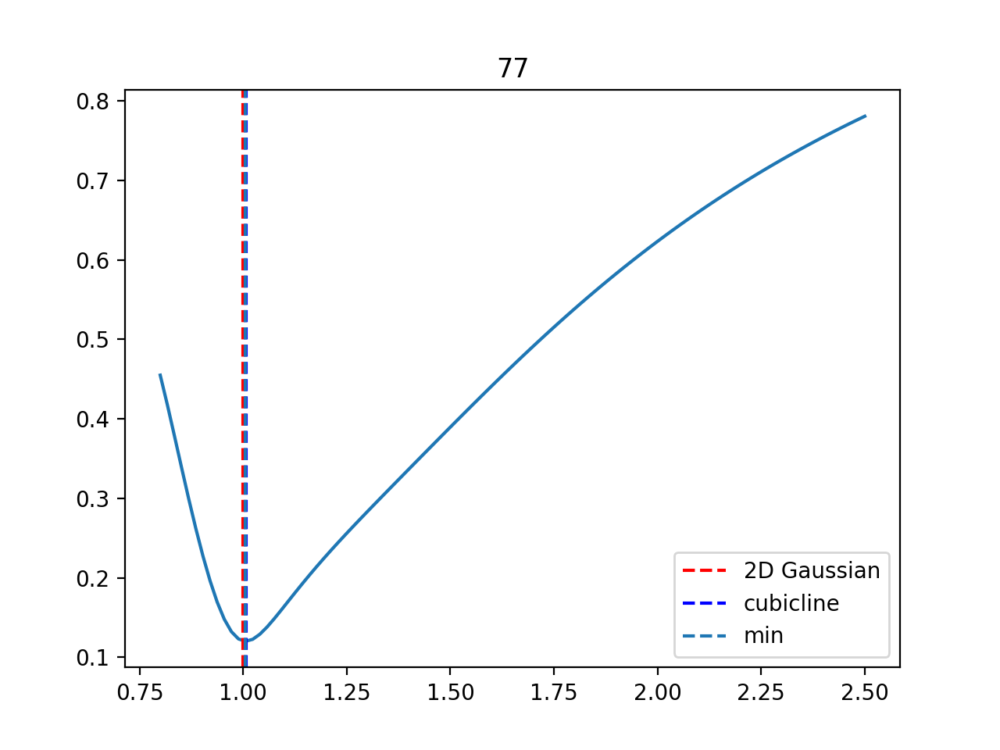

<IPython.core.display.Javascript object>


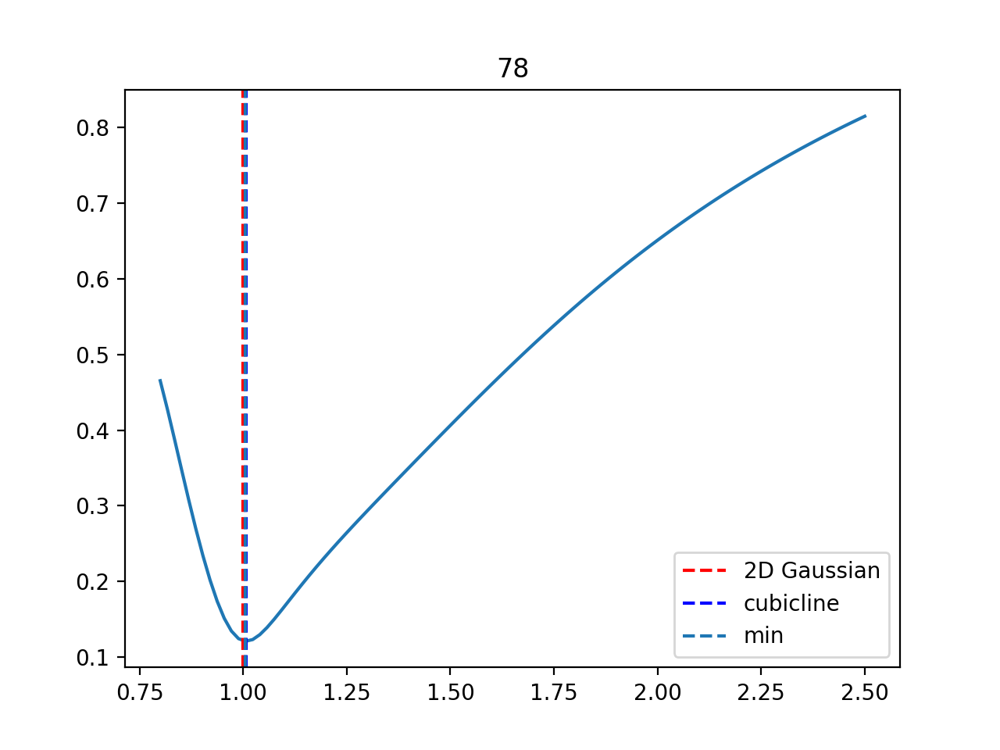

<IPython.core.display.Javascript object>


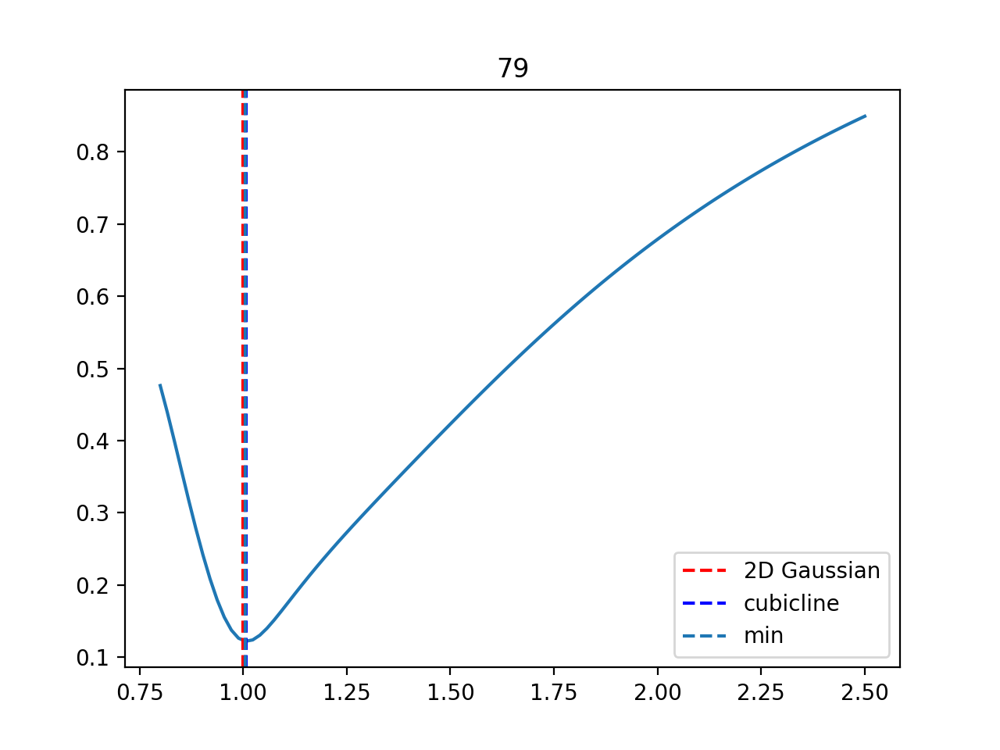

<IPython.core.display.Javascript object>


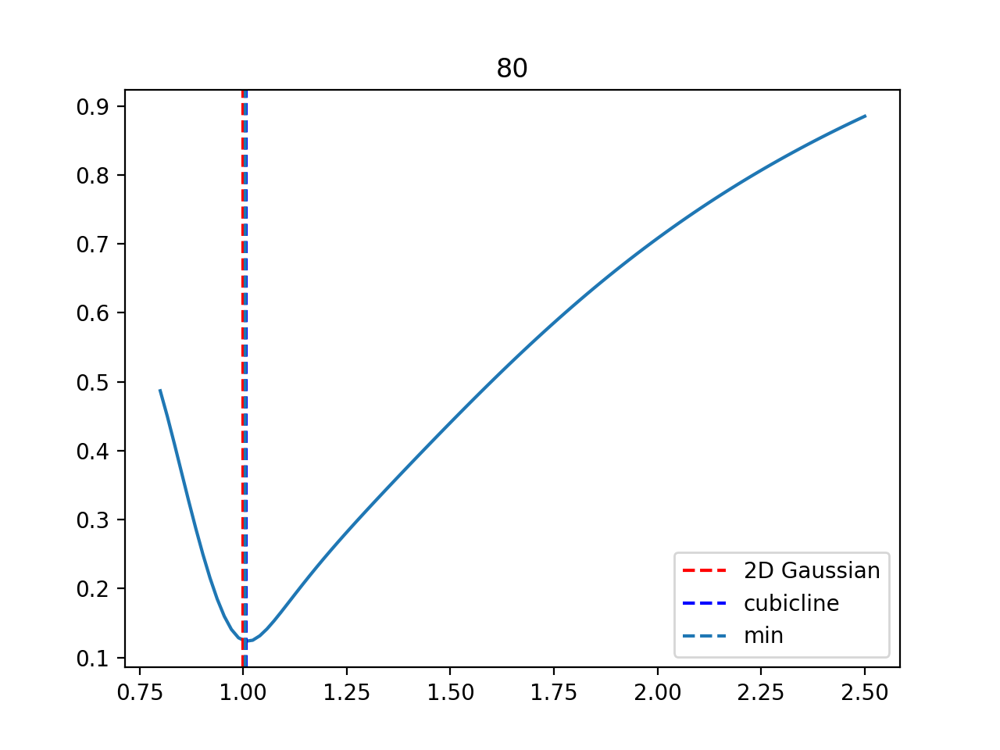

<IPython.core.display.Javascript object>


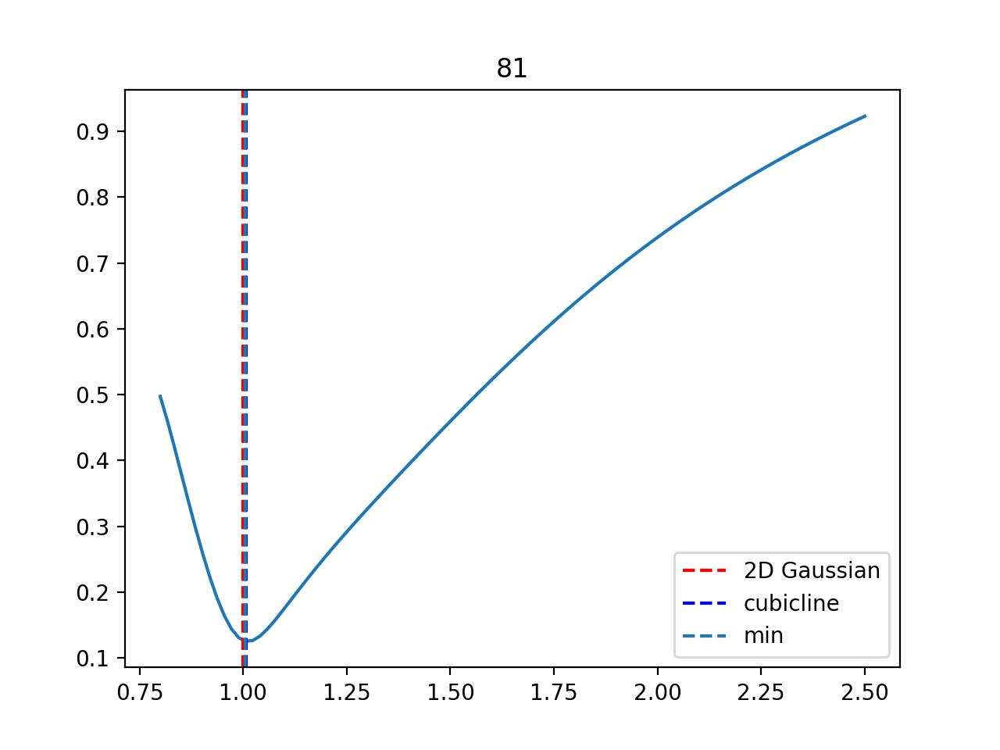

<IPython.core.display.Javascript object>


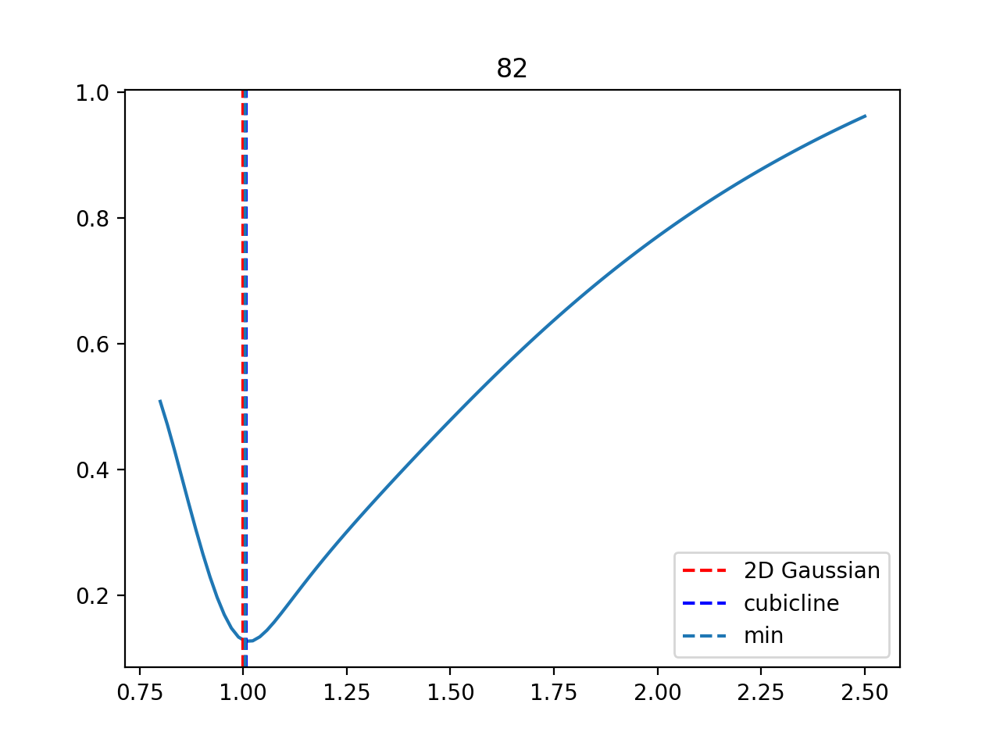

<IPython.core.display.Javascript object>


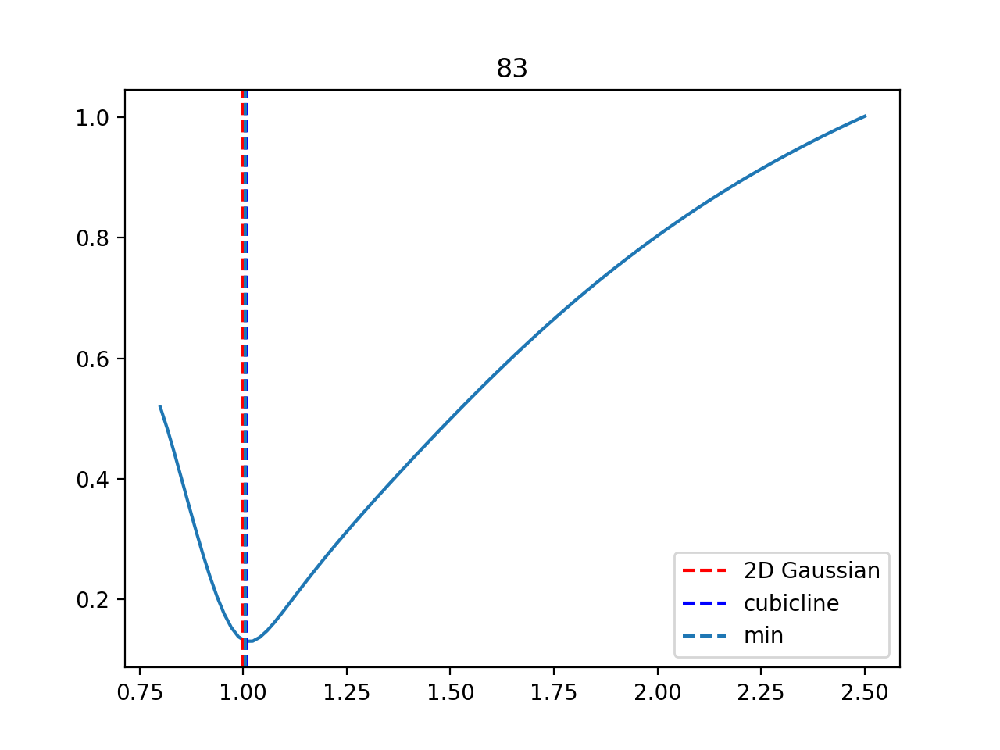

<IPython.core.display.Javascript object>


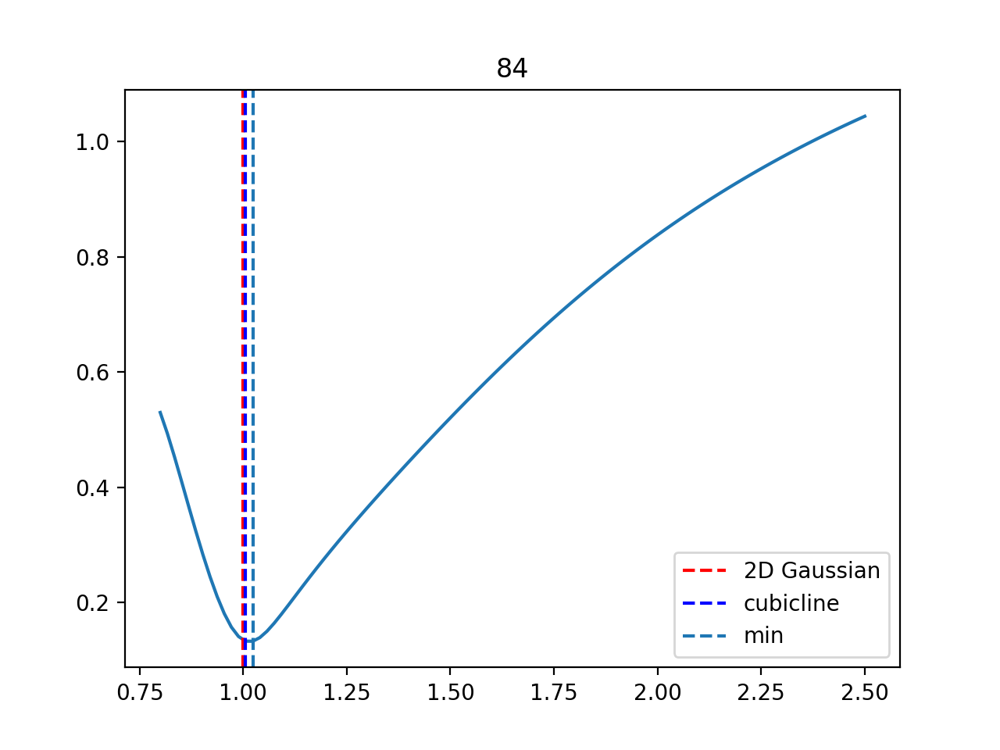

<IPython.core.display.Javascript object>


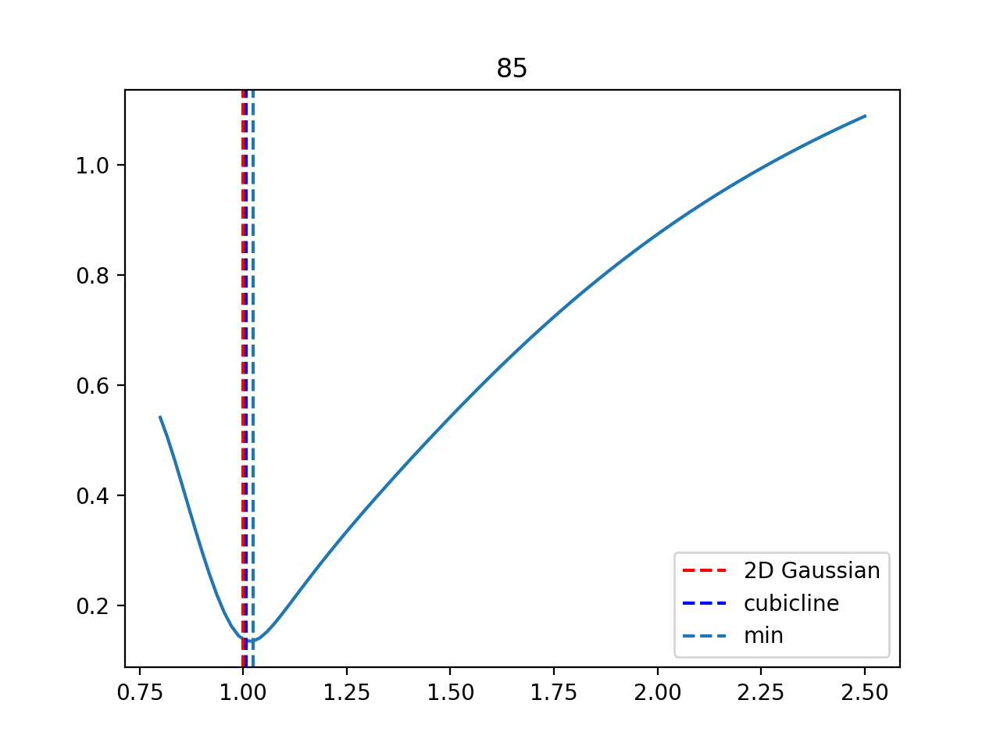

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


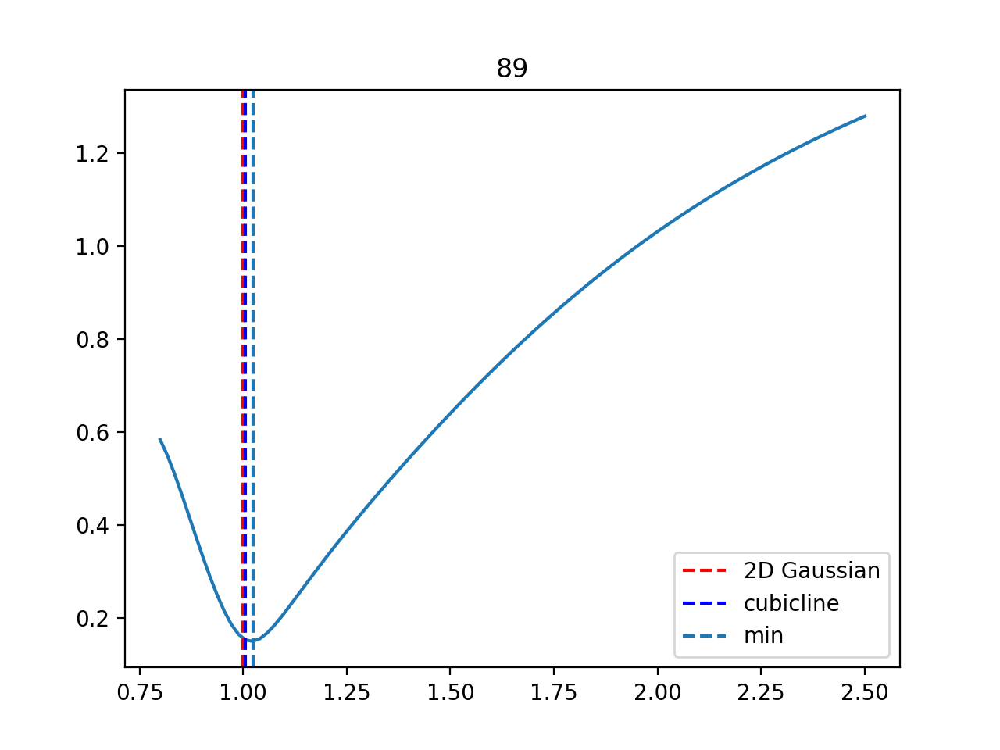

<IPython.core.display.Javascript object>


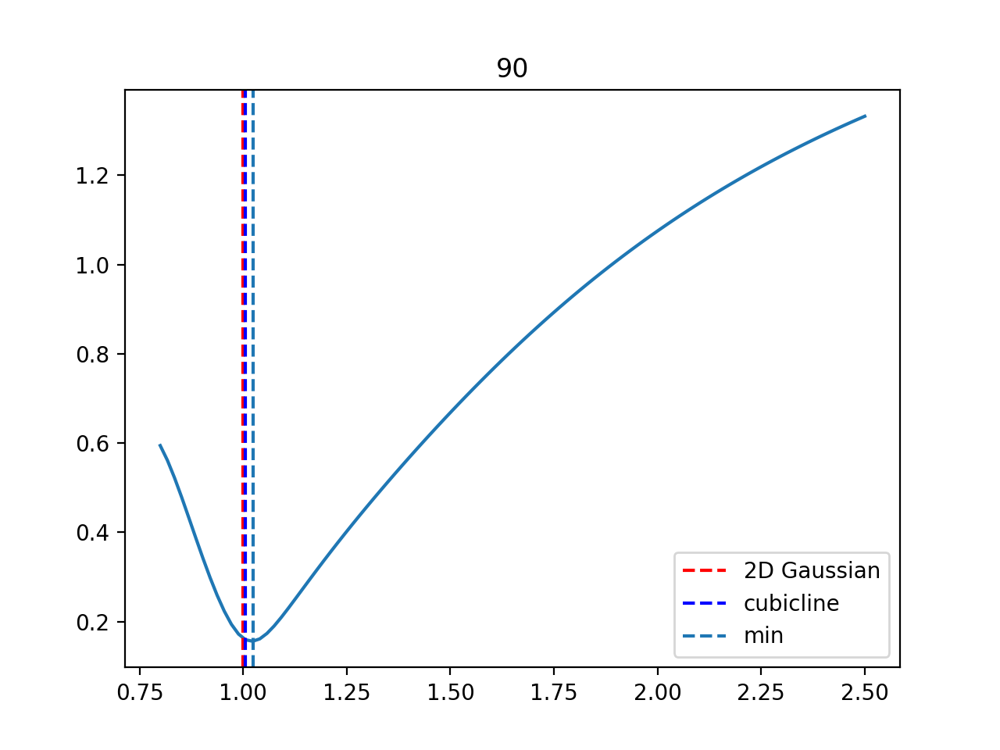

<IPython.core.display.Javascript object>


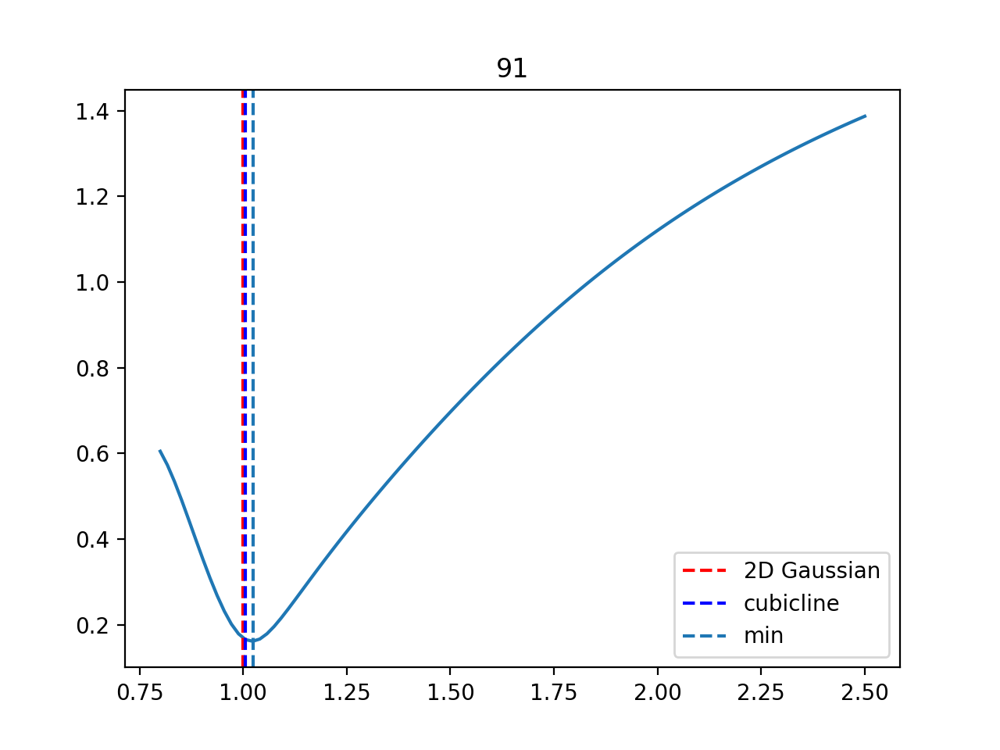

<IPython.core.display.Javascript object>


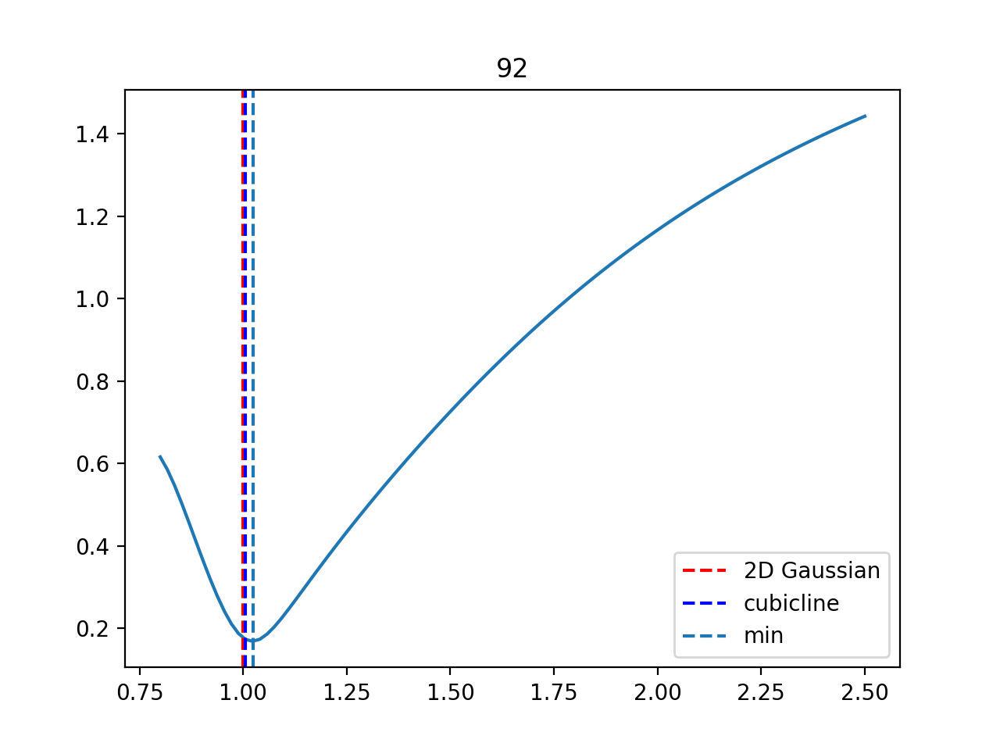

<IPython.core.display.Javascript object>


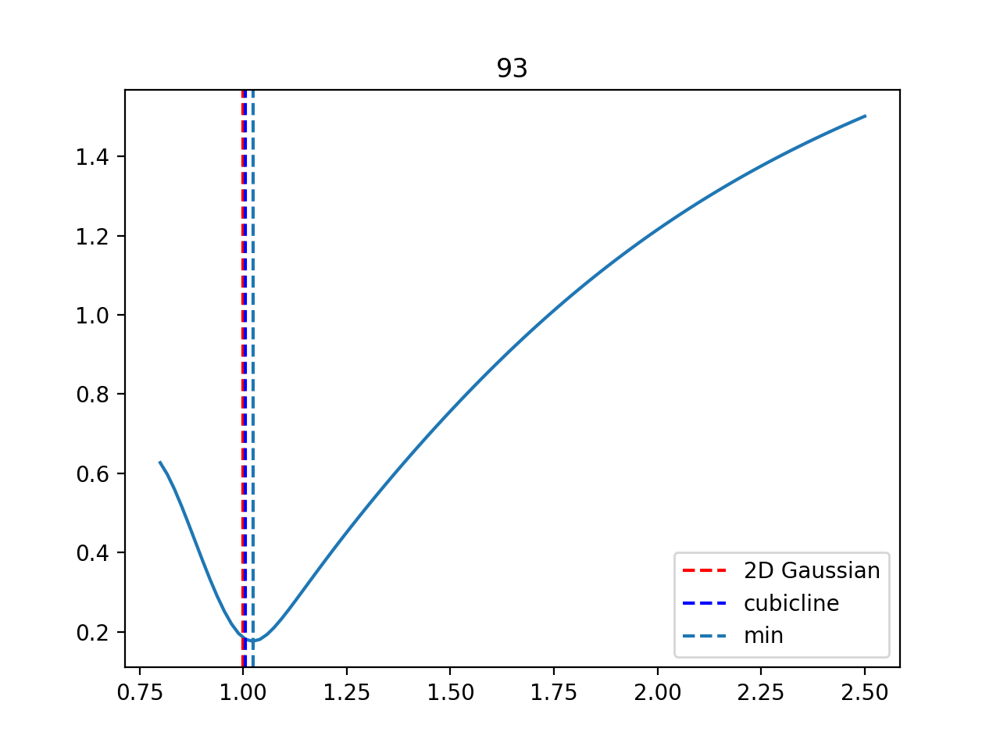

<IPython.core.display.Javascript object>


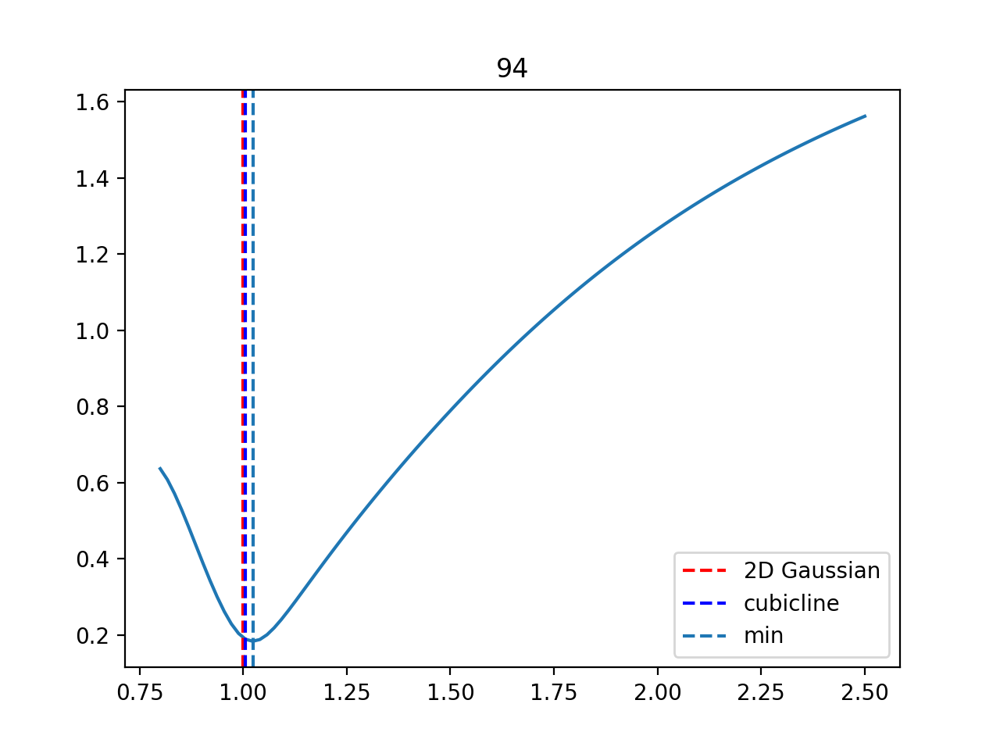

<IPython.core.display.Javascript object>


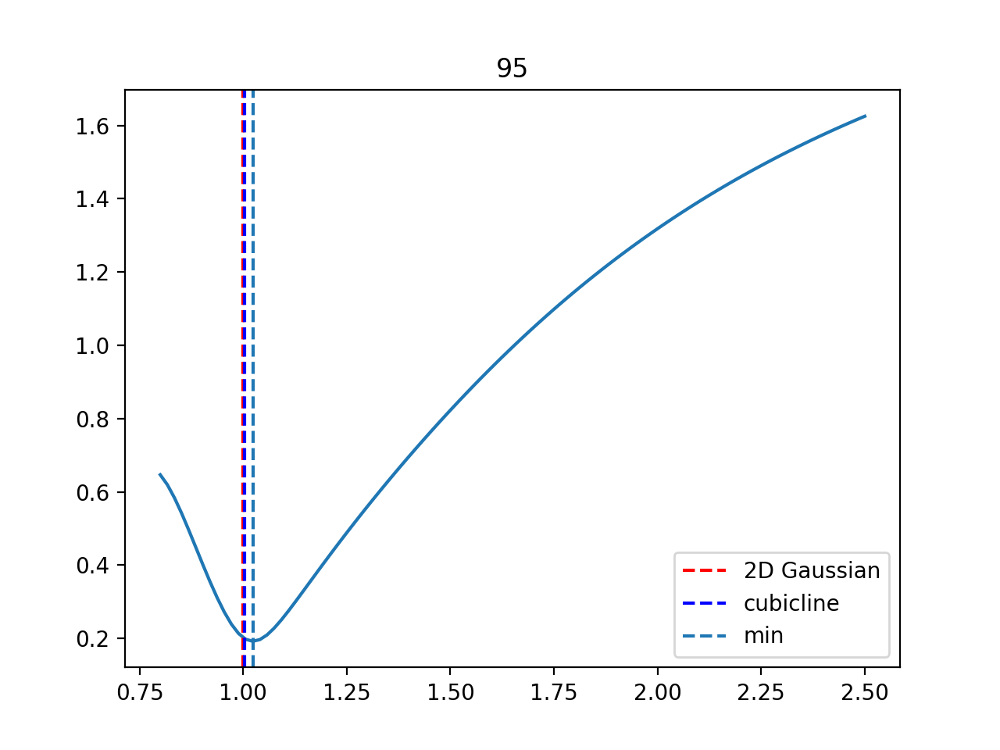

<IPython.core.display.Javascript object>


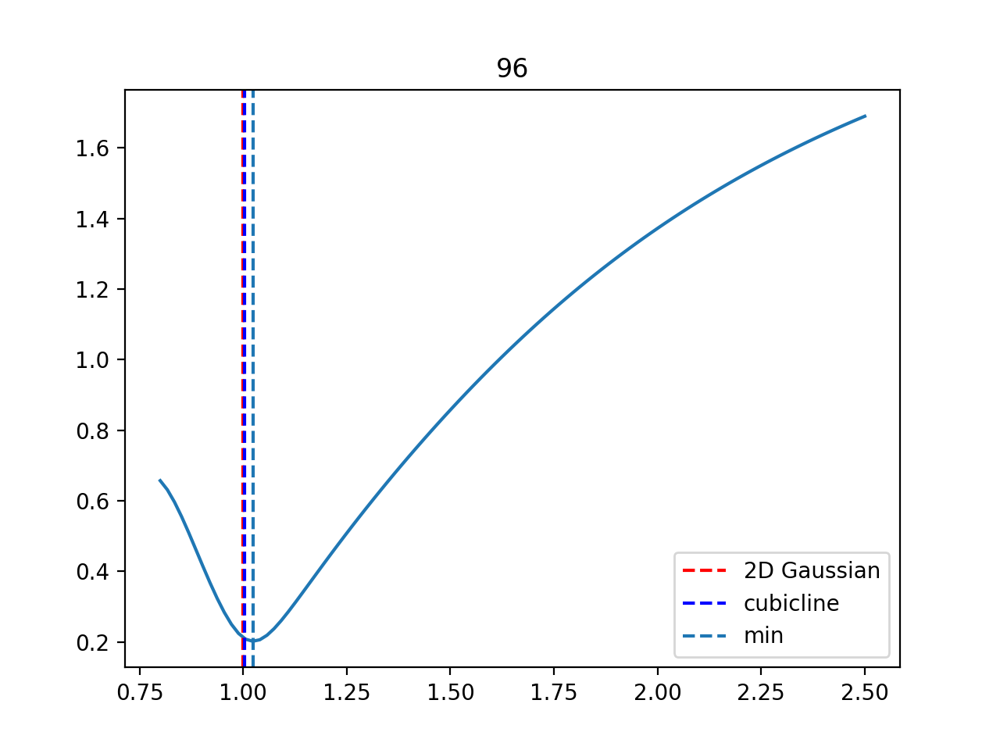

<IPython.core.display.Javascript object>


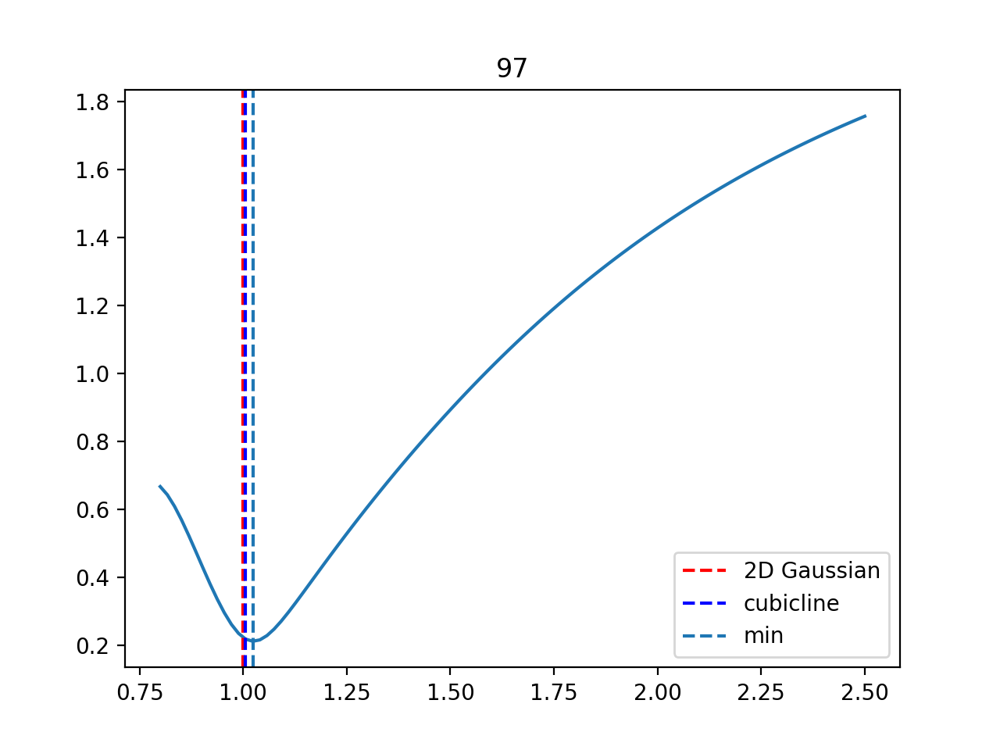

<IPython.core.display.Javascript object>


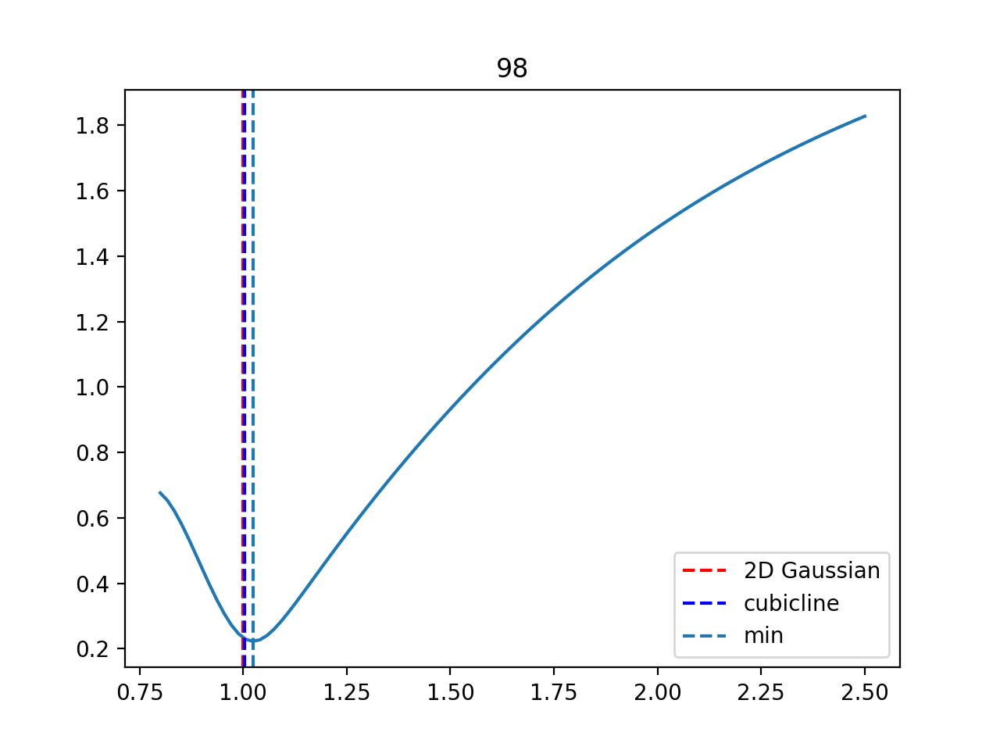

<IPython.core.display.Javascript object>


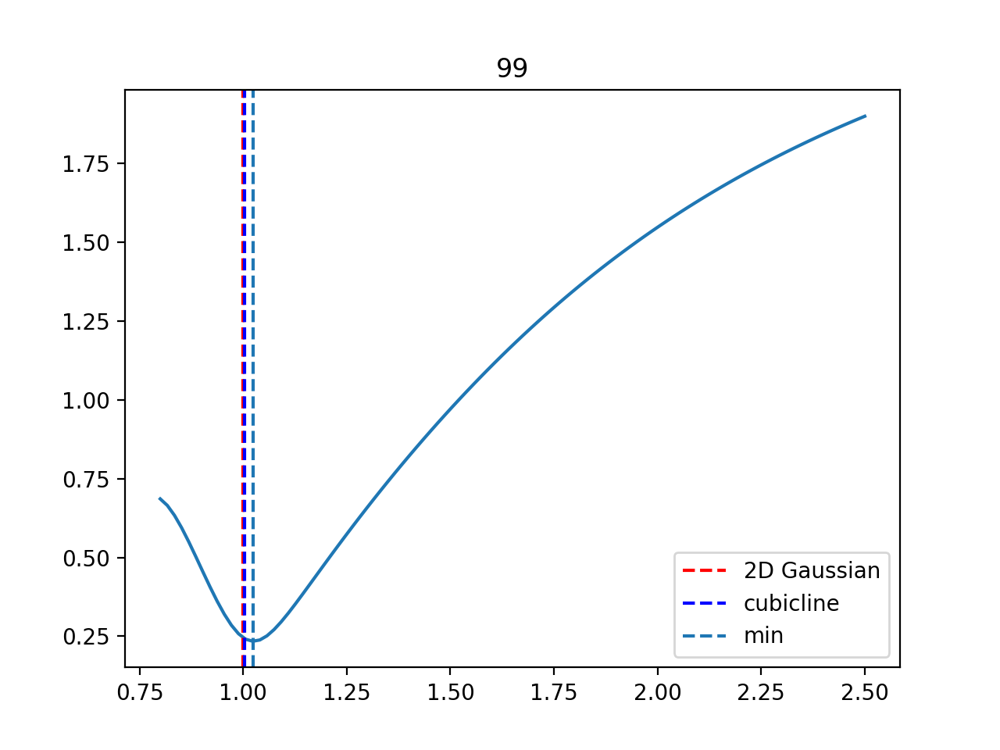

<IPython.core.display.Javascript object>


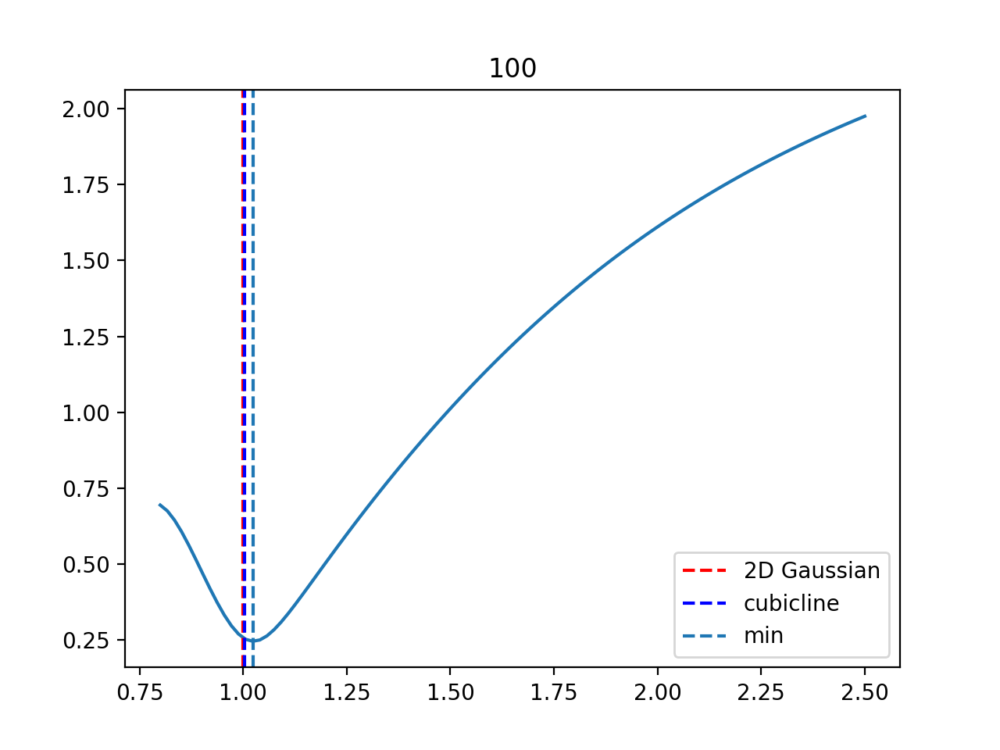

<IPython.core.display.Javascript object>


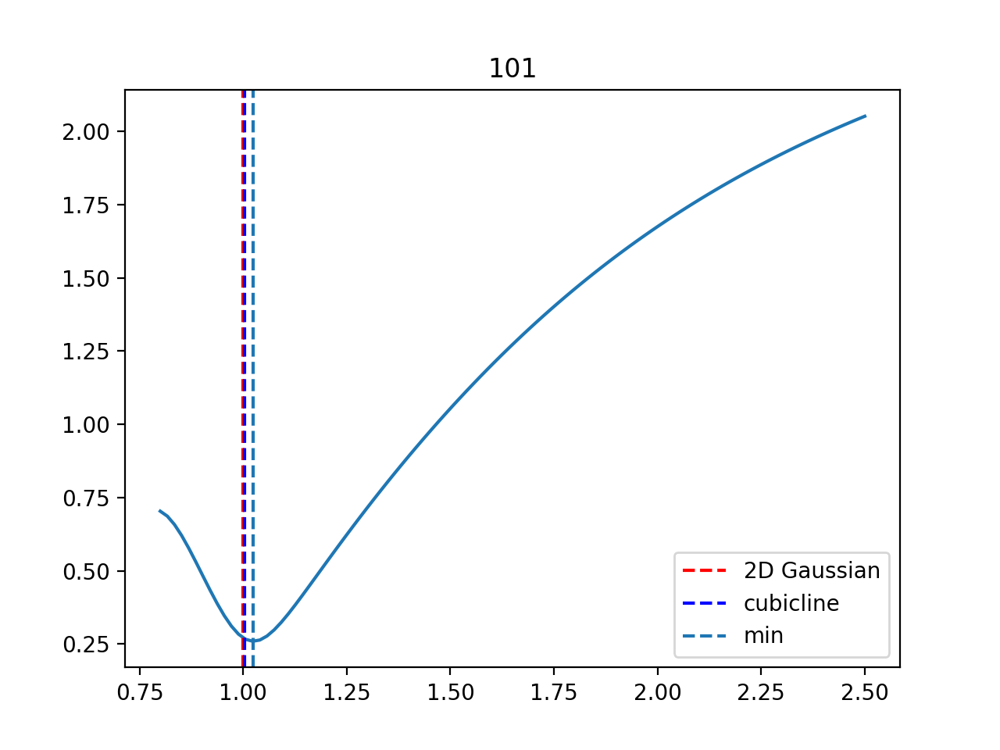

<IPython.core.display.Javascript object>


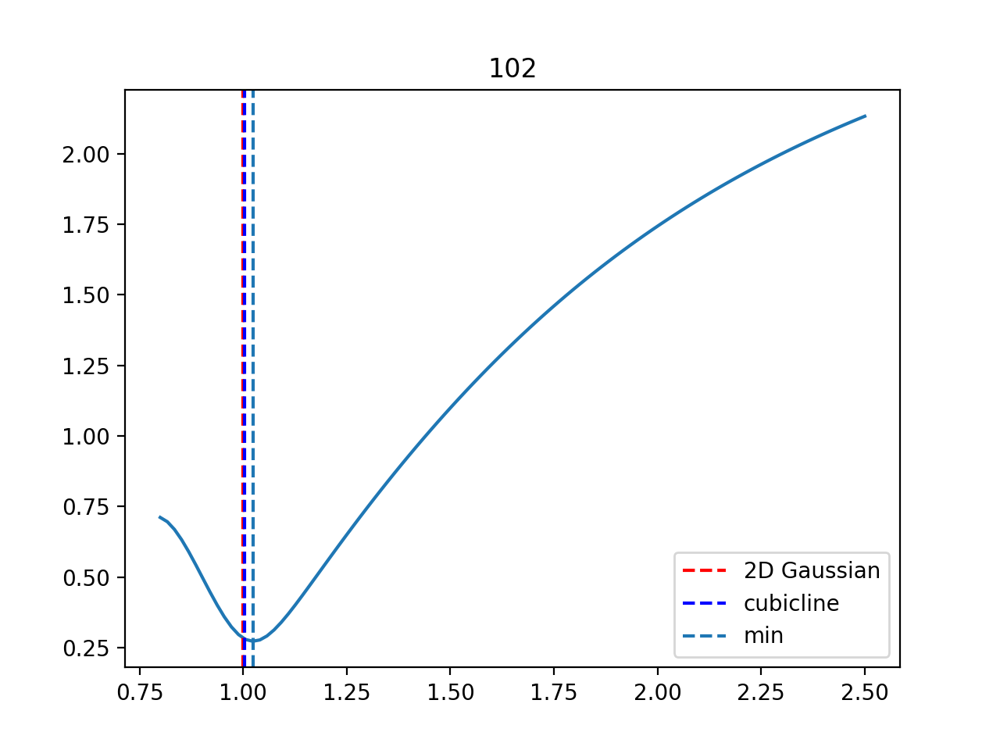

<IPython.core.display.Javascript object>


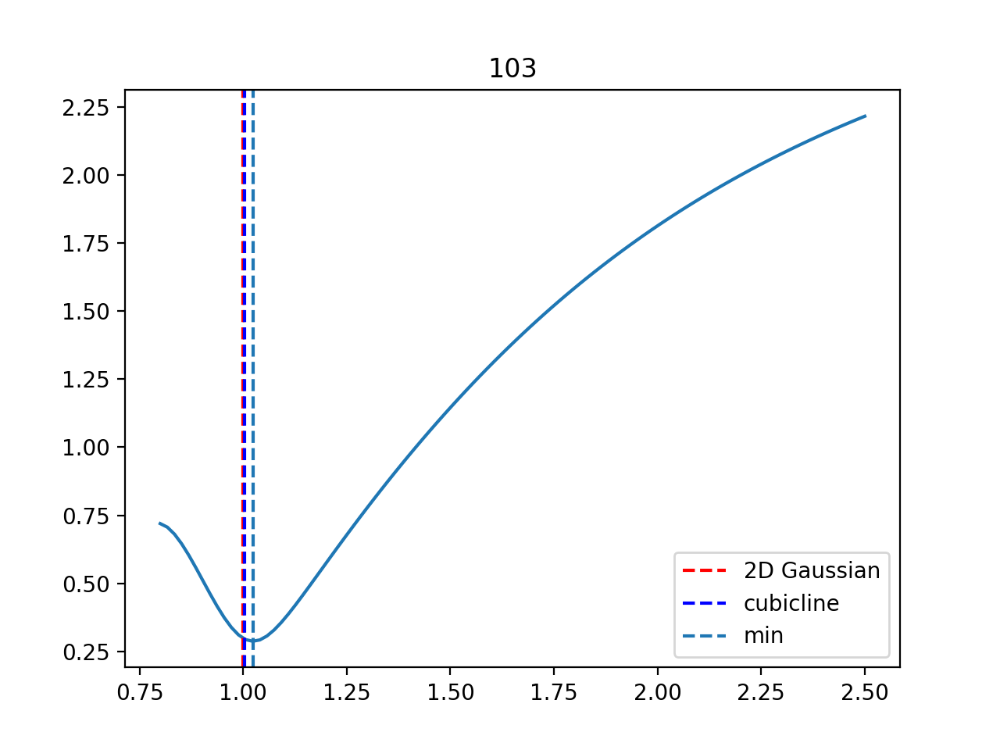

<IPython.core.display.Javascript object>


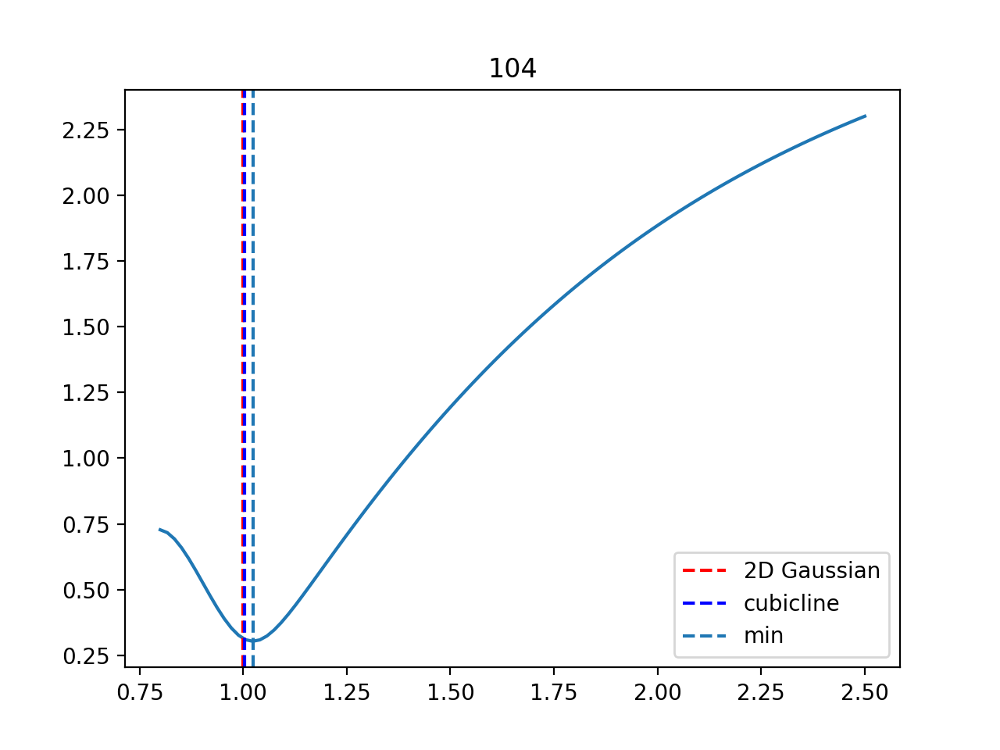

<IPython.core.display.Javascript object>


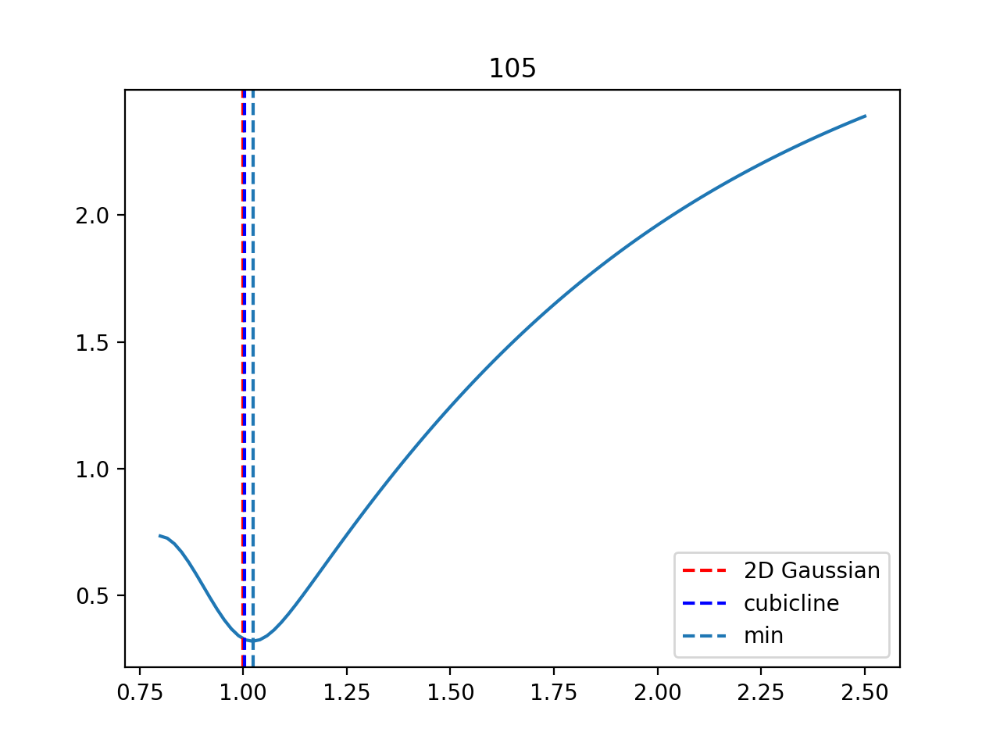

<IPython.core.display.Javascript object>


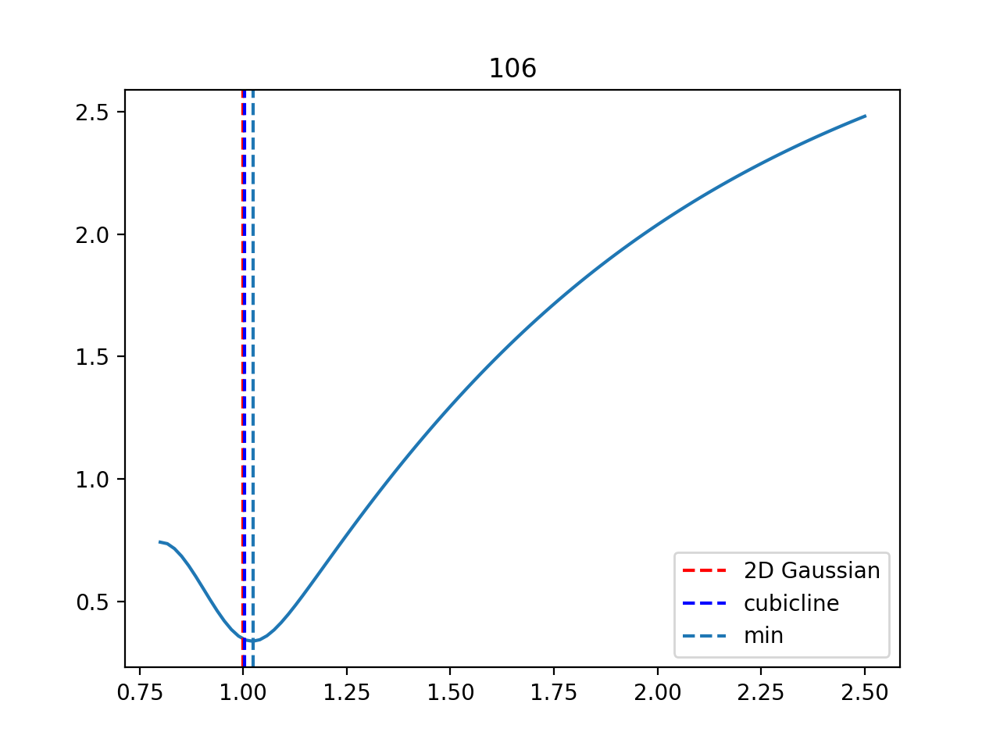

<IPython.core.display.Javascript object>


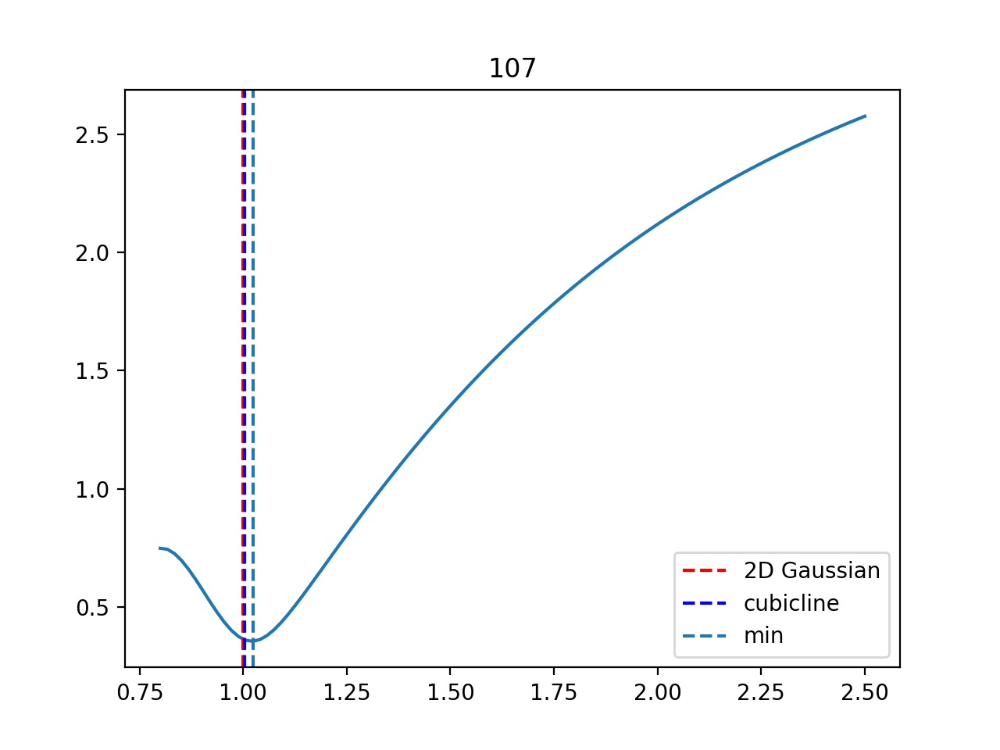

<IPython.core.display.Javascript object>


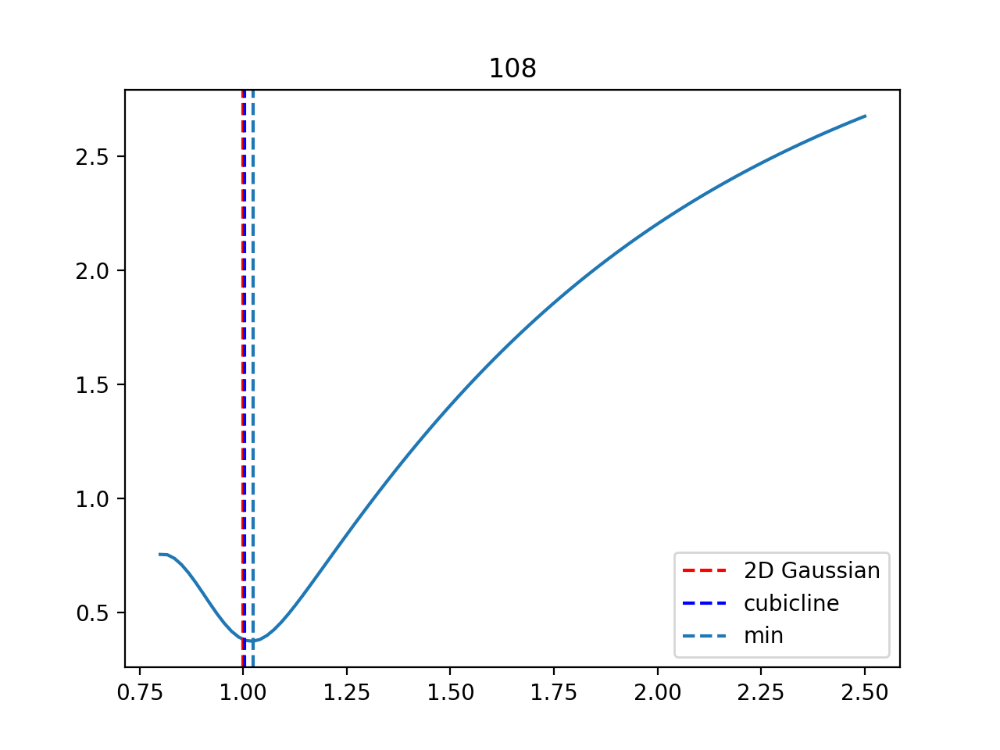

<IPython.core.display.Javascript object>


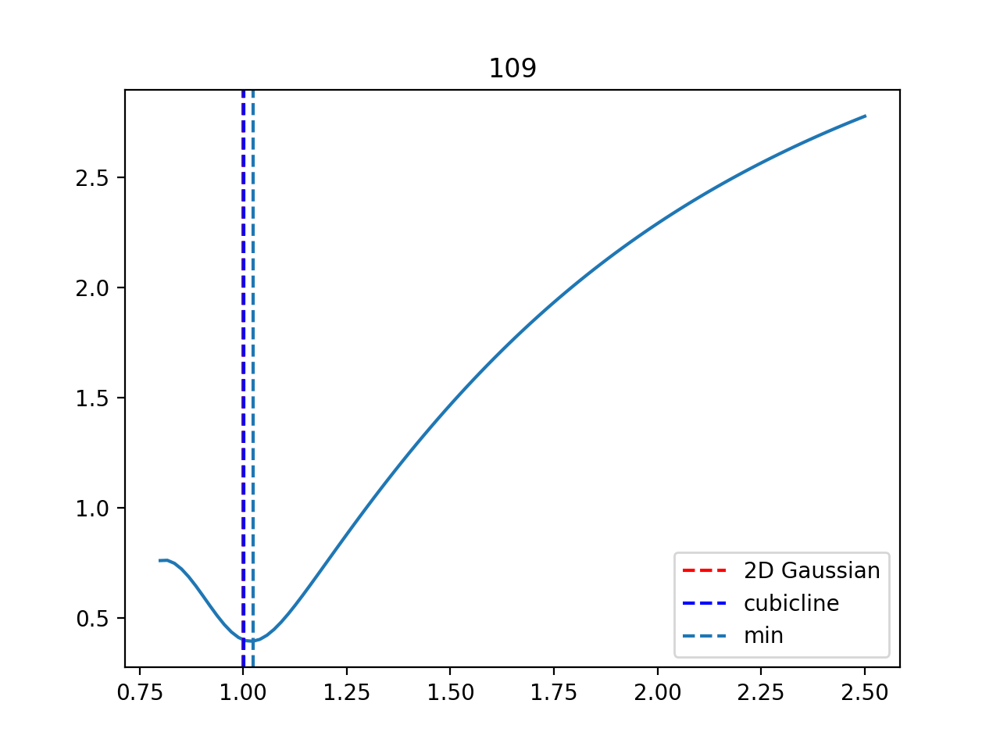

<IPython.core.display.Javascript object>


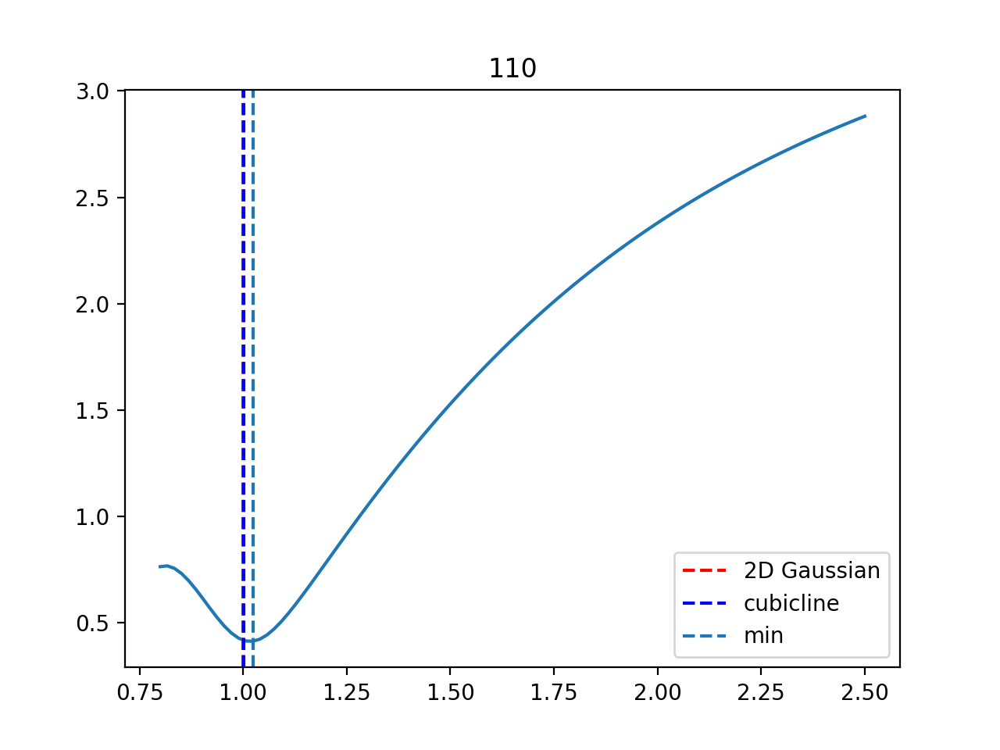

<IPython.core.display.Javascript object>


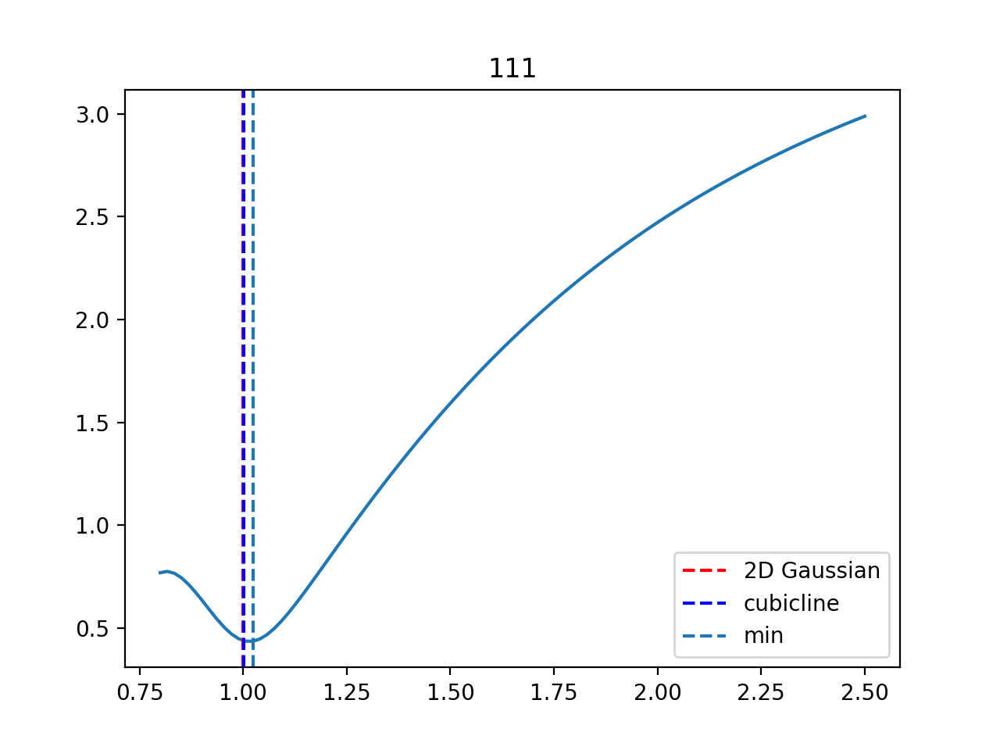

<IPython.core.display.Javascript object>


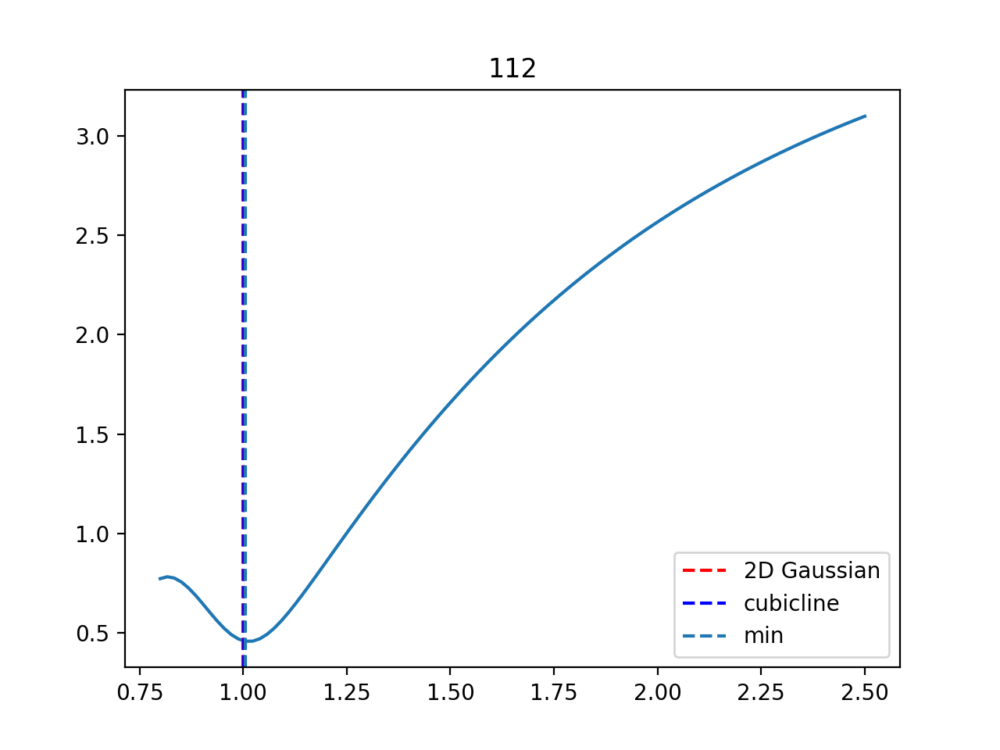

<IPython.core.display.Javascript object>


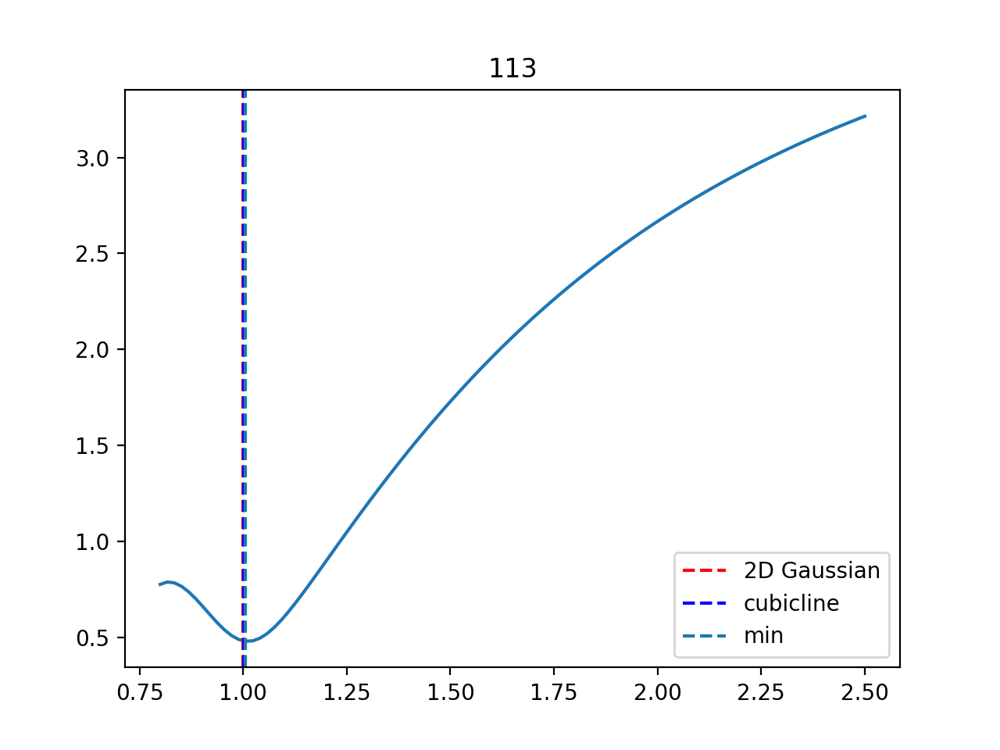

<IPython.core.display.Javascript object>


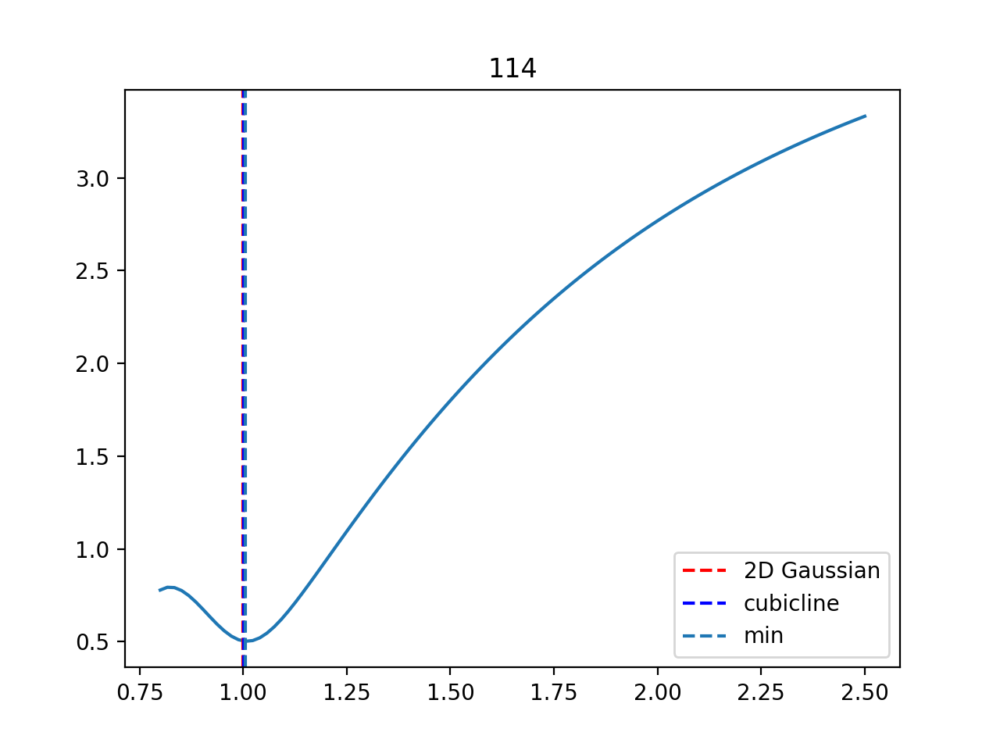

<IPython.core.display.Javascript object>


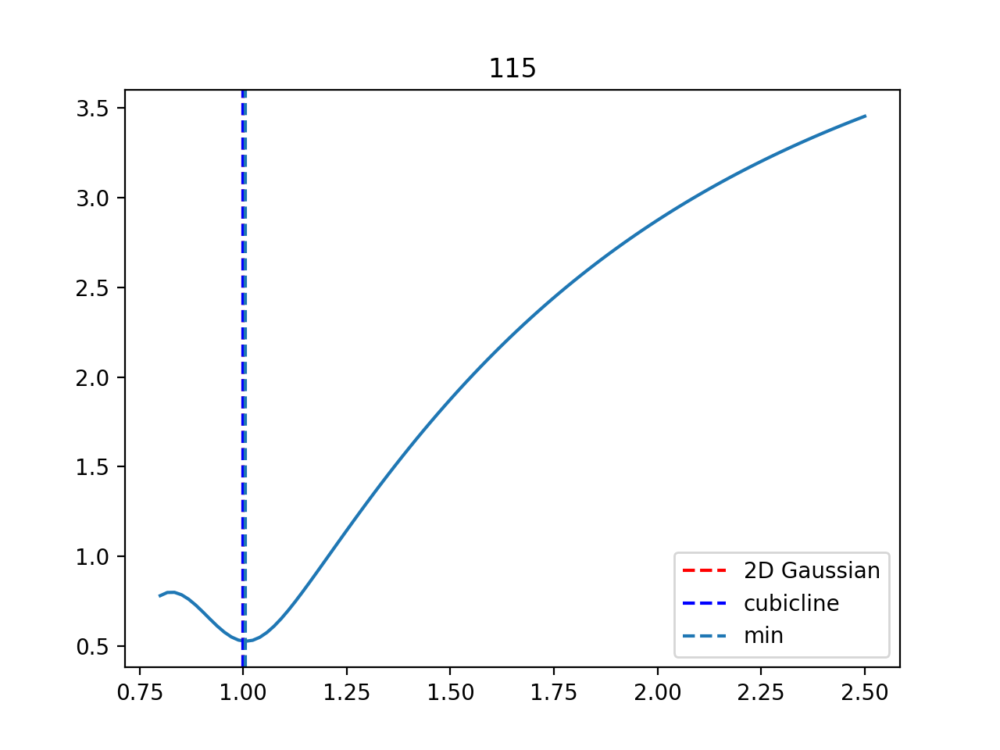

<IPython.core.display.Javascript object>


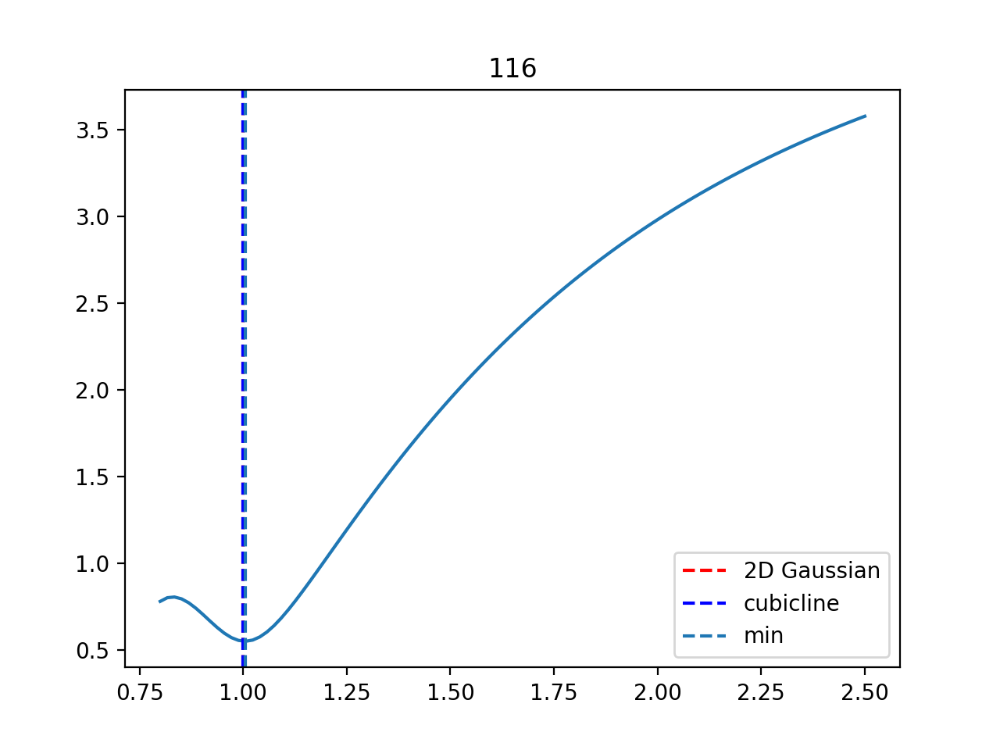

<IPython.core.display.Javascript object>


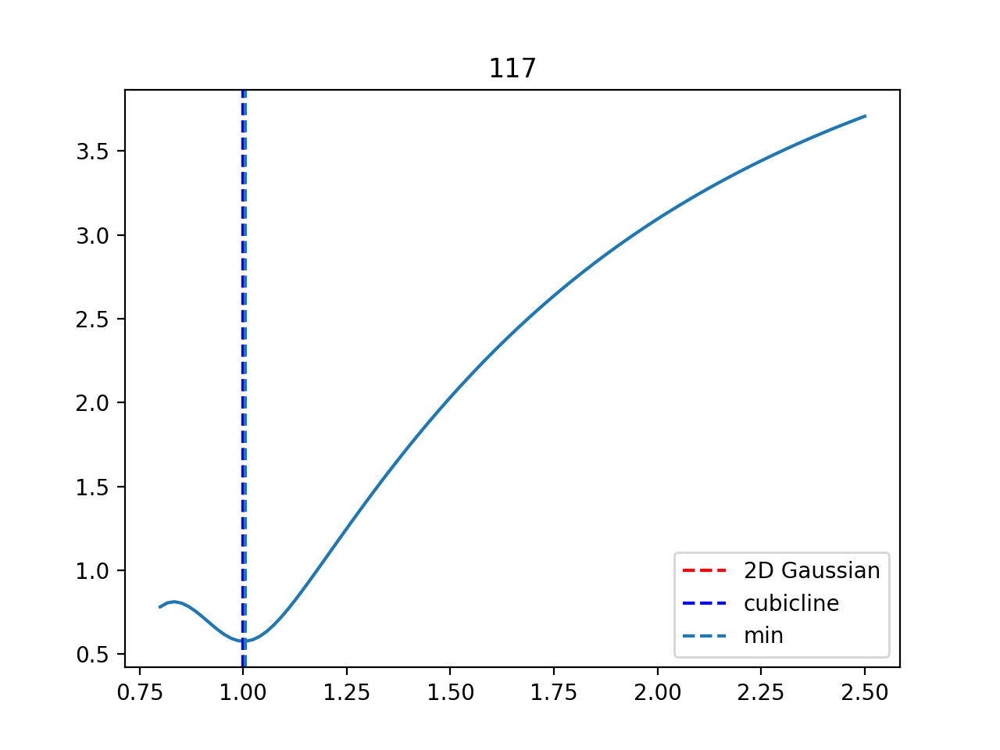

<IPython.core.display.Javascript object>


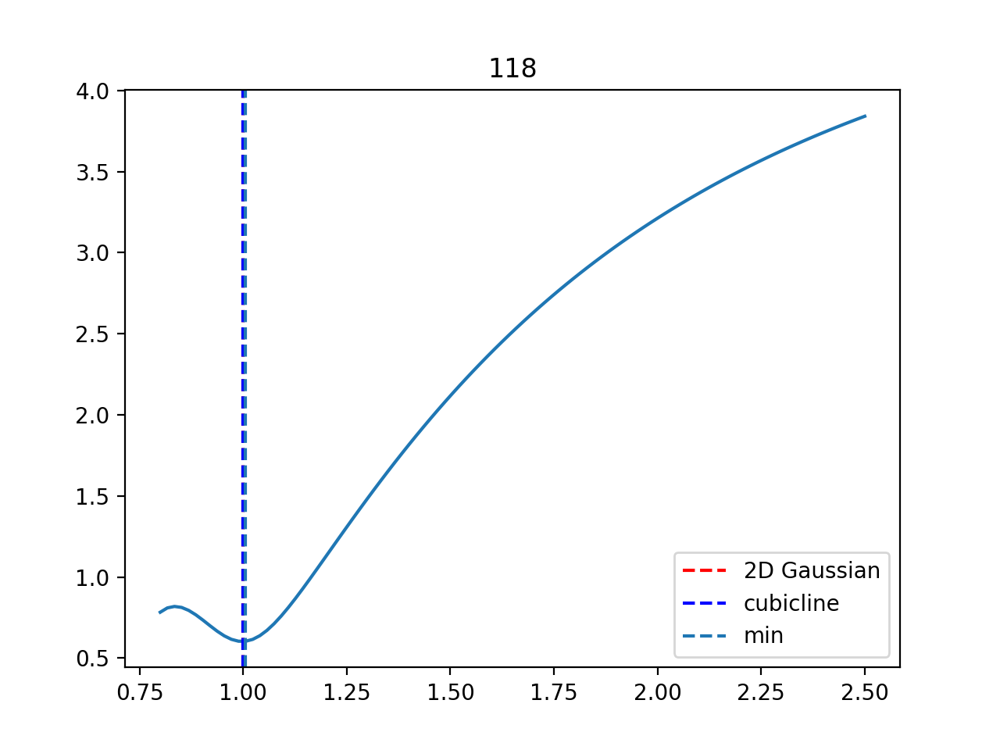

<IPython.core.display.Javascript object>


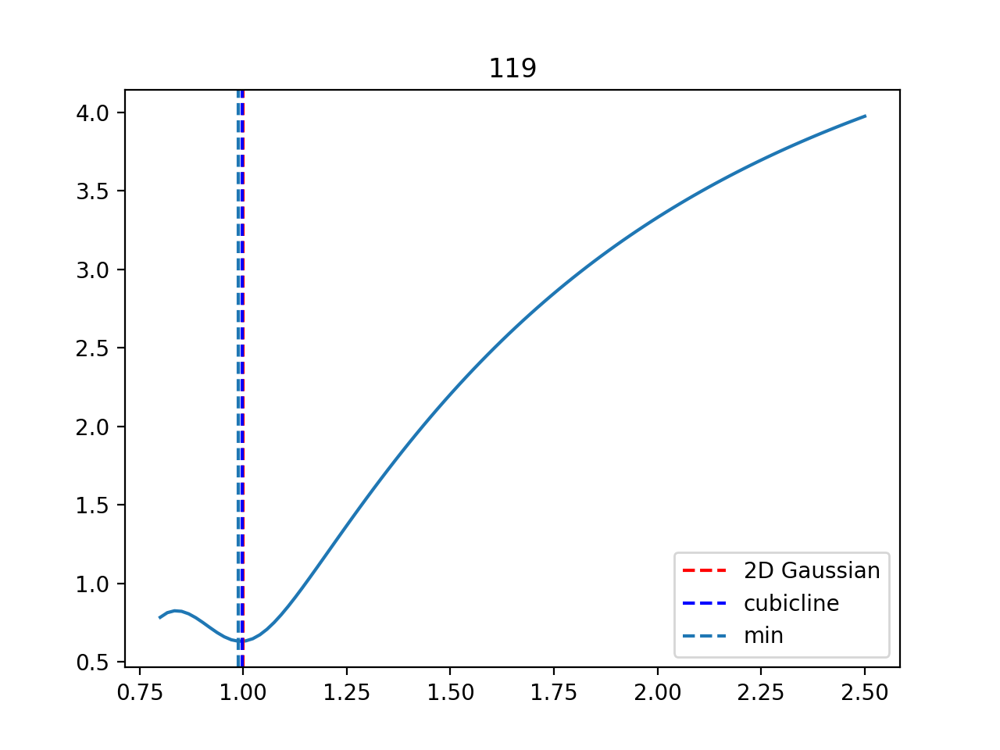

<IPython.core.display.Javascript object>


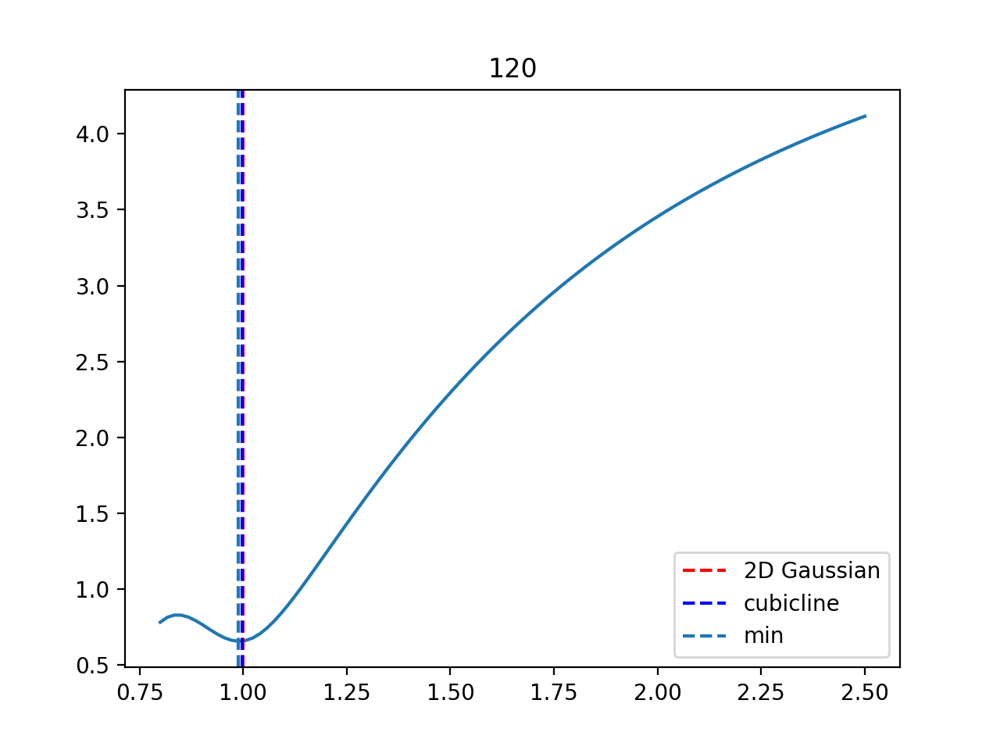

<IPython.core.display.Javascript object>


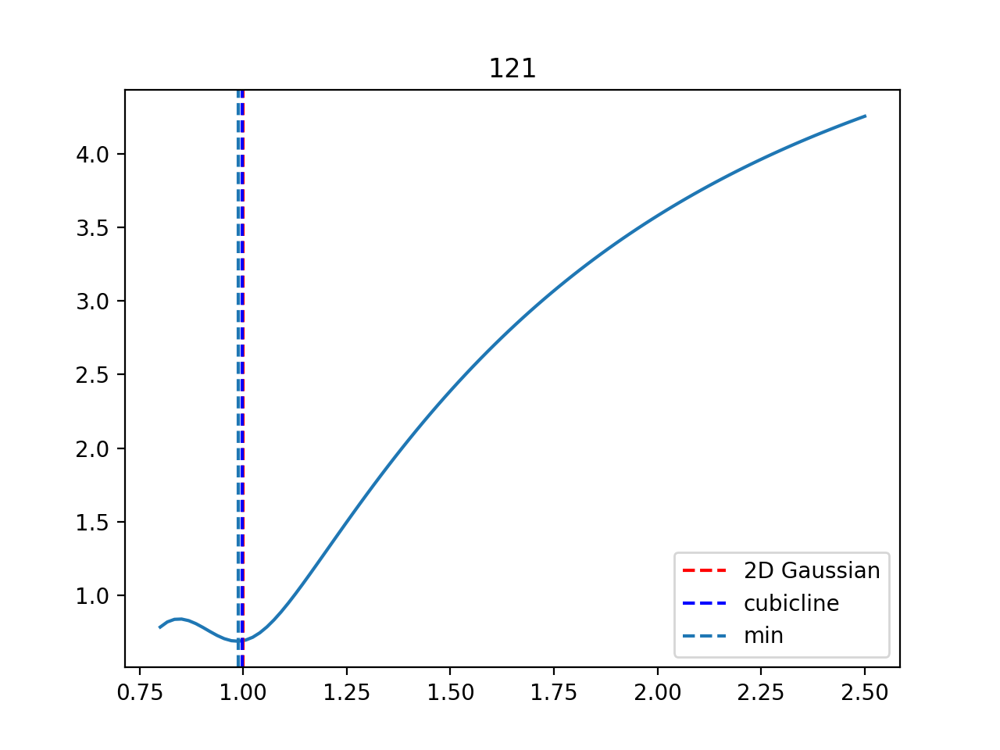

<IPython.core.display.Javascript object>


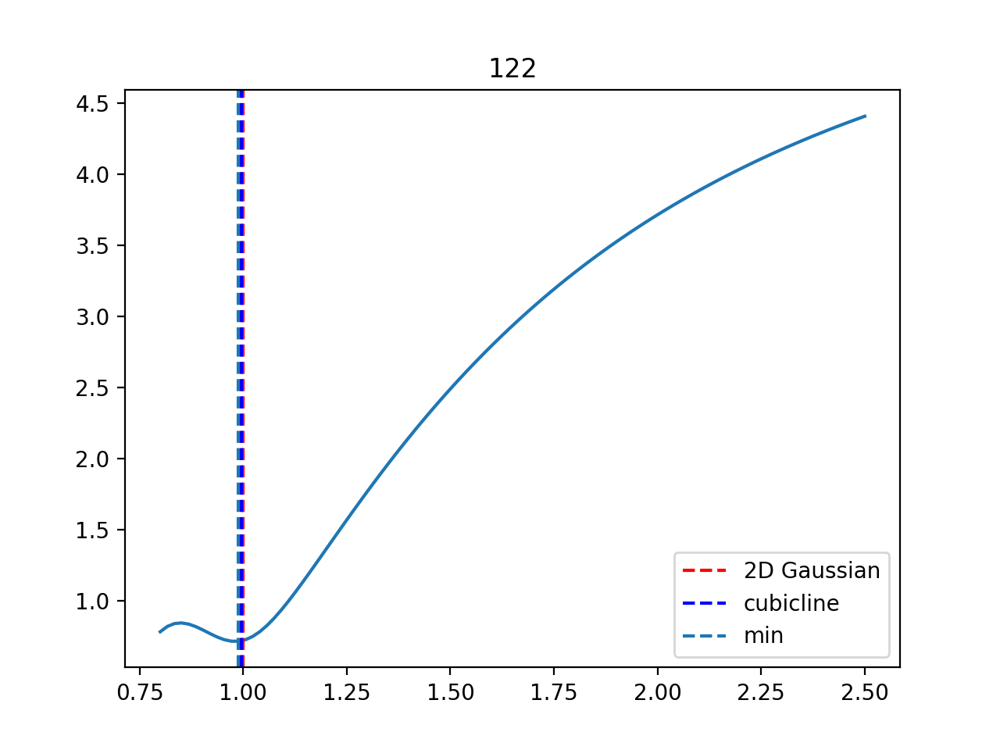

<IPython.core.display.Javascript object>


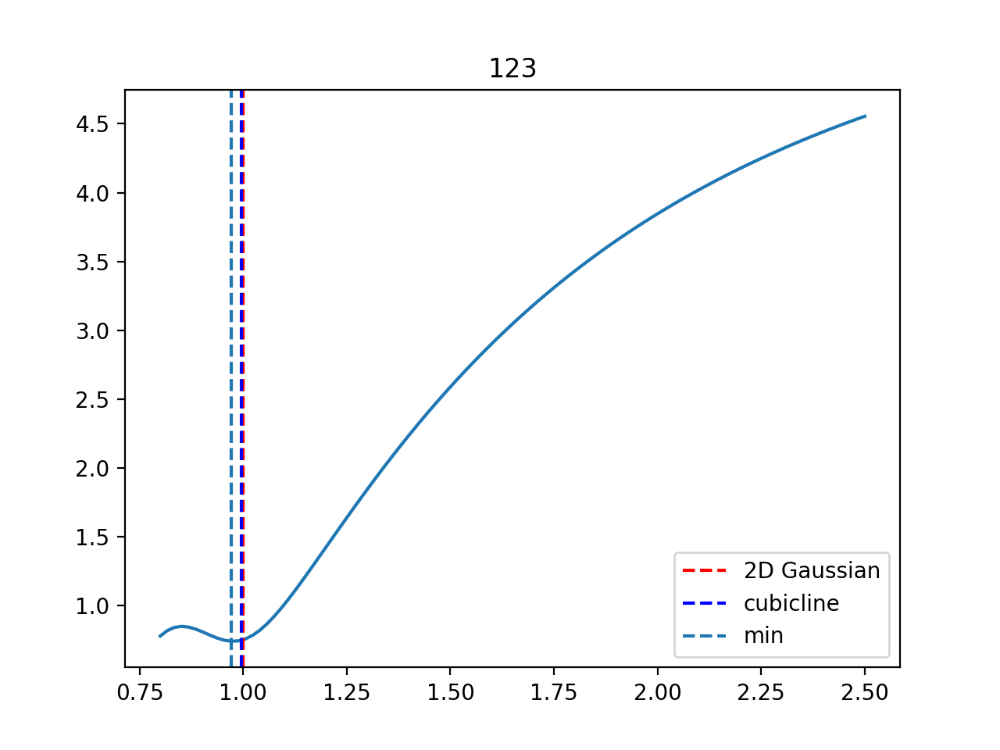

<IPython.core.display.Javascript object>


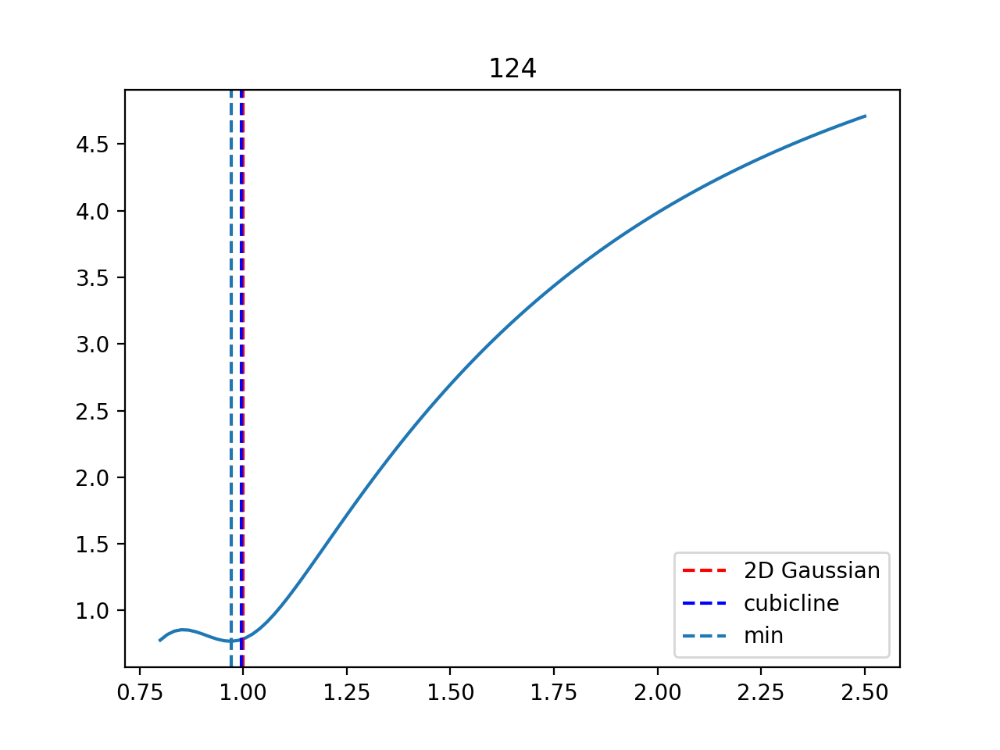

<IPython.core.display.Javascript object>


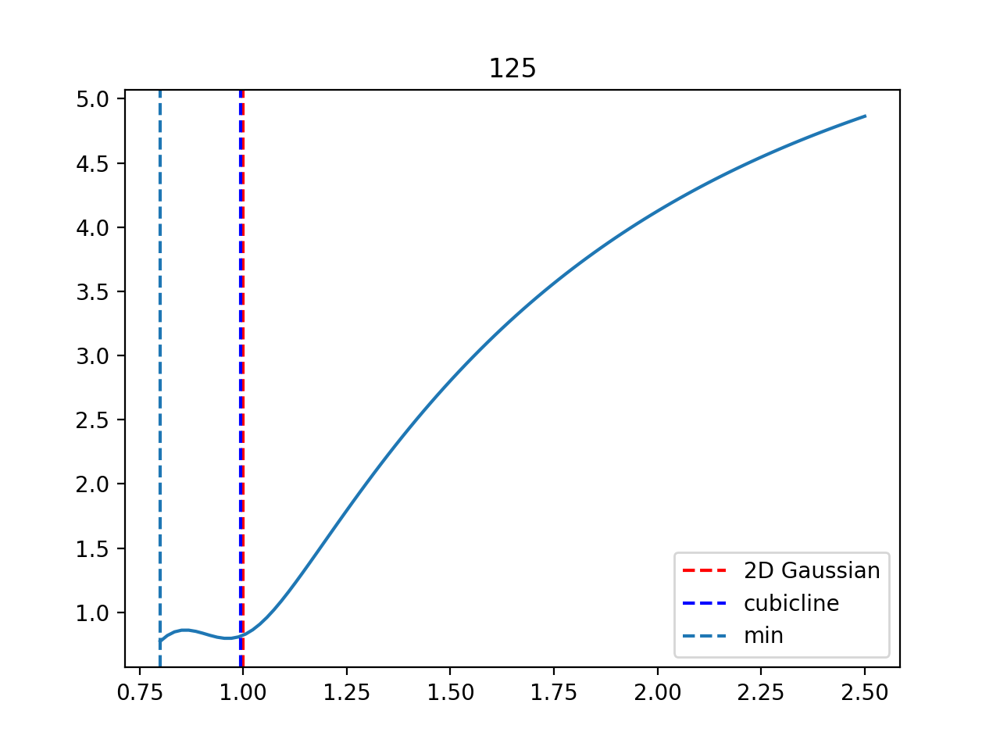

In [202]:
for i in range(len(pcall)):
    minind = pcall[i].index(min(pcall[i]))
    minr = totalsigrange[i][minind]/sigg[i]
    plt.figure()
    plt.plot(np.linspace(0.8,2.5,100),pcall[i])
    plt.axvline(x = 1, color='r', linestyle='--', label = '2D Gaussian')
    plt.axvline(x = totalsigfwhm[i]/sigg[i], color='b', linestyle='--', label = 'cubicline')
    plt.axvline(x = minr, linestyle='--', label = 'min')
    plt.legend()
    plt.title(i+25)

In [225]:
totalsigrange2 = []
for i in sigg:
    totalsigrange2.append(np.linspace(0.2*i, 2*i,100))
totalsigrange2 = totalsigrange2[75:]

In [241]:
pcall2 = []
for i in range(len(totalsigrange2)):
    sigrange = totalsigrange2[i]
    pctotal = []
    for sigma in sigrange:
        A = TDH(7)
        data = np.matrix(gain[i+75].T.flatten())
        coe = solve(A,data.T)
        finalresi = residual2D(A,data.T)
        meansquare = np.sum(np.multiply(finalresi,finalresi))/(360*91)
        rms = np.sqrt(meansquare)
        pctotal.append(rms/np.max(gain[i+75])*100)
    pcall2.append(pctotal)
    print(i)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25


<IPython.core.display.Javascript object>


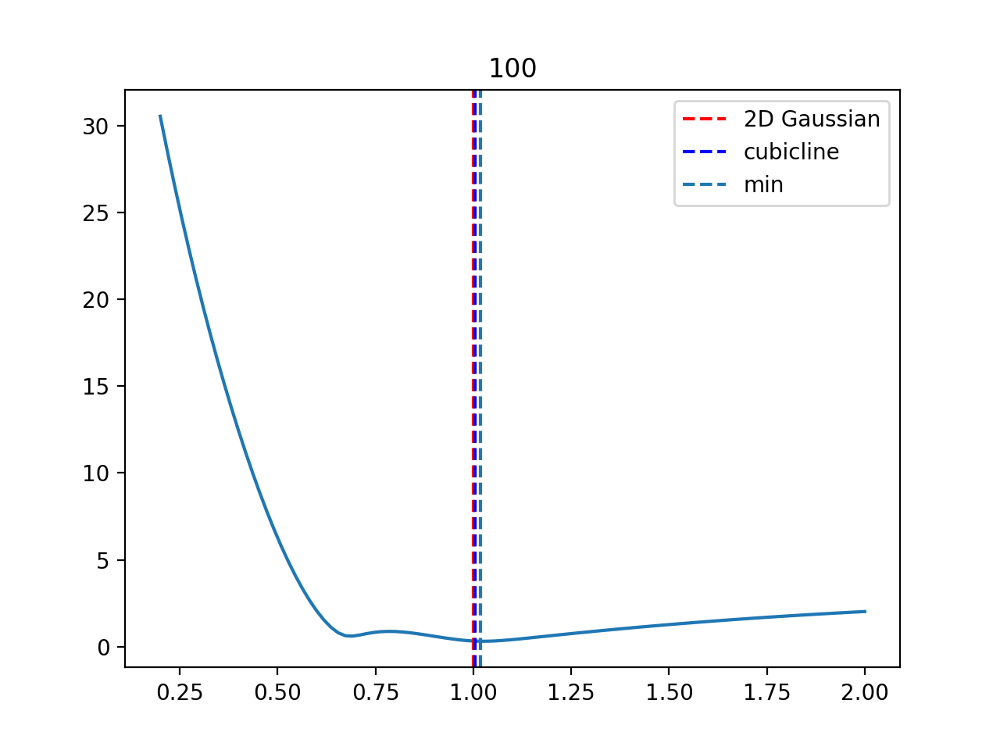

<IPython.core.display.Javascript object>


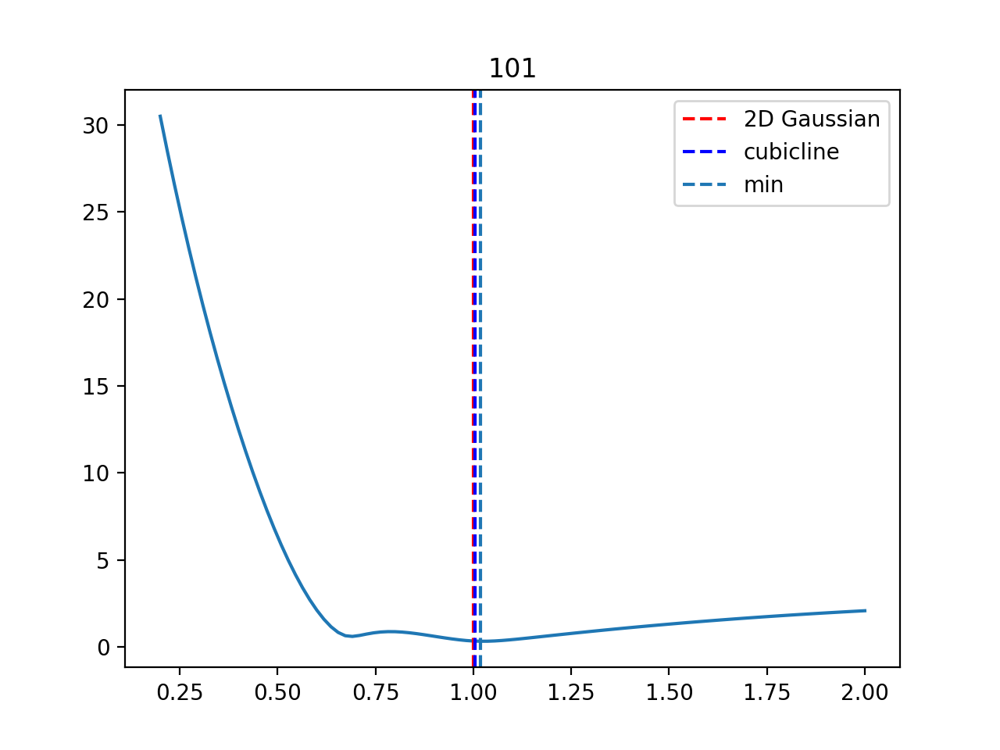

<IPython.core.display.Javascript object>


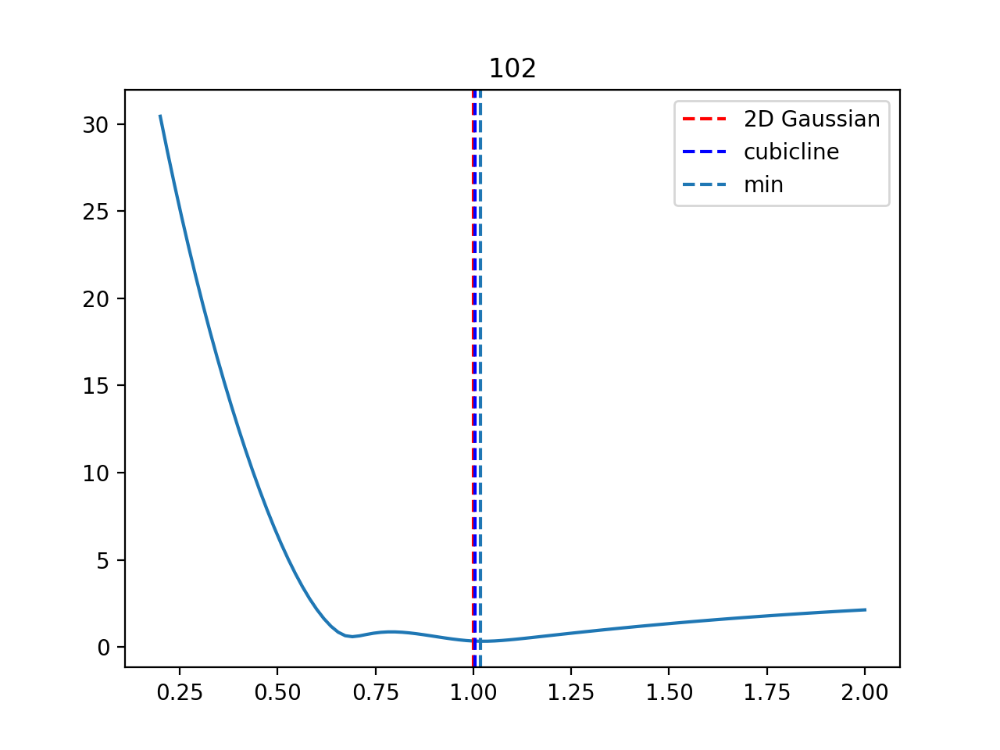

<IPython.core.display.Javascript object>


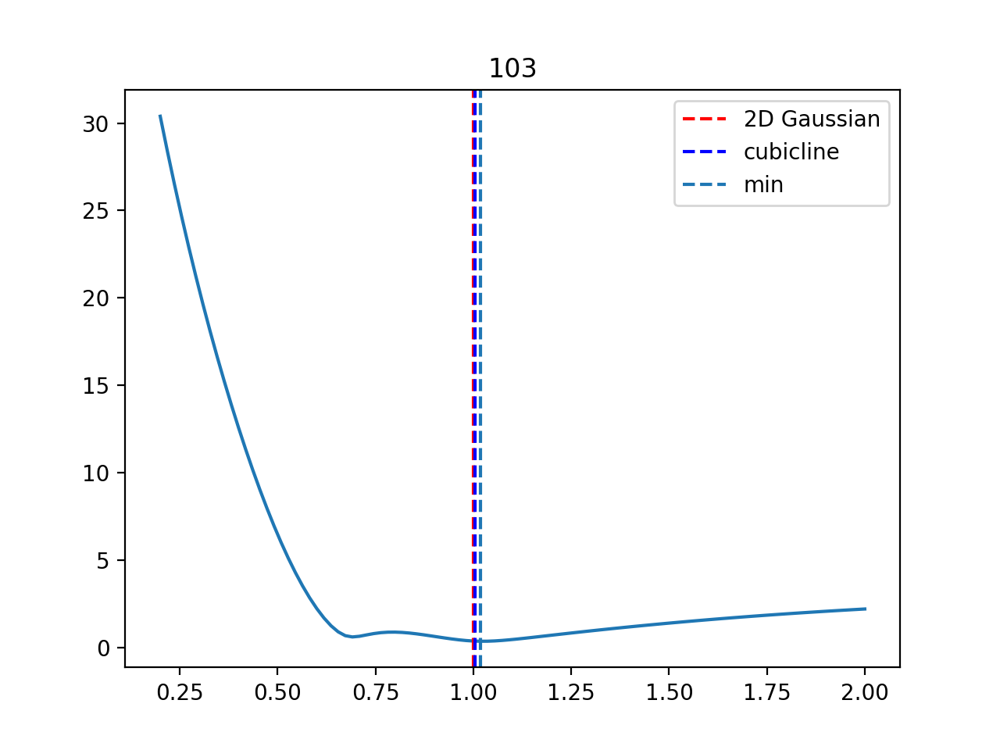

<IPython.core.display.Javascript object>


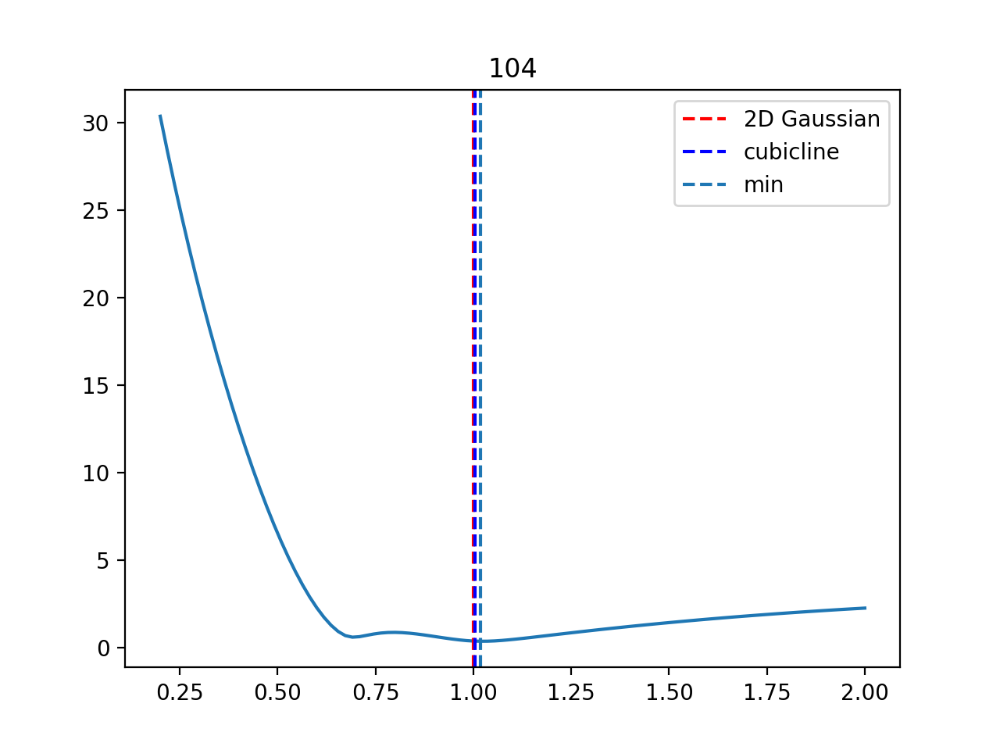

<IPython.core.display.Javascript object>


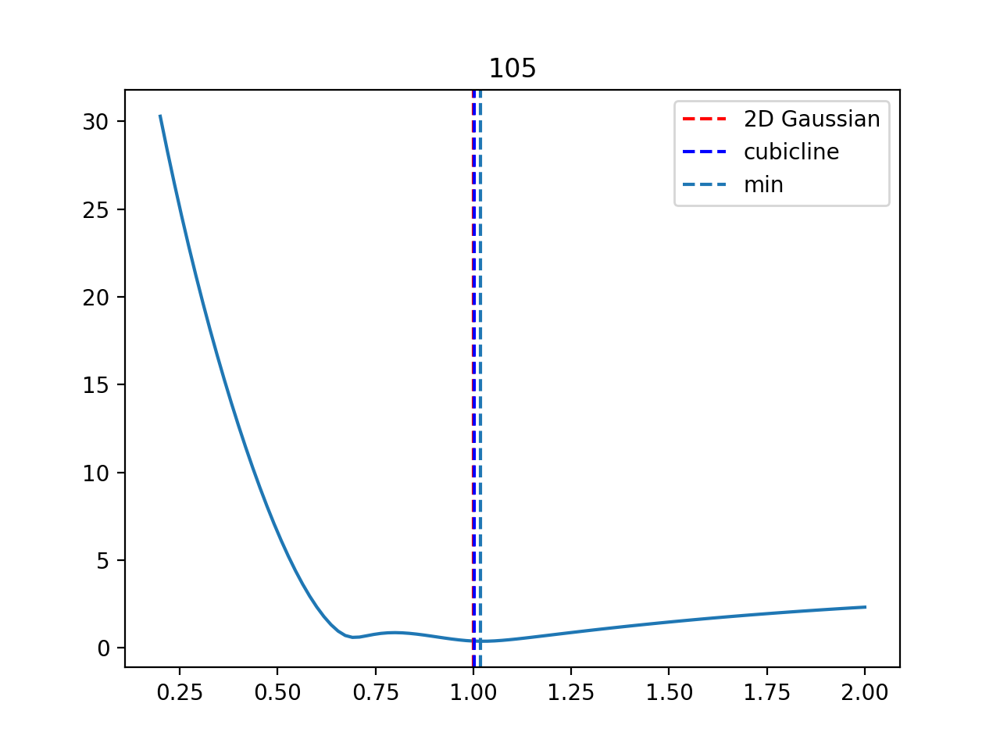

<IPython.core.display.Javascript object>


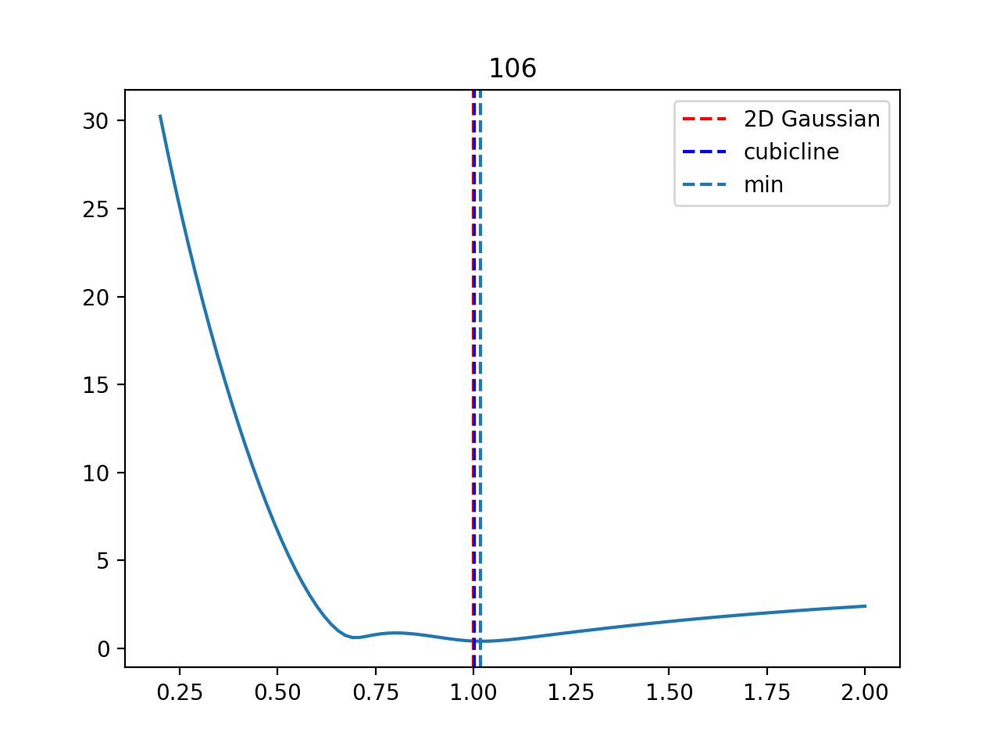

<IPython.core.display.Javascript object>


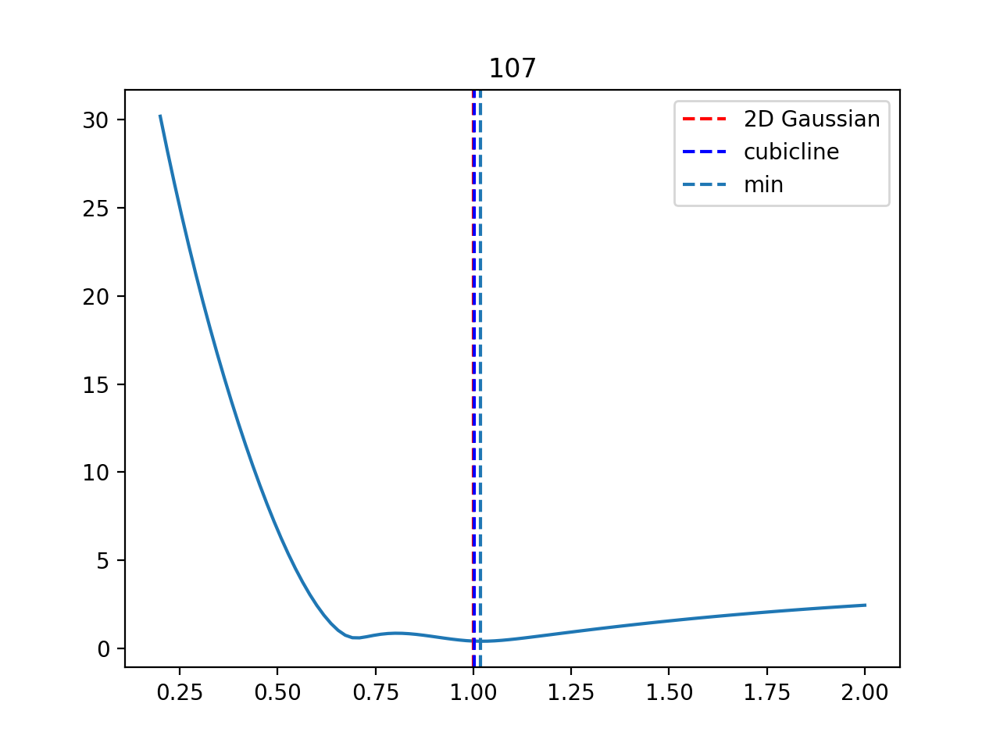

<IPython.core.display.Javascript object>


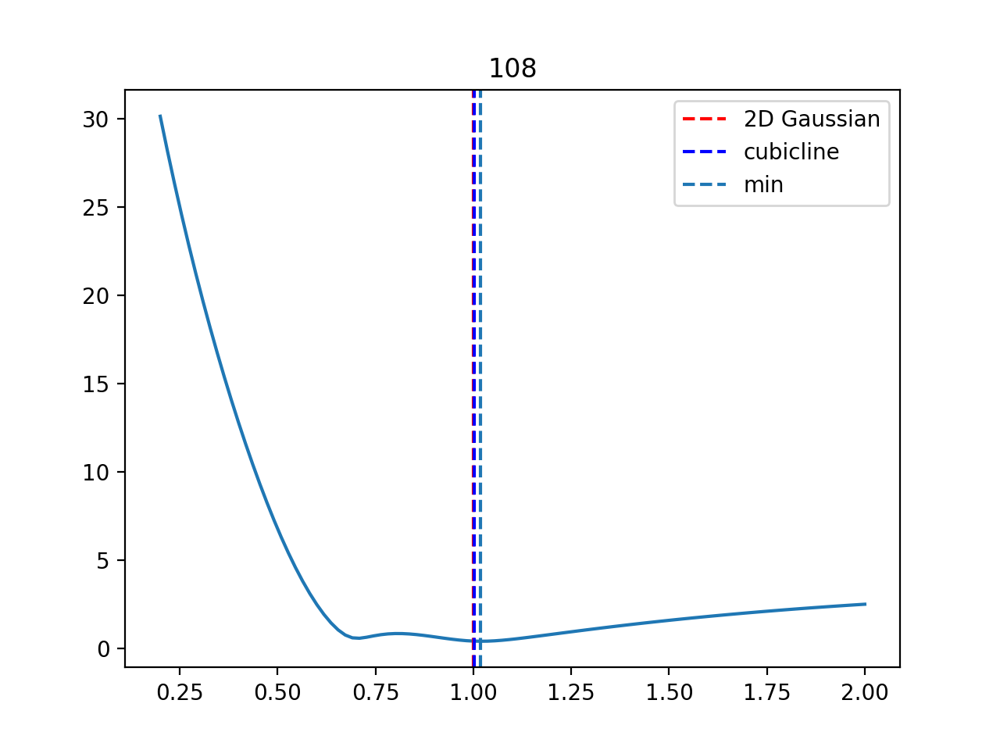

<IPython.core.display.Javascript object>


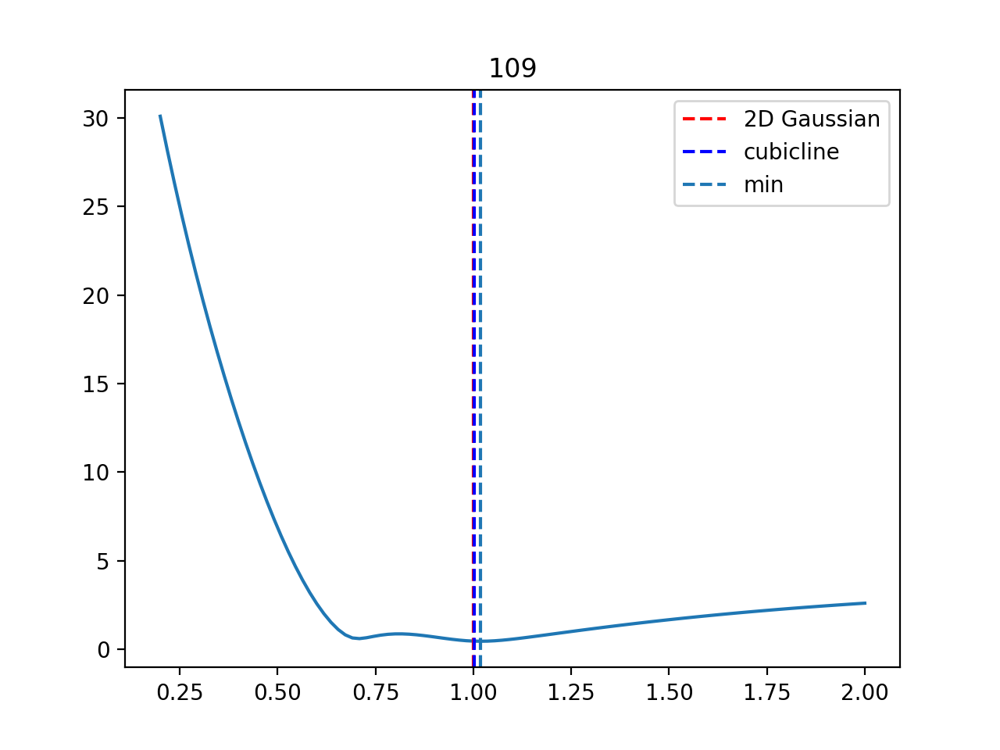

<IPython.core.display.Javascript object>


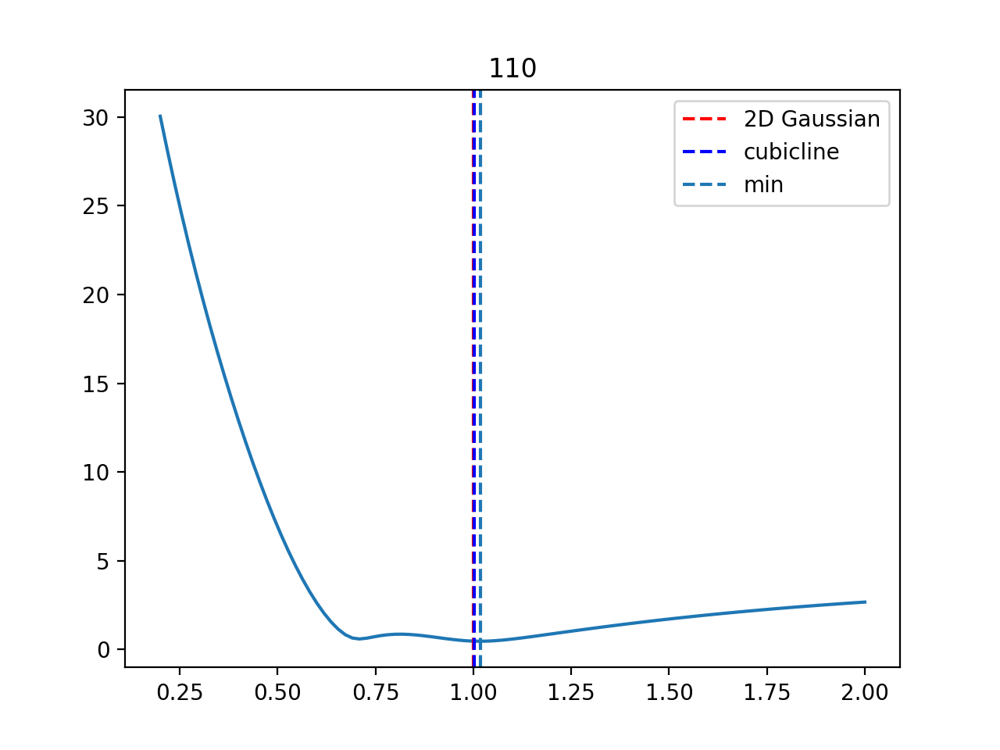

<IPython.core.display.Javascript object>


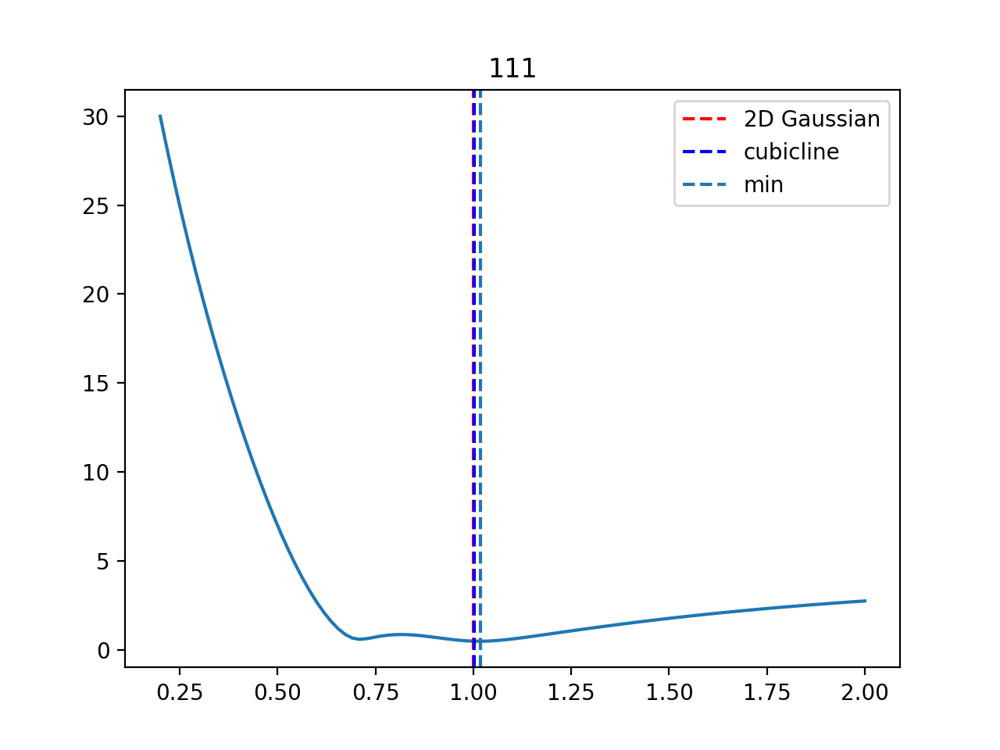

<IPython.core.display.Javascript object>


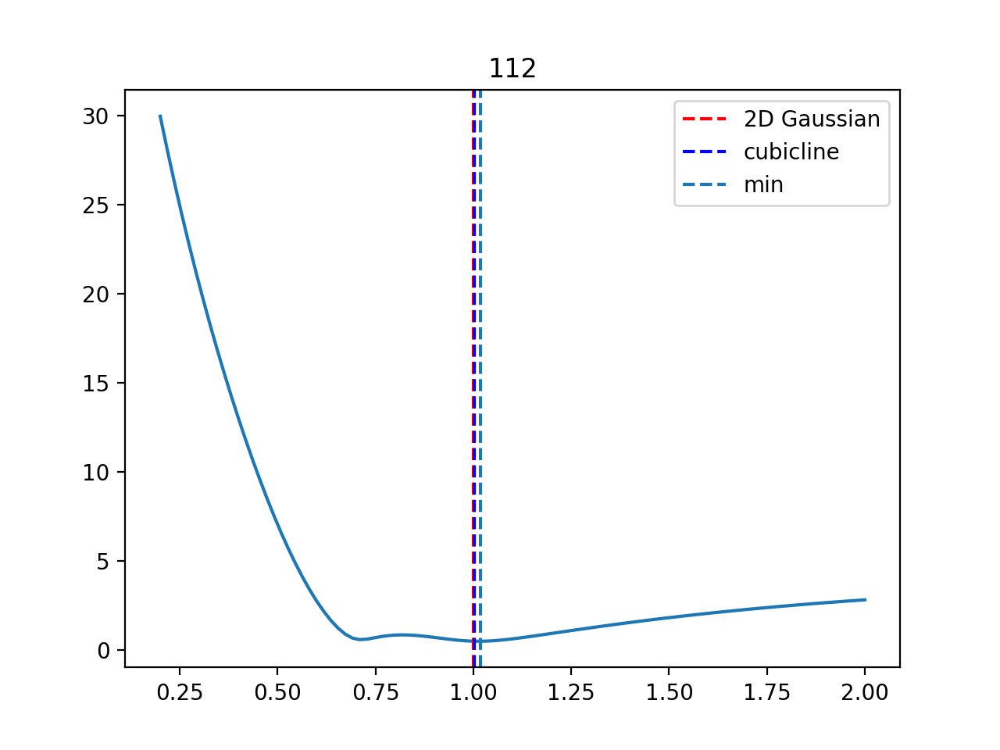

<IPython.core.display.Javascript object>


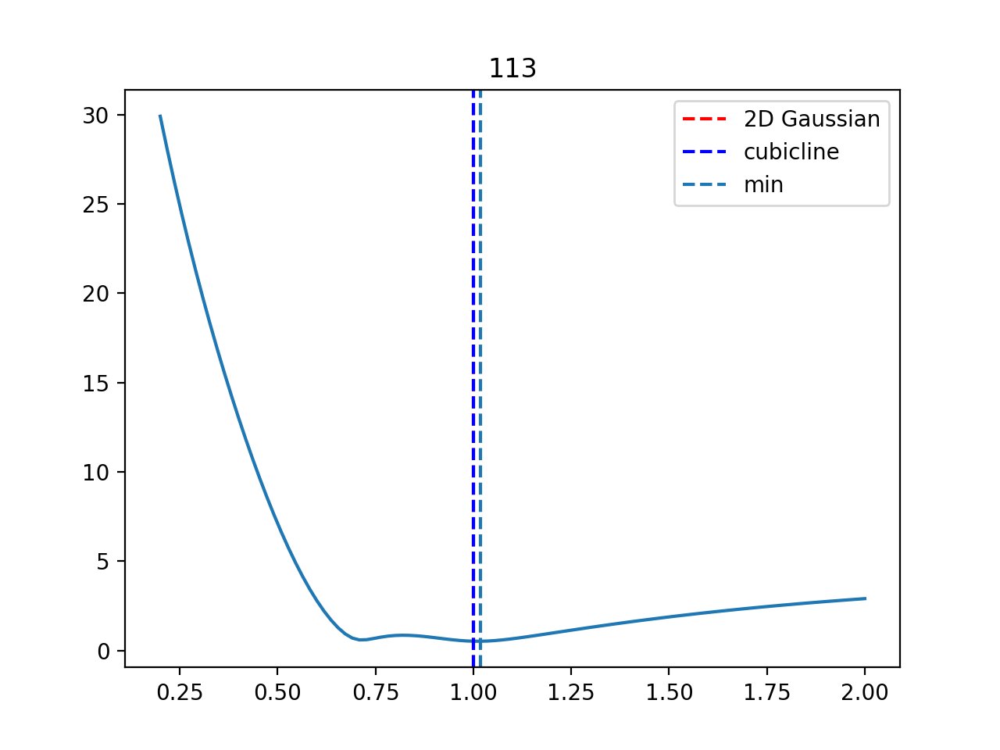

<IPython.core.display.Javascript object>


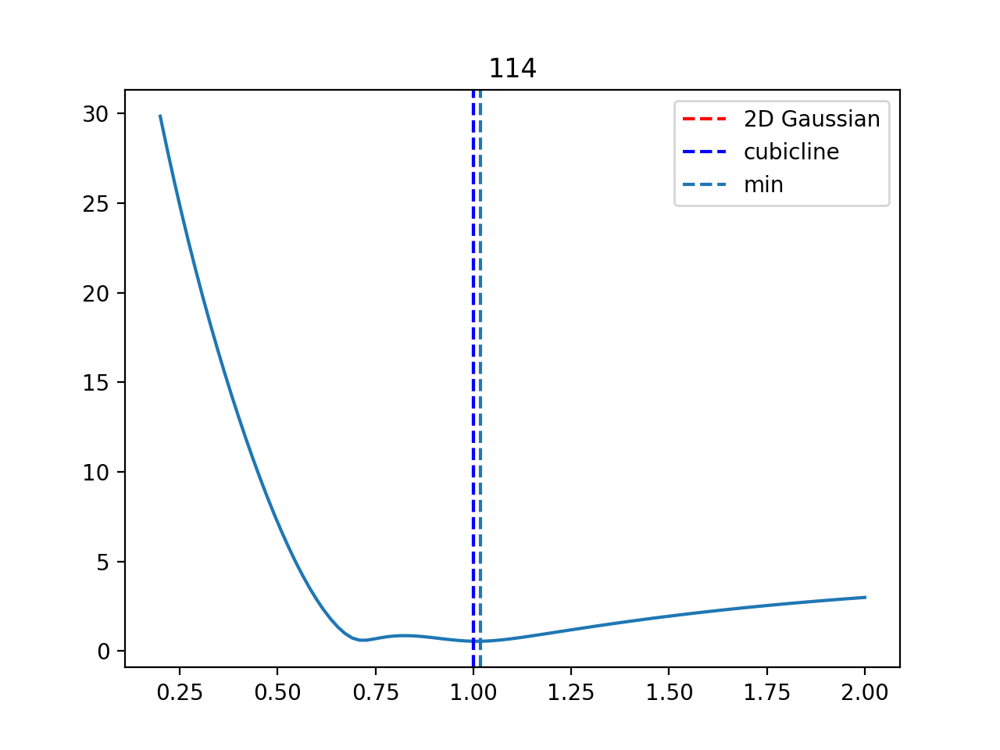

<IPython.core.display.Javascript object>


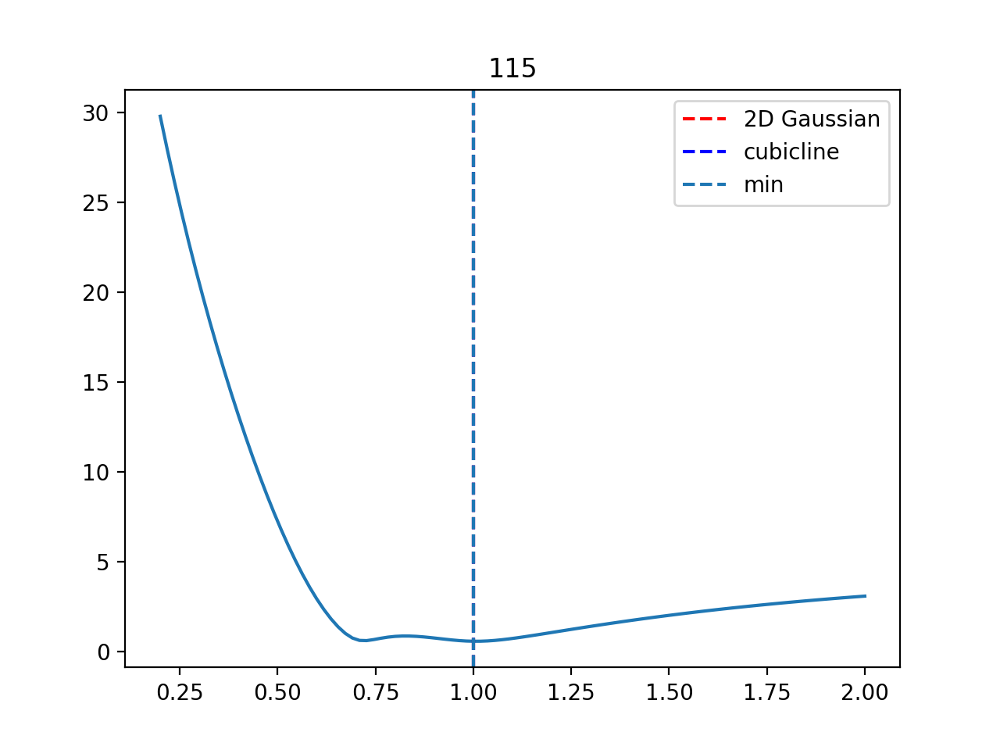

<IPython.core.display.Javascript object>


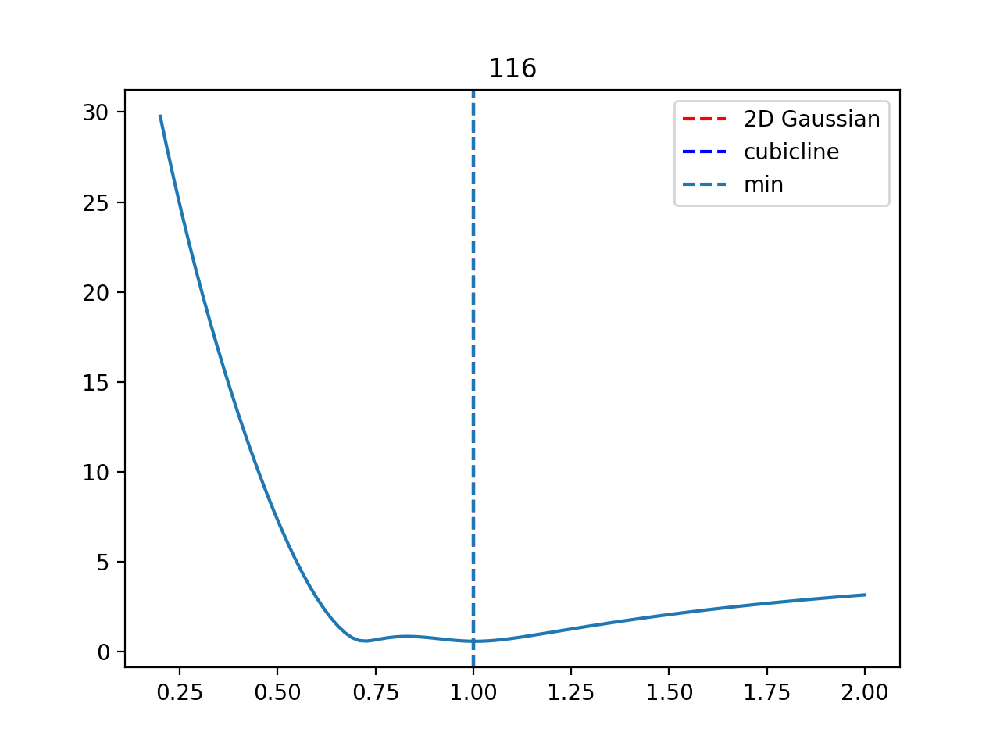

<IPython.core.display.Javascript object>


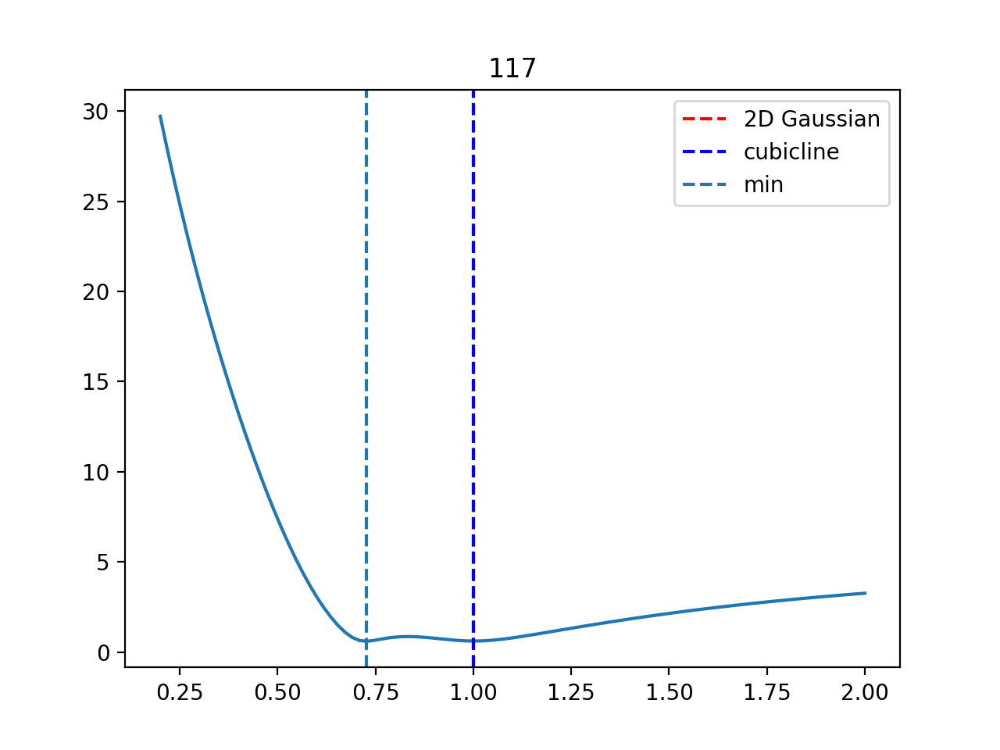

<IPython.core.display.Javascript object>


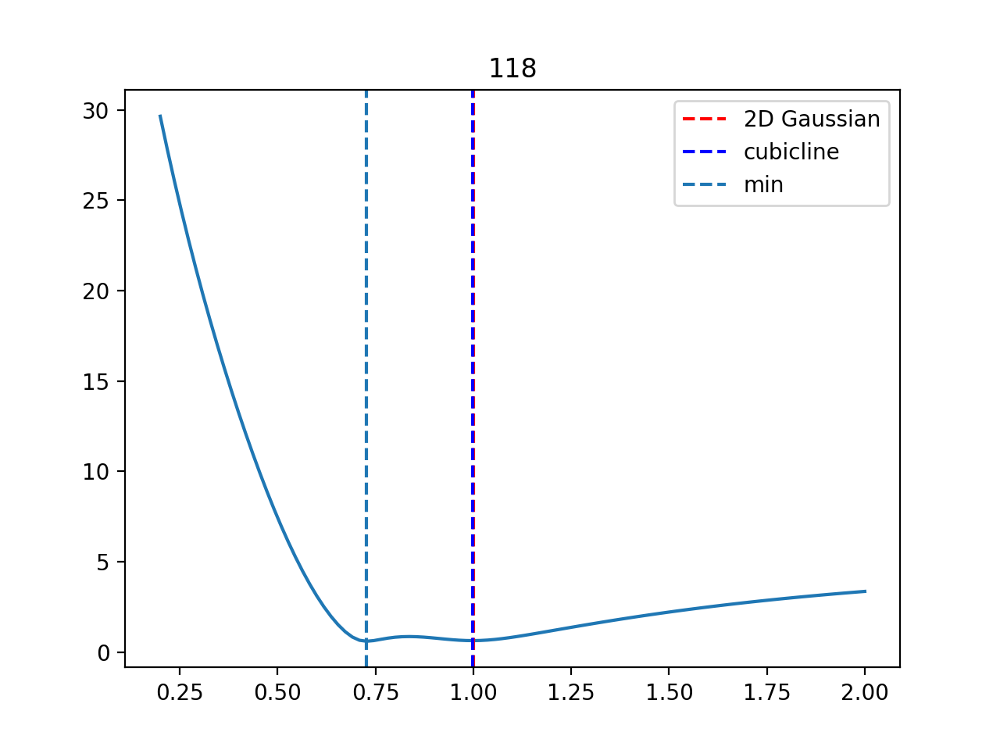

<IPython.core.display.Javascript object>


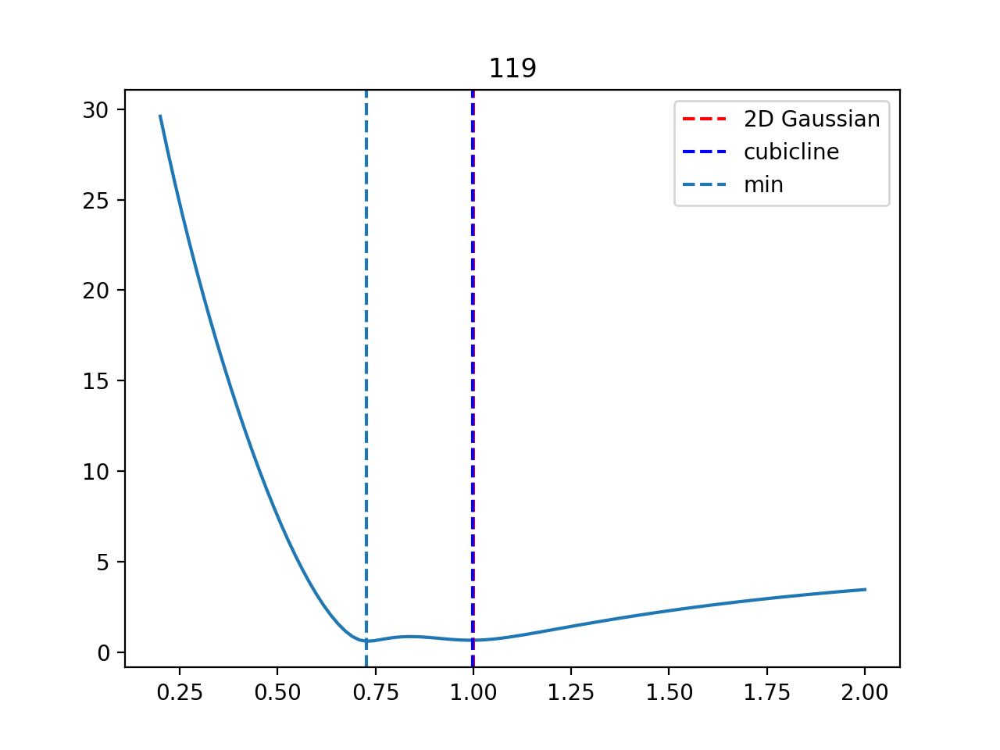

<IPython.core.display.Javascript object>


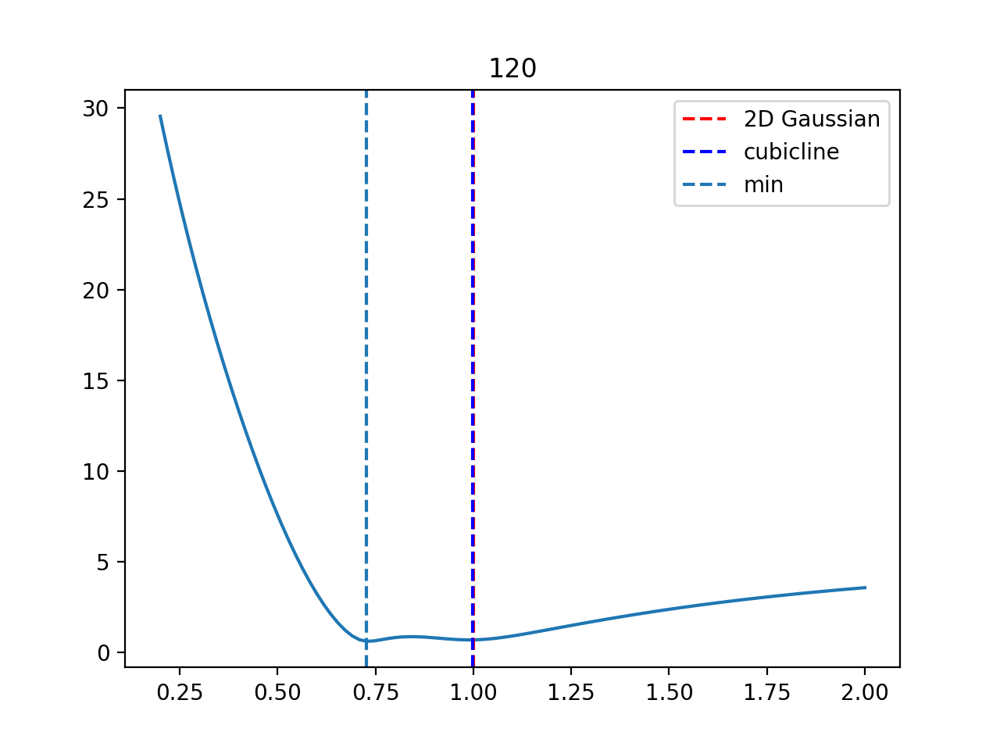

<IPython.core.display.Javascript object>


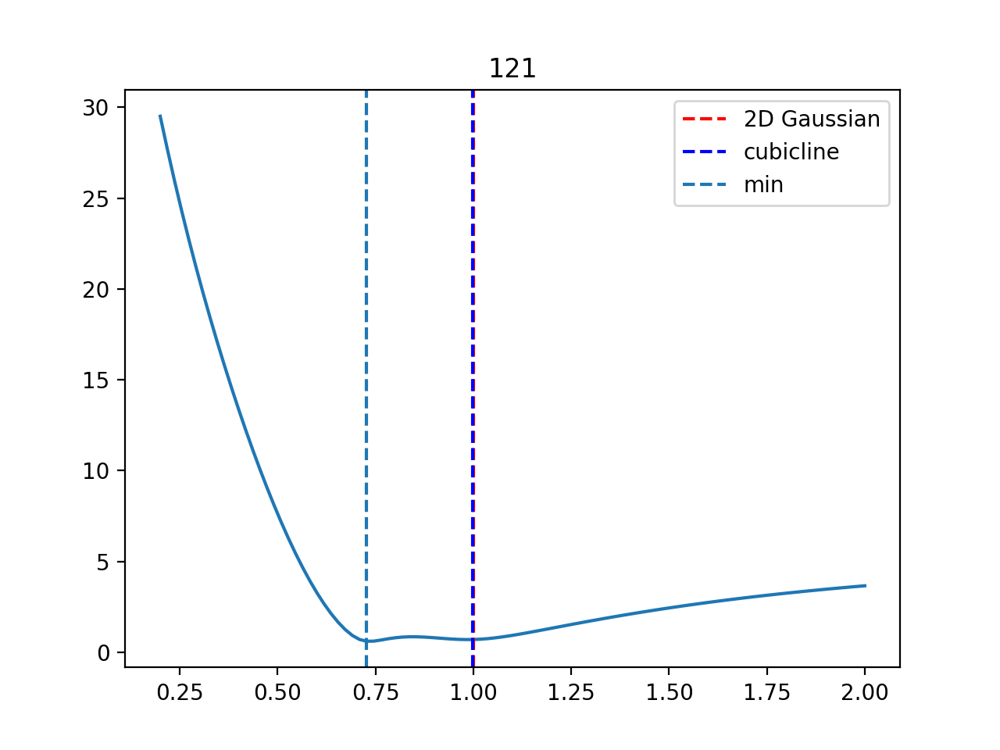

<IPython.core.display.Javascript object>


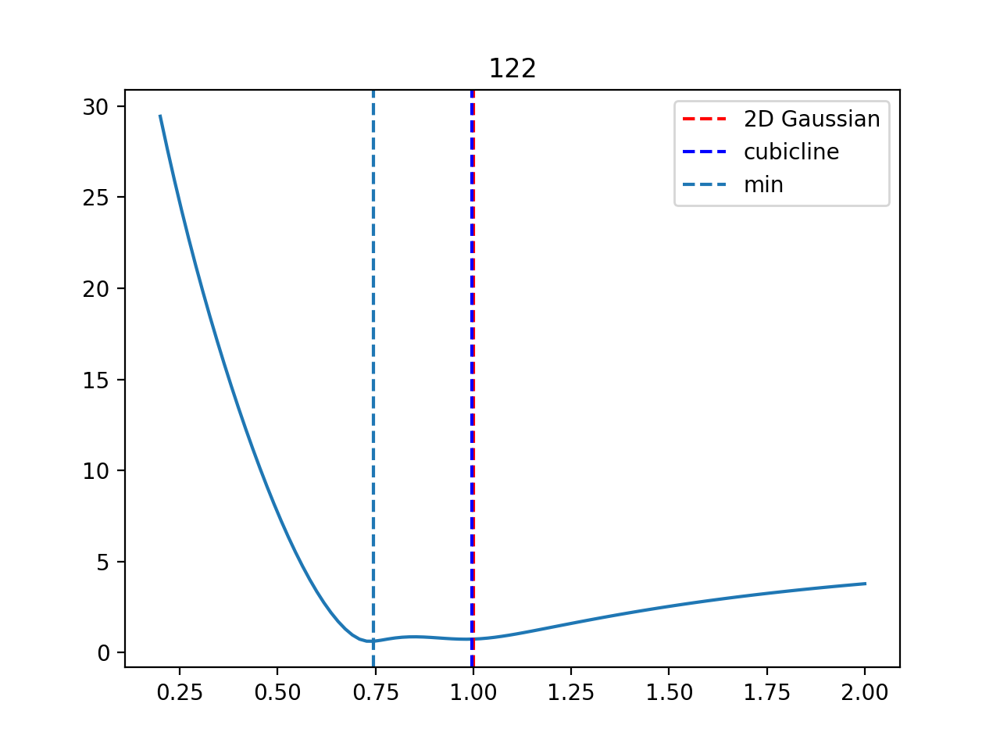

<IPython.core.display.Javascript object>


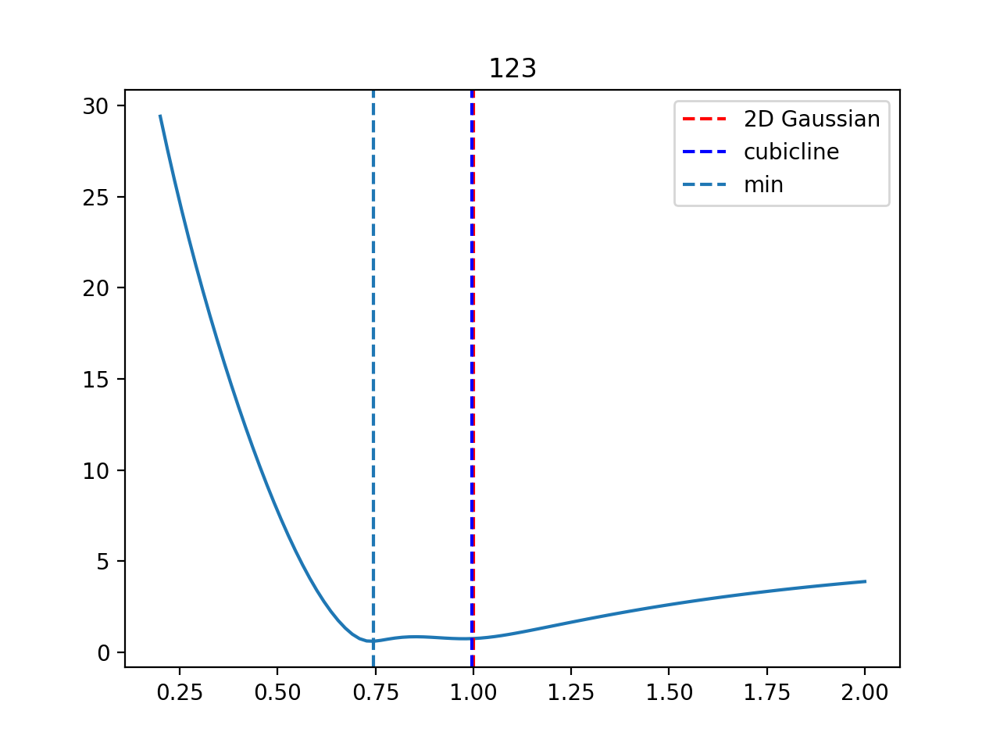

<IPython.core.display.Javascript object>


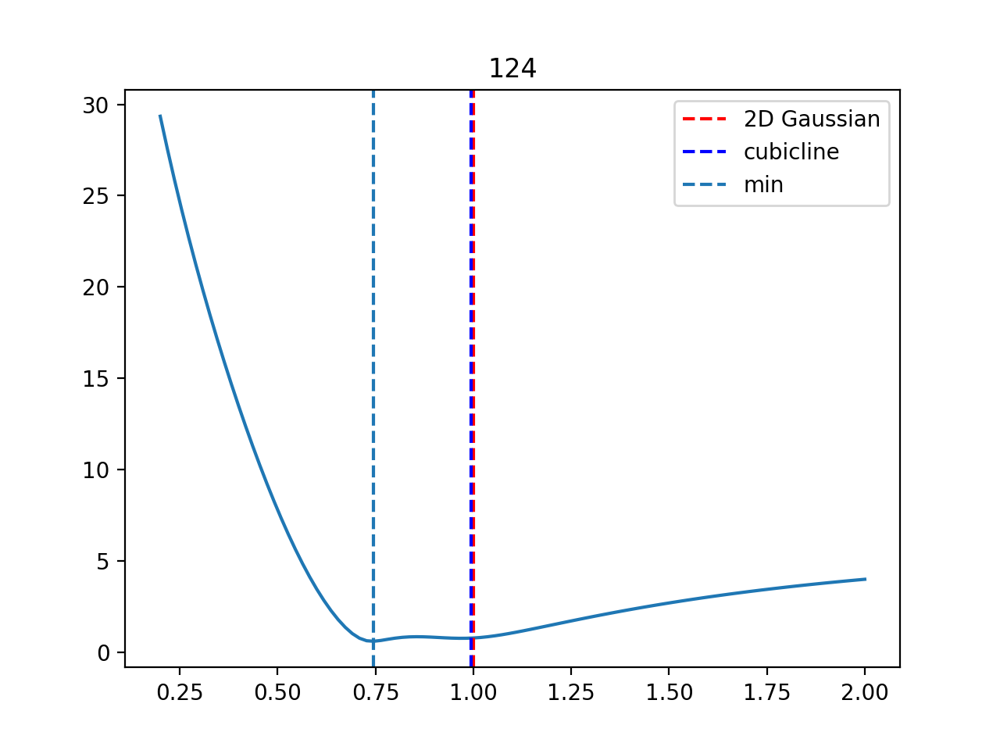

<IPython.core.display.Javascript object>


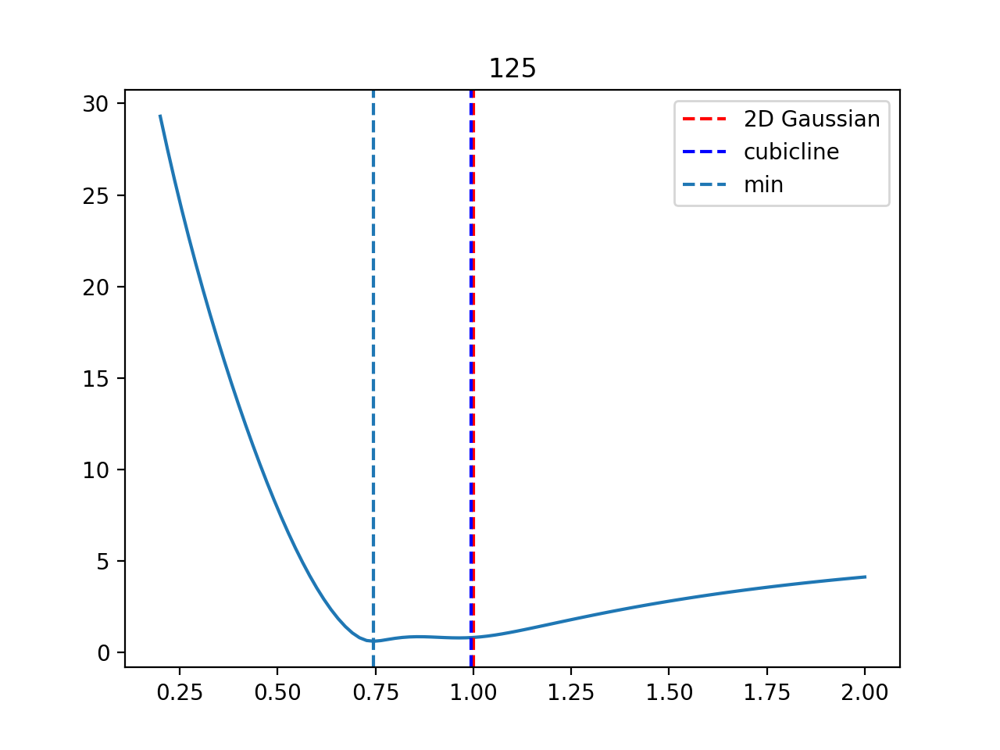

In [243]:
for i in range(len(pcall2)):
    minind = pcall2[i].index(min(pcall2[i]))
    minr = totalsigrange2[i][minind]/sigg[i+75]
    plt.figure()
    plt.plot(np.linspace(0.2,2,100),pcall2[i])
    plt.axvline(x = 1, color='r', linestyle='--', label = '2D Gaussian')
    plt.axvline(x = totalsigfwhm[i+75]/sigg[i+75], color='b', linestyle='--', label = 'cubicline')
    plt.axvline(x = minr, linestyle='--', label = 'min')
    plt.legend()
    plt.title(i+100)

<IPython.core.display.Javascript object>


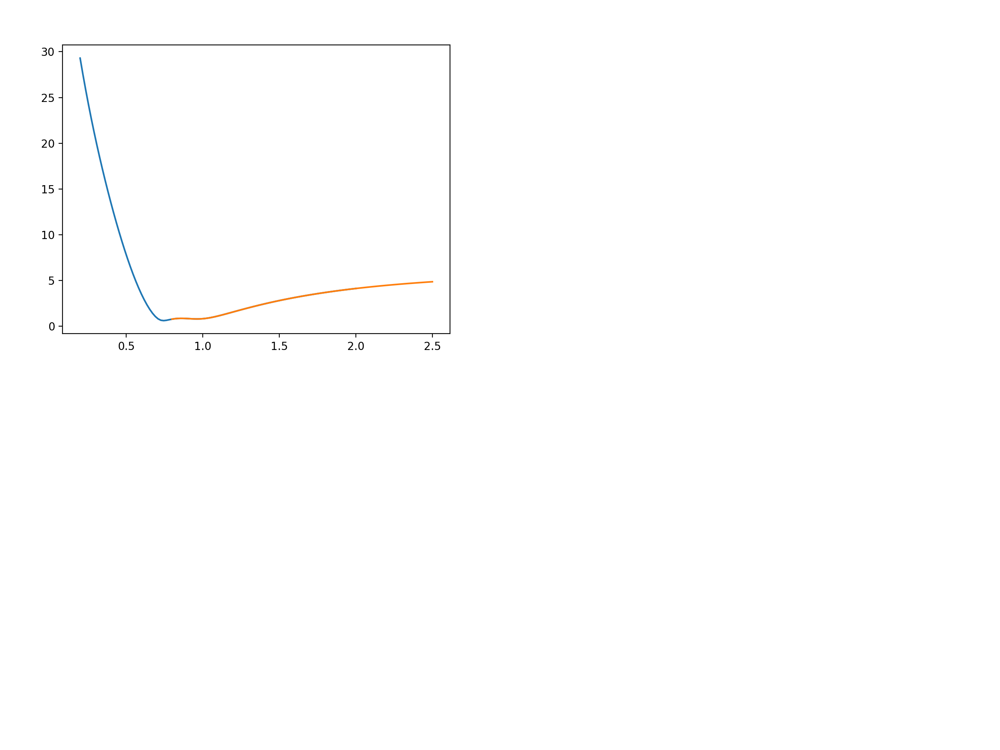

In [244]:
plt.figure()
plt.plot(np.linspace(0.2,2,100),pcall2[25])
plt.plot(np.linspace(0.8,2.5,100),pcall[100])